# 1. Introduction - Aly Khater, Justin Sun

In this lab, you will work with autoencoders and GANs.

# 2. Denoising Autoencoder 

Create a denoising autoencoder and a denoising variational autoencoder to remove noise using kaggle denoising competition. The denoising autoencoder competition can be found at https://www.kaggle.com/c/denoising-dirty-documents.

If you want to look at Variational Autoencoders to solve the problem, a good source can be found in:

https://keras.io/examples/generative/vae/

In [1]:
import glob
import os
import random
import shutil

os.environ["KERAS_BACKEND"] = "tensorflow"

import numpy as np
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
from keras import *
from keras import layers
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import pandas as pd
import zipfile
import os
import cv2

from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping

%matplotlib inline

In [2]:
import os

In [3]:
train_dir = "C:/Users/JSUNYHCOSMOS/Desktop/ELEN_521/denoising-dirty-documents/train/train"
train_cleaned_dir = "C:/Users/JSUNYHCOSMOS/Desktop/ELEN_521/denoising-dirty-documents/train_cleaned/train_cleaned"
test_dir = "C:/Users/JSUNYHCOSMOS/Desktop/ELEN_521/denoising-dirty-documents/test/test"

train_img = sorted(os.listdir(train_dir))
train_cleaned_img = sorted(os.listdir(train_cleaned_dir))
test_img = sorted(os.listdir(test_dir))

In [4]:
# prepare function
def process_image(path):
    img = cv2.imread(path)
    img = np.asarray(img, dtype="float32")
    img = cv2.resize(img, (540, 420))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = img/255.0
    img = np.reshape(img, (420, 540, 1))
    
    return img

In [5]:
# preprocess images
train = []
train_cleaned = []
test = []

# Correctly constructing the file path
for f in sorted(os.listdir(train_dir)):
    full_path = os.path.join(train_dir, f)  # Correctly join paths
    train.append(process_image(full_path))

for f in sorted(os.listdir(train_cleaned_dir)):
    full_path = os.path.join(train_cleaned_dir, f)  # Correctly join paths
    train_cleaned.append(process_image(full_path))

for f in sorted(os.listdir(test_dir)):
    full_path = os.path.join(test_dir, f)  # Correctly join paths
    test.append(process_image(full_path))

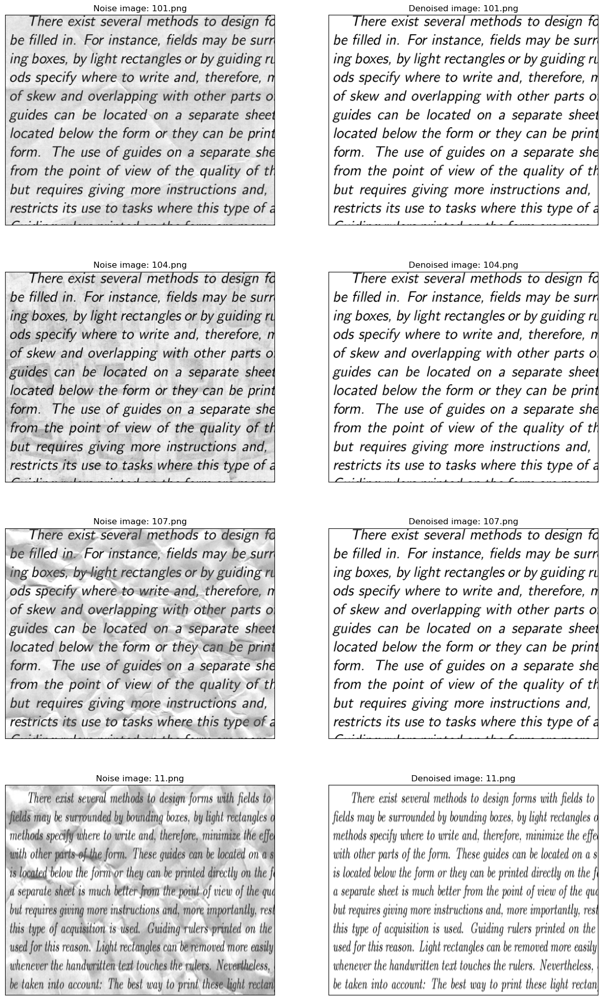

In [6]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train[i][:,:,0], cmap='gray')
    plt.title('Noise image: {}'.format(train_img[i]))
    
    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_cleaned[i][:,:,0], cmap='gray')
    plt.title('Denoised image: {}'.format(train_img[i]))

plt.show()

In [7]:
# convert list to numpy array
X_train = np.asarray(train)
Y_train = np.asarray(train_cleaned)
X_test = np.asarray(test)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.15)

In [8]:
def model():
    input_layer = Input(shape=(420, 540, 1))  # we might define (None,None,1) here, but in model summary dims would not be visible
    
    # encoding
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_layer)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    x = MaxPooling2D((2, 2), padding='same')(x)
    
    x = Dropout(0.5)(x)

    # decoding
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    x = UpSampling2D((2, 2))(x)

    output_layer = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
    model = Model(inputs=[input_layer], outputs=[output_layer])
    model.compile(optimizer='adam' , loss='mean_squared_error', metrics=['mae'])

    return model


model = model()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 420, 540, 64)      640       
                                                                 
 conv2d_1 (Conv2D)           (None, 420, 540, 128)     73856     
                                                                 
 batch_normalization (BatchN  (None, 420, 540, 128)    512       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 210, 270, 128)    0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 210, 270, 128)     0     

In [9]:
callback = EarlyStopping(monitor='loss', patience=30)
history = model.fit(X_train, Y_train, validation_data = (X_val, Y_val), epochs=600, batch_size=8, verbose=True, callbacks=[callback])

Epoch 1/600
16/16 [==============================] - 26s 508ms/step - loss: 0.1138 - mae: 0.2350 - val_loss: 0.1472 - val_mae: 0.3718
Epoch 2/600
16/16 [==============================] - 3s 182ms/step - loss: 0.0458 - mae: 0.1461 - val_loss: 0.0901 - val_mae: 0.2785
Epoch 3/600
16/16 [==============================] - 3s 182ms/step - loss: 0.0320 - mae: 0.1187 - val_loss: 0.0726 - val_mae: 0.2267
Epoch 4/600
16/16 [==============================] - 3s 187ms/step - loss: 0.0243 - mae: 0.1016 - val_loss: 0.0664 - val_mae: 0.1891
Epoch 5/600
16/16 [==============================] - 3s 183ms/step - loss: 0.0193 - mae: 0.0911 - val_loss: 0.0668 - val_mae: 0.1654
Epoch 6/600
16/16 [==============================] - 3s 187ms/step - loss: 0.0152 - mae: 0.0841 - val_loss: 0.0683 - val_mae: 0.1496
Epoch 7/600
16/16 [==============================] - 3s 184ms/step - loss: 0.0118 - mae: 0.0722 - val_loss: 0.0696 - val_mae: 0.1393
Epoch 8/600
16/16 [==============================] - 3s 190ms/step -

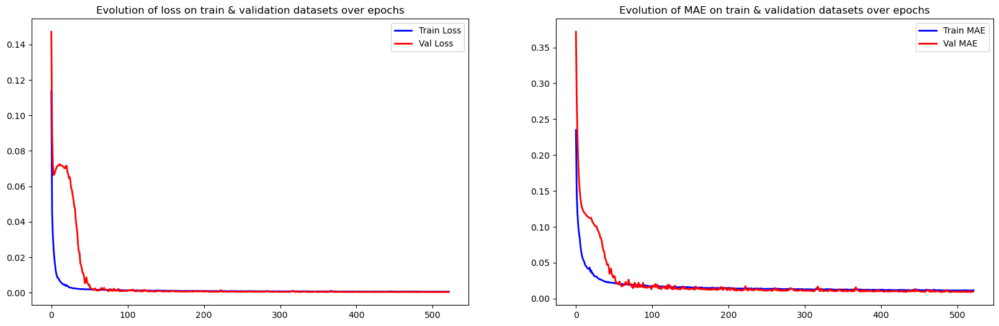

In [10]:
# Check how loss & mae went down
epoch_loss = history.history['loss']
epoch_val_loss = history.history['val_loss']
epoch_mae = history.history['mae']
epoch_val_mae = history.history['val_mae']

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.subplot(1,2,2)
plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

In [11]:
# predict/clean test images
Y_test = model.predict(X_test, batch_size=16)

5/5 [==============================] - 2s 57ms/step


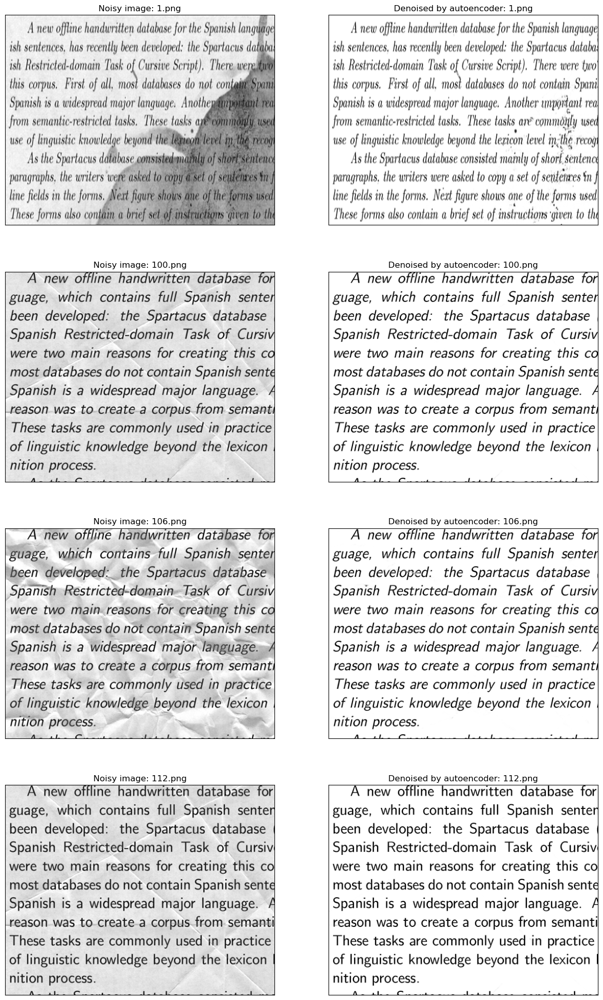

In [12]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[i][:,:,0], cmap='gray')
    plt.title('Noisy image: {}'.format(test_img[i]))
    
    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Y_test[i][:,:,0], cmap='gray')
    plt.title('Denoised by autoencoder: {}'.format(test_img[i]))

plt.show()

# 3. DCGAN

Look at https://keras.io/examples/generative/dcgan_overriding_train_step/. 

We will use a DCGAN to generate new pokemons or african fabric images.

Datasets can be found in:

- https://www.kaggle.com/vishalsubbiah/pokemon-images-and-types
- https://www.kaggle.com/mikuns/african-fabric



In [2]:
batch_size = 64
data_dir = "pokemon"
pokemon = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir, batch_size=batch_size, image_size=(64, 64))

Found 809 files belonging to 1 classes.


In [3]:
def transform_func(X):
    X = X / 255.
    X = (X - 0.5) / (0.5)
    return X

# For TF>=2.4 use `num_parallel_calls = tf.data.AUTOTUNE`
data_iter = pokemon.map(lambda x, y: (transform_func(x), y),
                        num_parallel_calls=tf.data.experimental.AUTOTUNE)
data_iter = data_iter.cache().shuffle(buffer_size=1000).prefetch(
    buffer_size=tf.data.experimental.AUTOTUNE)

<Figure size 400x400 with 0 Axes>

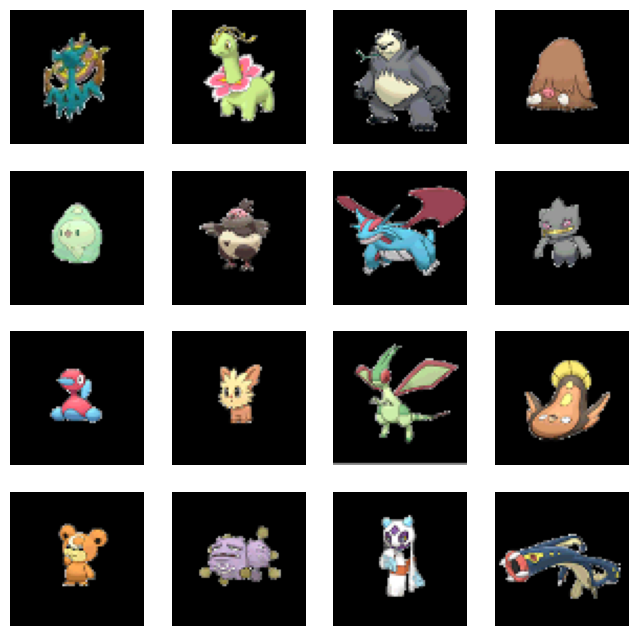

In [4]:
plt.figure(figsize=(4, 4))
num_rows = 4
num_cols = 4
# Get a batch of images
for X, y in data_iter.take(1):
    imgs = X[:20, :, :, :] / 2 + 0.5  # Normalize images to [0, 1]
    break  # We only need one batch

# Display the images
fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 2, num_rows * 2))
for i, ax in enumerate(axs.flat):
    ax.imshow(imgs[i].numpy().squeeze(), cmap='gray')
    ax.axis('off')  # Hide grid lines
plt.show()

In [5]:
class G_block(tf.keras.layers.Layer):
    def __init__(self, out_channels, kernel_size=4, strides=2, padding="same",
                 **kwargs):
        super().__init__(**kwargs)
        self.conv2d_trans = tf.keras.layers.Conv2DTranspose(
            out_channels, kernel_size, strides, padding, use_bias=False)
        self.batch_norm = tf.keras.layers.BatchNormalization()
        self.activation = tf.keras.layers.ReLU()

    def call(self, X):
        return self.activation(self.batch_norm(self.conv2d_trans(X)))

In [6]:
class D_block(tf.keras.layers.Layer):
    def __init__(self, out_channels, kernel_size=4, strides=2, padding="same",
                 alpha=0.2, **kwargs):
        super().__init__(**kwargs)
        self.conv2d = tf.keras.layers.Conv2D(out_channels, kernel_size,
                                             strides, padding, use_bias=False)
        self.batch_norm = tf.keras.layers.BatchNormalization()
        self.activation = tf.keras.layers.LeakyReLU(alpha)
        self.dropout = tf.keras.layers.Dropout(0.3)

    def call(self, X):
        return self.activation(self.batch_norm(self.conv2d(X)))

In [7]:
x = tf.zeros((2, 16, 16, 3))  # Channel last convention
g_blk = G_block(20)
g_blk(x).shape

TensorShape([2, 32, 32, 20])

In [8]:
x = tf.zeros((2, 1, 1, 3))
# `padding="valid"` corresponds to no padding
g_blk = G_block(20, strides=1, padding="valid")
g_blk(x).shape

TensorShape([2, 4, 4, 20])

In [9]:
n_G = 64
net_G = tf.keras.Sequential([
    # Output: (4, 4, 64 * 8)
    #tf.keras.layers.Dense(64*64*512),
    G_block(out_channels=n_G*8, strides=1, padding="valid"),
    G_block(out_channels=n_G*4), # Output: (8, 8, 64 * 4)
    G_block(out_channels=n_G*2), # Output: (16, 16, 64 * 2)
    G_block(out_channels=n_G), # Output: (32, 32, 64)
    # Output: (64, 64, 3)
    tf.keras.layers.Conv2DTranspose(
        3, kernel_size=4, strides=2, padding="same", use_bias=False,
        activation="tanh"),
    #BatchNormalization()
])

In [10]:
n_D = 64
net_D = tf.keras.Sequential([
    D_block(n_D), # Output: (32, 32, 64)
    D_block(out_channels=n_D*2), # Output: (16, 16, 64 * 2)
    D_block(out_channels=n_D*4), # Output: (8, 8, 64 * 4)
    D_block(out_channels=n_D*8), # Outupt: (4, 4, 64 * 64)
    # Output: (1, 1, 1)
    tf.keras.layers.Conv2D(1, kernel_size=4, use_bias=False),
    #BatchNormalization()
])

In [11]:
x = tf.zeros((1, 1, 1, 100))
net_G(x).shape

TensorShape([1, 64, 64, 3])

In [12]:
x = tf.zeros((1, 64, 64, 3))
net_D(x).shape

TensorShape([1, 1, 1, 1])

In [13]:
net_G.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
g_block_2 (G_block)          (1, 4, 4, 512)            821248    
_________________________________________________________________
g_block_3 (G_block)          (1, 8, 8, 256)            2098176   
_________________________________________________________________
g_block_4 (G_block)          (1, 16, 16, 128)          524800    
_________________________________________________________________
g_block_5 (G_block)          (1, 32, 32, 64)           131328    
_________________________________________________________________
conv2d_transpose_6 (Conv2DTr (1, 64, 64, 3)            3072      
Total params: 3,578,624
Trainable params: 3,576,704
Non-trainable params: 1,920
_________________________________________________________________


In [14]:
net_D.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
d_block (D_block)            (1, 32, 32, 64)           3328      
_________________________________________________________________
d_block_1 (D_block)          (1, 16, 16, 128)          131584    
_________________________________________________________________
d_block_2 (D_block)          (1, 8, 8, 256)            525312    
_________________________________________________________________
d_block_3 (D_block)          (1, 4, 4, 512)            2099200   
_________________________________________________________________
conv2d_4 (Conv2D)            (1, 1, 1, 1)              8192      
Total params: 2,767,616
Trainable params: 2,765,696
Non-trainable params: 1,920
_________________________________________________________________


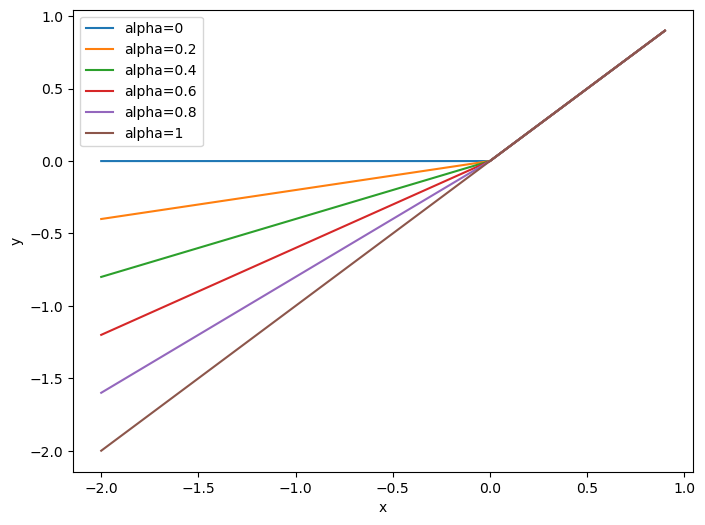

In [15]:
alphas = [0, .2, .4, .6, .8, 1]
x = tf.range(-2, 1, 0.1)
Y = [tf.keras.layers.LeakyReLU(alpha)(x).numpy() for alpha in alphas]
plt.figure(figsize=(8, 6))
for y, alpha in zip(Y, alphas):
    plt.plot(x.numpy(), y, label=f'alpha={alpha}')

plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

In [16]:
#@save
def update_D(X, Z, net_D, net_G, loss, optimizer_D):
    """Update discriminator."""
    batch_size = X.shape[0]
    ones = tf.ones((batch_size,)) # Labels corresponding to real data
    zeros = tf.zeros((batch_size,)) # Labels corresponding to fake data
    # Do not need to compute gradient for `net_G`, so it is outside GradientTape
    fake_X = net_G(Z)
    with tf.GradientTape() as tape:
        real_Y = net_D(X)
        fake_Y = net_D(fake_X)
        # We multiply the loss by batch_size to match PyTorch's BCEWithLogitsLoss
        loss_D = (loss(ones, tf.squeeze(real_Y)) + loss(
            zeros, tf.squeeze(fake_Y))) * batch_size / 2
    grads_D = tape.gradient(loss_D, net_D.trainable_variables)
    optimizer_D.apply_gradients(zip(grads_D, net_D.trainable_variables))
    return loss_D

In [17]:
#@save
def update_G(Z, net_D, net_G, loss, optimizer_G):
    """Update generator."""
    batch_size = Z.shape[0]
    ones = tf.ones((batch_size,))
    with tf.GradientTape() as tape:
        # We could reuse `fake_X` from `update_D` to save computation
        fake_X = net_G(Z)
        # Recomputing `fake_Y` is needed since `net_D` is changed
        fake_Y = net_D(fake_X)
        # We multiply the loss by batch_size to match PyTorch's BCEWithLogits loss
        loss_G = loss(ones, tf.squeeze(fake_Y)) * batch_size
    grads_G = tape.gradient(loss_G, net_G.trainable_variables)
    optimizer_G.apply_gradients(zip(grads_G, net_G.trainable_variables))
    return loss_G

In [18]:
x = tf.zeros((2, 16, 16, 3))
d_blk = D_block(20)
d_blk(x).shape

TensorShape([2, 8, 8, 20])

In [19]:
import time
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

def train(net_D, net_G, data_iter, num_epochs, lr_D, lr_G, latent_dim):
    loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    decay_steps_D = 1000 
    decay_rate_D = 0.96 
    decay_steps_G = 1000  
    decay_rate_G = 0.96 

    lr_schedule_D = tf.keras.optimizers.schedules.ExponentialDecay(
        lr_D,
        decay_steps=decay_steps_D,
        decay_rate=decay_rate_D,
        staircase=True)

    lr_schedule_G = tf.keras.optimizers.schedules.ExponentialDecay(
        lr_G,
        decay_steps=decay_steps_G,
        decay_rate=decay_rate_G,
        staircase=True)

    
    # Initialize weights
    for w in net_D.trainable_variables:
        w.assign(tf.random.normal(mean=0, stddev=0.02, shape=w.shape))
    for w in net_G.trainable_variables:
        w.assign(tf.random.normal(mean=0, stddev=0.02, shape=w.shape))

    # Optimizers
    #optimizer_hpD = {learning_rate=lr_schedule_D, beta_1=0.5, beta_2=0.999}
    #optimizer_hpG = {learning_rate=lr_schedule_G, beta_1=0.5, beta_2=0.999}
    optimizer_D = tf.keras.optimizers.Adam(learning_rate=lr_D, beta_1=0.5, beta_2=0.999)
    optimizer_G = tf.keras.optimizers.Adam(learning_rate=lr_G, beta_1=0.5, beta_2=0.999)

    # Loss history for plotting
    loss_D_history = []
    loss_G_history = []

    for epoch in range(1, num_epochs + 1):
        start_time = time.time()
        loss_D_sum, loss_G_sum, num_examples = 0, 0, 0
        
        for X, _ in data_iter:
            batch_size = X.shape[0]
            Z = tf.random.normal(mean=0, stddev=1, shape=(batch_size, 1, 1, latent_dim))

            # Update discriminator and generator, functions to be defined according to your model structure
            loss_D, loss_G = update_D(X, Z, net_D, net_G, loss, optimizer_D), update_G(Z, net_D, net_G, loss, optimizer_G)

            loss_D_sum += loss_D * batch_size
            loss_G_sum += loss_G * batch_size
            num_examples += batch_size

        loss_D_avg = loss_D_sum / num_examples
        loss_G_avg = loss_G_sum / num_examples
        loss_D_history.append(loss_D_avg)
        loss_G_history.append(loss_G_avg)

        # Timing
        epoch_time = time.time() - start_time

        # Print progress
        print(f'Epoch {epoch}, Loss_D {loss_D_avg:.3f}, Loss_G {loss_G_avg:.3f}, Time {epoch_time:.2f} sec')

        # Show generated examples periodically
        if epoch % 100 == 0 or epoch == 1:
            Z = tf.random.normal(mean=0, stddev=1, shape=(21, 1, 1, latent_dim))
            fake_x = net_G(Z) / 2 + 0.5  # Normalize to [0, 1]
            imgs = np.vstack([np.hstack([fake_x.numpy()[i * 7 + j] for j in range(7)]) for i in range(3)])
            plt.imshow(imgs.squeeze(), cmap='gray')
            plt.axis('off')
            plt.show()

    # Plot losses
    plt.figure(figsize=(10, 5))
    plt.plot(loss_D_history, label='Discriminator Loss')
    plt.plot(loss_G_history, label='Generator Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


Epoch 1, Loss_D 43.554, Loss_G 43.550, Time 2.29 sec


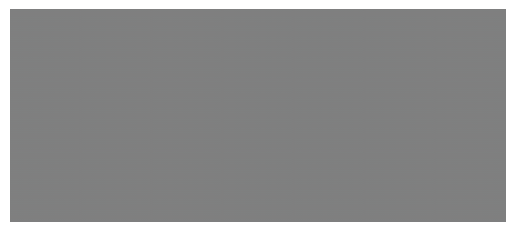

Epoch 2, Loss_D 43.553, Loss_G 43.554, Time 0.63 sec
Epoch 3, Loss_D 43.553, Loss_G 43.553, Time 0.62 sec
Epoch 4, Loss_D 43.553, Loss_G 43.553, Time 0.62 sec
Epoch 5, Loss_D 43.553, Loss_G 43.554, Time 0.62 sec
Epoch 6, Loss_D 43.553, Loss_G 43.554, Time 0.63 sec
Epoch 7, Loss_D 43.553, Loss_G 43.554, Time 0.62 sec
Epoch 8, Loss_D 43.553, Loss_G 43.556, Time 0.62 sec
Epoch 9, Loss_D 43.551, Loss_G 43.562, Time 0.62 sec
Epoch 10, Loss_D 43.545, Loss_G 43.563, Time 0.62 sec
Epoch 11, Loss_D 43.313, Loss_G 43.850, Time 0.62 sec
Epoch 12, Loss_D 41.551, Loss_G 45.914, Time 0.62 sec
Epoch 13, Loss_D 33.690, Loss_G 52.287, Time 0.63 sec
Epoch 14, Loss_D 37.743, Loss_G 49.928, Time 0.62 sec
Epoch 15, Loss_D 33.181, Loss_G 54.540, Time 0.62 sec
Epoch 16, Loss_D 32.922, Loss_G 60.172, Time 0.62 sec
Epoch 17, Loss_D 31.144, Loss_G 63.876, Time 0.62 sec
Epoch 18, Loss_D 34.101, Loss_G 60.924, Time 0.62 sec
Epoch 19, Loss_D 34.477, Loss_G 63.288, Time 0.62 sec
Epoch 20, Loss_D 29.771, Loss_G 66.6

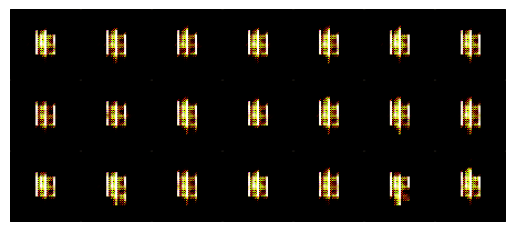

Epoch 101, Loss_D 43.530, Loss_G 44.117, Time 0.63 sec
Epoch 102, Loss_D 43.387, Loss_G 44.248, Time 0.62 sec
Epoch 103, Loss_D 43.300, Loss_G 44.296, Time 0.63 sec
Epoch 104, Loss_D 43.718, Loss_G 43.178, Time 0.63 sec
Epoch 105, Loss_D 43.707, Loss_G 42.090, Time 0.63 sec
Epoch 106, Loss_D 43.079, Loss_G 43.976, Time 0.63 sec
Epoch 107, Loss_D 43.289, Loss_G 42.941, Time 0.63 sec
Epoch 108, Loss_D 43.681, Loss_G 44.054, Time 0.63 sec
Epoch 109, Loss_D 43.420, Loss_G 44.328, Time 0.63 sec
Epoch 110, Loss_D 43.216, Loss_G 44.250, Time 0.63 sec
Epoch 111, Loss_D 44.009, Loss_G 42.273, Time 0.63 sec
Epoch 112, Loss_D 43.921, Loss_G 44.002, Time 0.63 sec
Epoch 113, Loss_D 43.719, Loss_G 44.046, Time 0.63 sec
Epoch 114, Loss_D 43.616, Loss_G 43.708, Time 0.63 sec
Epoch 115, Loss_D 43.673, Loss_G 43.676, Time 0.63 sec
Epoch 116, Loss_D 43.608, Loss_G 42.977, Time 0.62 sec
Epoch 117, Loss_D 43.590, Loss_G 43.862, Time 0.63 sec
Epoch 118, Loss_D 43.526, Loss_G 43.599, Time 0.63 sec
Epoch 119,

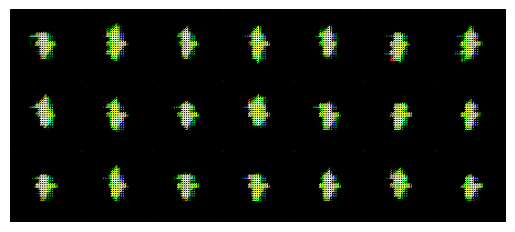

Epoch 201, Loss_D 43.649, Loss_G 44.038, Time 0.63 sec
Epoch 202, Loss_D 43.593, Loss_G 43.833, Time 0.63 sec
Epoch 203, Loss_D 43.477, Loss_G 42.998, Time 0.62 sec
Epoch 204, Loss_D 43.808, Loss_G 43.509, Time 0.63 sec
Epoch 205, Loss_D 43.615, Loss_G 44.042, Time 0.62 sec
Epoch 206, Loss_D 43.515, Loss_G 43.967, Time 0.62 sec
Epoch 207, Loss_D 43.615, Loss_G 43.183, Time 0.62 sec
Epoch 208, Loss_D 43.262, Loss_G 43.045, Time 0.63 sec
Epoch 209, Loss_D 43.899, Loss_G 43.679, Time 0.62 sec
Epoch 210, Loss_D 43.567, Loss_G 44.059, Time 0.63 sec
Epoch 211, Loss_D 43.480, Loss_G 43.951, Time 0.63 sec
Epoch 212, Loss_D 43.505, Loss_G 43.517, Time 0.63 sec
Epoch 213, Loss_D 43.259, Loss_G 43.358, Time 0.63 sec
Epoch 214, Loss_D 43.676, Loss_G 43.576, Time 0.63 sec
Epoch 215, Loss_D 43.413, Loss_G 44.052, Time 0.63 sec
Epoch 216, Loss_D 43.413, Loss_G 43.698, Time 0.62 sec
Epoch 217, Loss_D 43.309, Loss_G 43.353, Time 0.63 sec
Epoch 218, Loss_D 43.476, Loss_G 43.412, Time 0.63 sec
Epoch 219,

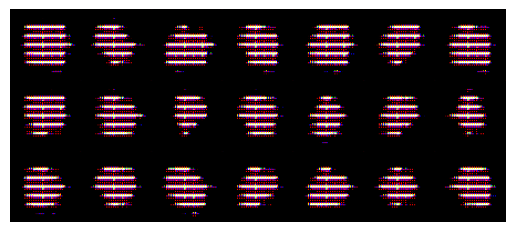

Epoch 301, Loss_D 38.977, Loss_G 49.714, Time 0.63 sec
Epoch 302, Loss_D 35.282, Loss_G 56.791, Time 0.62 sec
Epoch 303, Loss_D 30.720, Loss_G 65.814, Time 0.62 sec
Epoch 304, Loss_D 27.581, Loss_G 73.498, Time 0.63 sec
Epoch 305, Loss_D 18.625, Loss_G 101.483, Time 0.62 sec
Epoch 306, Loss_D 17.067, Loss_G 119.214, Time 0.63 sec
Epoch 307, Loss_D 8.060, Loss_G 178.016, Time 0.63 sec
Epoch 308, Loss_D 4.316, Loss_G 209.707, Time 0.63 sec
Epoch 309, Loss_D 3.151, Loss_G 229.691, Time 0.63 sec
Epoch 310, Loss_D 1.309, Loss_G 269.520, Time 0.62 sec
Epoch 311, Loss_D 0.883, Loss_G 297.621, Time 0.62 sec
Epoch 312, Loss_D 0.432, Loss_G 338.333, Time 0.62 sec
Epoch 313, Loss_D 0.292, Loss_G 364.571, Time 0.63 sec
Epoch 314, Loss_D 0.221, Loss_G 381.547, Time 0.63 sec
Epoch 315, Loss_D 0.179, Loss_G 396.507, Time 0.62 sec
Epoch 316, Loss_D 0.151, Loss_G 405.618, Time 0.62 sec
Epoch 317, Loss_D 0.129, Loss_G 417.149, Time 0.63 sec
Epoch 318, Loss_D 0.110, Loss_G 429.394, Time 0.62 sec
Epoch 31

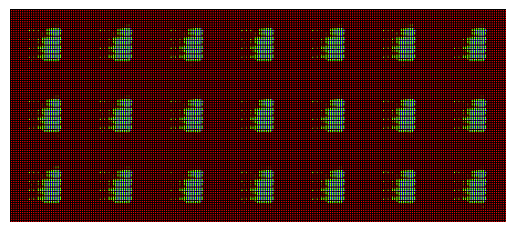

Epoch 401, Loss_D 0.004, Loss_G 642.064, Time 0.63 sec
Epoch 402, Loss_D 0.004, Loss_G 643.313, Time 0.63 sec
Epoch 403, Loss_D 0.004, Loss_G 644.323, Time 0.63 sec
Epoch 404, Loss_D 0.004, Loss_G 645.466, Time 0.62 sec
Epoch 405, Loss_D 0.004, Loss_G 646.610, Time 0.62 sec
Epoch 406, Loss_D 0.004, Loss_G 647.805, Time 0.63 sec
Epoch 407, Loss_D 0.004, Loss_G 649.082, Time 0.62 sec
Epoch 408, Loss_D 0.004, Loss_G 649.948, Time 0.63 sec
Epoch 409, Loss_D 0.004, Loss_G 651.135, Time 0.62 sec
Epoch 410, Loss_D 0.004, Loss_G 652.154, Time 0.62 sec
Epoch 411, Loss_D 0.004, Loss_G 653.373, Time 0.63 sec
Epoch 412, Loss_D 0.004, Loss_G 654.476, Time 0.63 sec
Epoch 413, Loss_D 0.003, Loss_G 655.585, Time 0.62 sec
Epoch 414, Loss_D 0.003, Loss_G 656.560, Time 0.62 sec
Epoch 415, Loss_D 0.003, Loss_G 657.601, Time 0.63 sec
Epoch 416, Loss_D 0.003, Loss_G 658.676, Time 0.63 sec
Epoch 417, Loss_D 0.003, Loss_G 659.631, Time 0.63 sec
Epoch 418, Loss_D 0.003, Loss_G 660.724, Time 0.63 sec
Epoch 419,

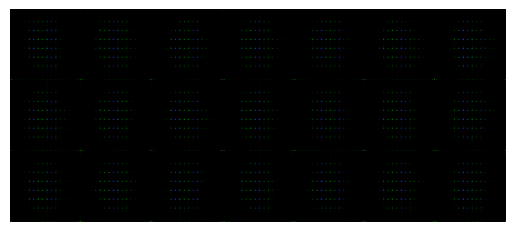

Epoch 501, Loss_D 0.022, Loss_G 511.292, Time 0.63 sec
Epoch 502, Loss_D 0.021, Loss_G 507.973, Time 0.63 sec
Epoch 503, Loss_D 0.020, Loss_G 508.385, Time 0.62 sec
Epoch 504, Loss_D 0.020, Loss_G 521.134, Time 0.63 sec
Epoch 505, Loss_D 0.019, Loss_G 513.442, Time 0.63 sec
Epoch 506, Loss_D 0.018, Loss_G 520.807, Time 0.63 sec
Epoch 507, Loss_D 0.017, Loss_G 523.681, Time 0.63 sec
Epoch 508, Loss_D 0.017, Loss_G 530.153, Time 0.62 sec
Epoch 509, Loss_D 0.016, Loss_G 525.421, Time 0.63 sec
Epoch 510, Loss_D 0.016, Loss_G 531.525, Time 0.62 sec
Epoch 511, Loss_D 0.015, Loss_G 530.265, Time 0.62 sec
Epoch 512, Loss_D 0.015, Loss_G 527.810, Time 0.63 sec
Epoch 513, Loss_D 0.016, Loss_G 530.719, Time 0.62 sec
Epoch 514, Loss_D 0.015, Loss_G 526.701, Time 0.63 sec
Epoch 515, Loss_D 0.015, Loss_G 534.716, Time 0.63 sec
Epoch 516, Loss_D 0.015, Loss_G 531.417, Time 0.62 sec
Epoch 517, Loss_D 0.014, Loss_G 535.444, Time 0.62 sec
Epoch 518, Loss_D 0.014, Loss_G 534.597, Time 0.62 sec
Epoch 519,

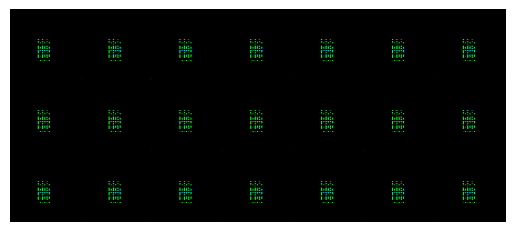

Epoch 601, Loss_D 0.003, Loss_G 622.842, Time 0.64 sec
Epoch 602, Loss_D 0.003, Loss_G 628.049, Time 0.62 sec
Epoch 603, Loss_D 0.003, Loss_G 629.775, Time 0.62 sec
Epoch 604, Loss_D 0.003, Loss_G 628.775, Time 0.63 sec
Epoch 605, Loss_D 0.003, Loss_G 628.852, Time 0.63 sec
Epoch 606, Loss_D 0.003, Loss_G 628.734, Time 0.62 sec
Epoch 607, Loss_D 0.003, Loss_G 629.302, Time 0.63 sec
Epoch 608, Loss_D 0.003, Loss_G 630.009, Time 0.63 sec
Epoch 609, Loss_D 0.003, Loss_G 633.519, Time 0.63 sec
Epoch 610, Loss_D 0.003, Loss_G 636.392, Time 0.62 sec
Epoch 611, Loss_D 0.003, Loss_G 633.496, Time 0.63 sec
Epoch 612, Loss_D 0.003, Loss_G 633.562, Time 0.63 sec
Epoch 613, Loss_D 0.003, Loss_G 636.504, Time 0.63 sec
Epoch 614, Loss_D 0.003, Loss_G 633.846, Time 0.62 sec
Epoch 615, Loss_D 0.003, Loss_G 638.639, Time 0.63 sec
Epoch 616, Loss_D 0.003, Loss_G 637.686, Time 0.63 sec
Epoch 617, Loss_D 0.003, Loss_G 637.465, Time 0.62 sec
Epoch 618, Loss_D 0.003, Loss_G 637.703, Time 0.63 sec
Epoch 619,

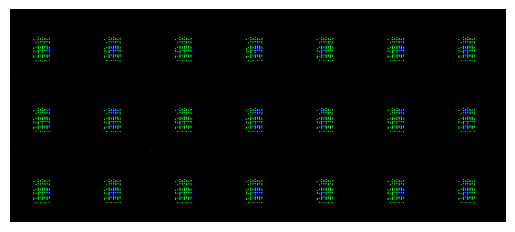

Epoch 701, Loss_D 0.001, Loss_G 694.288, Time 0.63 sec
Epoch 702, Loss_D 0.001, Loss_G 698.354, Time 0.63 sec
Epoch 703, Loss_D 0.001, Loss_G 697.084, Time 0.62 sec
Epoch 704, Loss_D 0.001, Loss_G 698.640, Time 0.62 sec
Epoch 705, Loss_D 0.001, Loss_G 698.628, Time 0.63 sec
Epoch 706, Loss_D 0.001, Loss_G 696.927, Time 0.62 sec
Epoch 707, Loss_D 0.001, Loss_G 702.010, Time 0.63 sec
Epoch 708, Loss_D 0.001, Loss_G 699.522, Time 0.63 sec
Epoch 709, Loss_D 0.001, Loss_G 702.617, Time 0.63 sec
Epoch 710, Loss_D 0.001, Loss_G 702.959, Time 0.63 sec
Epoch 711, Loss_D 0.021, Loss_G 568.137, Time 0.62 sec
Epoch 712, Loss_D 0.021, Loss_G 537.344, Time 0.62 sec
Epoch 713, Loss_D 0.010, Loss_G 560.499, Time 0.62 sec
Epoch 714, Loss_D 0.530, Loss_G 651.405, Time 0.63 sec
Epoch 715, Loss_D 0.031, Loss_G 554.598, Time 0.63 sec
Epoch 716, Loss_D 0.036, Loss_G 503.998, Time 0.62 sec
Epoch 717, Loss_D 0.022, Loss_G 520.963, Time 0.63 sec
Epoch 718, Loss_D 0.020, Loss_G 527.844, Time 0.64 sec
Epoch 719,

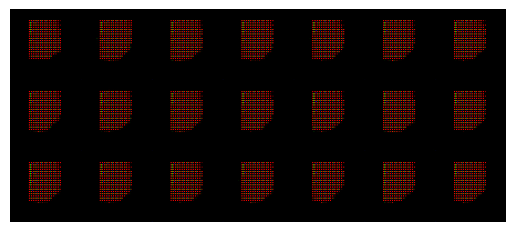

Epoch 801, Loss_D 0.001, Loss_G 705.024, Time 0.63 sec
Epoch 802, Loss_D 0.001, Loss_G 711.841, Time 0.62 sec
Epoch 803, Loss_D 0.001, Loss_G 703.113, Time 0.62 sec
Epoch 804, Loss_D 0.001, Loss_G 675.376, Time 0.63 sec
Epoch 805, Loss_D 0.001, Loss_G 675.265, Time 0.62 sec
Epoch 806, Loss_D 0.001, Loss_G 682.901, Time 0.62 sec
Epoch 807, Loss_D 0.001, Loss_G 688.645, Time 0.62 sec
Epoch 808, Loss_D 0.001, Loss_G 690.956, Time 0.63 sec
Epoch 809, Loss_D 0.001, Loss_G 692.481, Time 0.62 sec
Epoch 810, Loss_D 0.001, Loss_G 693.975, Time 0.62 sec
Epoch 811, Loss_D 0.001, Loss_G 696.372, Time 0.63 sec
Epoch 812, Loss_D 0.001, Loss_G 698.840, Time 0.62 sec
Epoch 813, Loss_D 0.001, Loss_G 695.902, Time 0.63 sec
Epoch 814, Loss_D 0.001, Loss_G 697.155, Time 0.63 sec
Epoch 815, Loss_D 0.001, Loss_G 705.459, Time 0.63 sec
Epoch 816, Loss_D 0.001, Loss_G 704.356, Time 0.62 sec
Epoch 817, Loss_D 0.001, Loss_G 705.385, Time 0.63 sec
Epoch 818, Loss_D 0.001, Loss_G 703.651, Time 0.62 sec
Epoch 819,

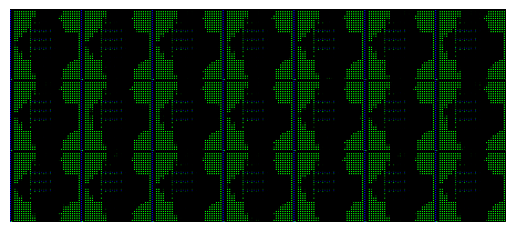

Epoch 901, Loss_D 0.000, Loss_G 782.847, Time 0.63 sec
Epoch 902, Loss_D 0.000, Loss_G 780.523, Time 0.63 sec
Epoch 903, Loss_D 0.000, Loss_G 781.995, Time 0.62 sec
Epoch 904, Loss_D 0.000, Loss_G 784.135, Time 0.63 sec
Epoch 905, Loss_D 0.000, Loss_G 784.584, Time 0.63 sec
Epoch 906, Loss_D 0.000, Loss_G 785.076, Time 0.63 sec
Epoch 907, Loss_D 0.000, Loss_G 786.976, Time 0.63 sec
Epoch 908, Loss_D 0.000, Loss_G 788.934, Time 0.64 sec
Epoch 909, Loss_D 0.000, Loss_G 790.128, Time 0.63 sec
Epoch 910, Loss_D 0.000, Loss_G 788.397, Time 0.63 sec
Epoch 911, Loss_D 0.000, Loss_G 791.261, Time 0.65 sec
Epoch 912, Loss_D 0.000, Loss_G 789.037, Time 0.63 sec
Epoch 913, Loss_D 0.000, Loss_G 791.744, Time 0.63 sec
Epoch 914, Loss_D 0.000, Loss_G 793.449, Time 0.62 sec
Epoch 915, Loss_D 0.000, Loss_G 791.974, Time 0.63 sec
Epoch 916, Loss_D 0.000, Loss_G 793.232, Time 0.63 sec
Epoch 917, Loss_D 0.000, Loss_G 796.705, Time 0.63 sec
Epoch 918, Loss_D 0.000, Loss_G 796.690, Time 0.63 sec
Epoch 919,

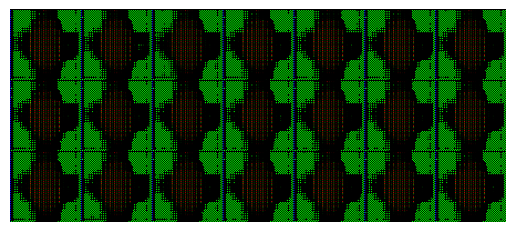

Epoch 1001, Loss_D 0.001, Loss_G 672.028, Time 0.66 sec
Epoch 1002, Loss_D 0.001, Loss_G 672.393, Time 0.62 sec
Epoch 1003, Loss_D 0.001, Loss_G 673.700, Time 0.62 sec
Epoch 1004, Loss_D 0.001, Loss_G 674.644, Time 0.62 sec
Epoch 1005, Loss_D 0.001, Loss_G 675.944, Time 0.63 sec
Epoch 1006, Loss_D 0.001, Loss_G 676.914, Time 0.63 sec
Epoch 1007, Loss_D 0.001, Loss_G 677.026, Time 0.62 sec
Epoch 1008, Loss_D 0.001, Loss_G 678.317, Time 0.62 sec
Epoch 1009, Loss_D 0.001, Loss_G 679.554, Time 0.62 sec
Epoch 1010, Loss_D 0.001, Loss_G 680.024, Time 0.62 sec
Epoch 1011, Loss_D 0.001, Loss_G 680.664, Time 0.62 sec
Epoch 1012, Loss_D 0.001, Loss_G 682.193, Time 0.62 sec
Epoch 1013, Loss_D 0.001, Loss_G 682.302, Time 0.63 sec
Epoch 1014, Loss_D 0.001, Loss_G 682.970, Time 0.62 sec
Epoch 1015, Loss_D 0.001, Loss_G 684.530, Time 0.62 sec
Epoch 1016, Loss_D 0.001, Loss_G 684.340, Time 0.62 sec
Epoch 1017, Loss_D 0.001, Loss_G 686.274, Time 0.62 sec
Epoch 1018, Loss_D 0.001, Loss_G 686.544, Time 0

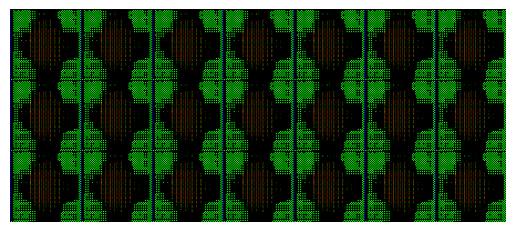

Epoch 1101, Loss_D 0.000, Loss_G 742.310, Time 0.63 sec
Epoch 1102, Loss_D 0.000, Loss_G 743.094, Time 0.62 sec
Epoch 1103, Loss_D 0.000, Loss_G 743.559, Time 0.62 sec
Epoch 1104, Loss_D 0.000, Loss_G 735.480, Time 0.62 sec
Epoch 1105, Loss_D 0.001, Loss_G 699.528, Time 0.63 sec
Epoch 1106, Loss_D 0.001, Loss_G 697.549, Time 0.62 sec
Epoch 1107, Loss_D 0.001, Loss_G 684.981, Time 0.62 sec
Epoch 1108, Loss_D 0.001, Loss_G 676.050, Time 0.62 sec
Epoch 1109, Loss_D 0.001, Loss_G 679.961, Time 0.62 sec
Epoch 1110, Loss_D 0.001, Loss_G 685.136, Time 0.62 sec
Epoch 1111, Loss_D 0.001, Loss_G 687.713, Time 0.62 sec
Epoch 1112, Loss_D 0.001, Loss_G 691.799, Time 0.62 sec
Epoch 1113, Loss_D 0.001, Loss_G 695.550, Time 0.62 sec
Epoch 1114, Loss_D 0.001, Loss_G 698.793, Time 0.63 sec
Epoch 1115, Loss_D 0.001, Loss_G 701.070, Time 0.62 sec
Epoch 1116, Loss_D 0.001, Loss_G 704.642, Time 0.63 sec
Epoch 1117, Loss_D 0.001, Loss_G 707.180, Time 0.62 sec
Epoch 1118, Loss_D 0.001, Loss_G 709.450, Time 0

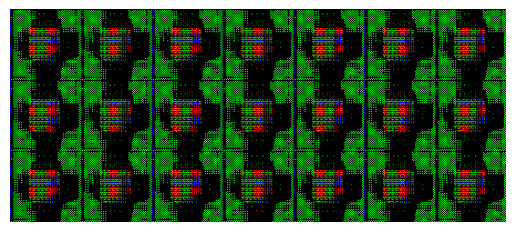

Epoch 1201, Loss_D 0.000, Loss_G 786.678, Time 0.63 sec
Epoch 1202, Loss_D 0.000, Loss_G 787.286, Time 0.62 sec
Epoch 1203, Loss_D 0.000, Loss_G 787.937, Time 0.63 sec
Epoch 1204, Loss_D 0.000, Loss_G 787.924, Time 0.63 sec
Epoch 1205, Loss_D 0.000, Loss_G 788.339, Time 0.63 sec
Epoch 1206, Loss_D 0.000, Loss_G 789.350, Time 0.62 sec
Epoch 1207, Loss_D 0.000, Loss_G 788.871, Time 0.63 sec
Epoch 1208, Loss_D 0.000, Loss_G 789.657, Time 0.62 sec
Epoch 1209, Loss_D 0.000, Loss_G 790.399, Time 0.63 sec
Epoch 1210, Loss_D 0.000, Loss_G 790.405, Time 0.63 sec
Epoch 1211, Loss_D 0.000, Loss_G 790.846, Time 0.63 sec
Epoch 1212, Loss_D 0.000, Loss_G 791.746, Time 0.62 sec
Epoch 1213, Loss_D 0.000, Loss_G 792.075, Time 0.62 sec
Epoch 1214, Loss_D 0.000, Loss_G 792.812, Time 0.63 sec
Epoch 1215, Loss_D 0.000, Loss_G 793.613, Time 0.62 sec
Epoch 1216, Loss_D 0.000, Loss_G 794.228, Time 0.62 sec
Epoch 1217, Loss_D 0.000, Loss_G 794.572, Time 0.63 sec
Epoch 1218, Loss_D 0.000, Loss_G 795.318, Time 0

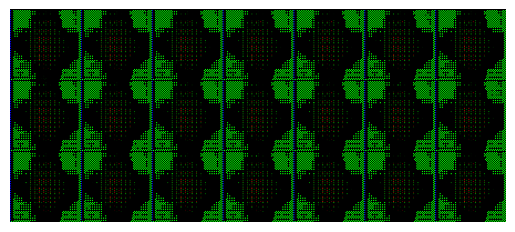

Epoch 1301, Loss_D 0.000, Loss_G 836.168, Time 0.63 sec
Epoch 1302, Loss_D 0.000, Loss_G 837.293, Time 0.63 sec
Epoch 1303, Loss_D 0.000, Loss_G 836.879, Time 0.63 sec
Epoch 1304, Loss_D 0.000, Loss_G 837.788, Time 0.63 sec
Epoch 1305, Loss_D 0.000, Loss_G 838.433, Time 0.63 sec
Epoch 1306, Loss_D 0.000, Loss_G 838.648, Time 0.63 sec
Epoch 1307, Loss_D 0.000, Loss_G 839.097, Time 0.62 sec
Epoch 1308, Loss_D 0.000, Loss_G 840.783, Time 0.62 sec
Epoch 1309, Loss_D 0.000, Loss_G 840.953, Time 0.62 sec
Epoch 1310, Loss_D 0.000, Loss_G 842.139, Time 0.63 sec
Epoch 1311, Loss_D 0.000, Loss_G 842.447, Time 0.62 sec
Epoch 1312, Loss_D 0.000, Loss_G 843.340, Time 0.63 sec
Epoch 1313, Loss_D 0.000, Loss_G 844.019, Time 0.62 sec
Epoch 1314, Loss_D 0.000, Loss_G 844.146, Time 0.62 sec
Epoch 1315, Loss_D 0.000, Loss_G 845.116, Time 0.62 sec
Epoch 1316, Loss_D 0.000, Loss_G 844.244, Time 0.63 sec
Epoch 1317, Loss_D 0.000, Loss_G 845.381, Time 0.62 sec
Epoch 1318, Loss_D 0.000, Loss_G 845.817, Time 0

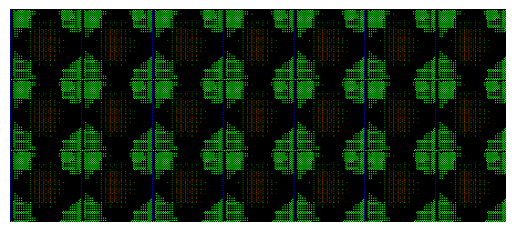

Epoch 1401, Loss_D 0.000, Loss_G 890.187, Time 0.63 sec
Epoch 1402, Loss_D 0.000, Loss_G 891.107, Time 0.62 sec
Epoch 1403, Loss_D 0.000, Loss_G 891.770, Time 0.62 sec
Epoch 1404, Loss_D 0.000, Loss_G 892.051, Time 0.63 sec
Epoch 1405, Loss_D 0.000, Loss_G 892.251, Time 0.62 sec
Epoch 1406, Loss_D 0.000, Loss_G 892.428, Time 0.62 sec
Epoch 1407, Loss_D 0.000, Loss_G 892.381, Time 0.62 sec
Epoch 1408, Loss_D 0.000, Loss_G 893.469, Time 0.62 sec
Epoch 1409, Loss_D 0.000, Loss_G 894.056, Time 0.62 sec
Epoch 1410, Loss_D 0.000, Loss_G 894.153, Time 0.63 sec
Epoch 1411, Loss_D 0.000, Loss_G 894.804, Time 0.63 sec
Epoch 1412, Loss_D 0.000, Loss_G 894.918, Time 0.63 sec
Epoch 1413, Loss_D 0.000, Loss_G 896.125, Time 0.63 sec
Epoch 1414, Loss_D 0.000, Loss_G 897.075, Time 0.63 sec
Epoch 1415, Loss_D 0.000, Loss_G 897.138, Time 0.63 sec
Epoch 1416, Loss_D 0.000, Loss_G 896.726, Time 0.63 sec
Epoch 1417, Loss_D 0.000, Loss_G 897.675, Time 0.63 sec
Epoch 1418, Loss_D 0.000, Loss_G 898.547, Time 0

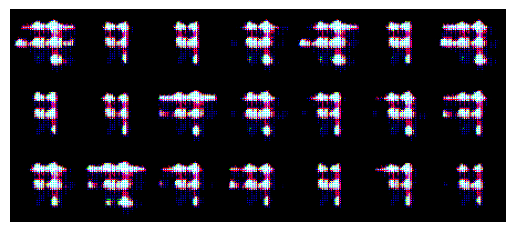

Epoch 1501, Loss_D 45.689, Loss_G 41.012, Time 0.63 sec
Epoch 1502, Loss_D 45.078, Loss_G 40.424, Time 0.63 sec
Epoch 1503, Loss_D 45.546, Loss_G 42.073, Time 0.63 sec
Epoch 1504, Loss_D 45.778, Loss_G 43.352, Time 0.62 sec
Epoch 1505, Loss_D 45.053, Loss_G 42.999, Time 0.64 sec
Epoch 1506, Loss_D 44.460, Loss_G 42.765, Time 0.62 sec
Epoch 1507, Loss_D 43.778, Loss_G 43.679, Time 0.62 sec
Epoch 1508, Loss_D 43.637, Loss_G 43.208, Time 0.62 sec
Epoch 1509, Loss_D 44.218, Loss_G 42.759, Time 0.62 sec
Epoch 1510, Loss_D 44.609, Loss_G 42.432, Time 0.63 sec
Epoch 1511, Loss_D 44.352, Loss_G 42.940, Time 0.64 sec
Epoch 1512, Loss_D 44.224, Loss_G 43.212, Time 0.63 sec
Epoch 1513, Loss_D 44.203, Loss_G 42.731, Time 0.63 sec
Epoch 1514, Loss_D 44.235, Loss_G 42.582, Time 0.62 sec
Epoch 1515, Loss_D 44.348, Loss_G 43.062, Time 0.62 sec
Epoch 1516, Loss_D 44.297, Loss_G 43.427, Time 0.62 sec
Epoch 1517, Loss_D 44.075, Loss_G 43.610, Time 0.62 sec
Epoch 1518, Loss_D 43.864, Loss_G 43.827, Time 0

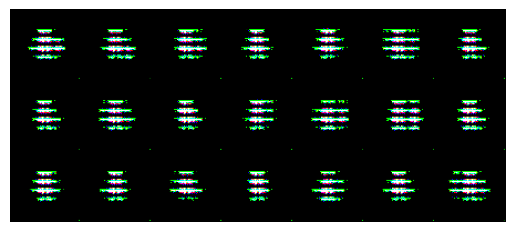

Epoch 1601, Loss_D 29.237, Loss_G 66.675, Time 0.63 sec
Epoch 1602, Loss_D 27.325, Loss_G 73.448, Time 0.62 sec
Epoch 1603, Loss_D 26.413, Loss_G 72.234, Time 0.63 sec
Epoch 1604, Loss_D 27.730, Loss_G 75.197, Time 0.63 sec
Epoch 1605, Loss_D 29.872, Loss_G 66.953, Time 0.62 sec
Epoch 1606, Loss_D 35.529, Loss_G 62.683, Time 0.62 sec
Epoch 1607, Loss_D 25.867, Loss_G 79.598, Time 0.63 sec
Epoch 1608, Loss_D 23.615, Loss_G 91.105, Time 0.62 sec
Epoch 1609, Loss_D 42.401, Loss_G 57.405, Time 0.62 sec
Epoch 1610, Loss_D 41.065, Loss_G 58.438, Time 0.63 sec
Epoch 1611, Loss_D 33.006, Loss_G 68.016, Time 0.62 sec
Epoch 1612, Loss_D 21.952, Loss_G 91.334, Time 0.63 sec
Epoch 1613, Loss_D 26.969, Loss_G 77.117, Time 0.63 sec
Epoch 1614, Loss_D 21.141, Loss_G 89.807, Time 0.63 sec
Epoch 1615, Loss_D 20.882, Loss_G 94.028, Time 0.63 sec
Epoch 1616, Loss_D 18.037, Loss_G 104.937, Time 0.63 sec
Epoch 1617, Loss_D 16.440, Loss_G 110.787, Time 0.63 sec
Epoch 1618, Loss_D 21.448, Loss_G 107.113, Tim

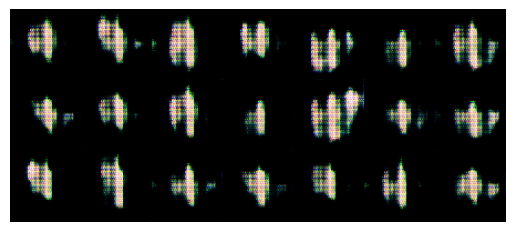

Epoch 1701, Loss_D 44.623, Loss_G 42.548, Time 0.66 sec
Epoch 1702, Loss_D 44.802, Loss_G 42.166, Time 0.62 sec
Epoch 1703, Loss_D 44.848, Loss_G 42.116, Time 0.62 sec
Epoch 1704, Loss_D 44.788, Loss_G 42.379, Time 0.62 sec
Epoch 1705, Loss_D 44.481, Loss_G 43.058, Time 0.63 sec
Epoch 1706, Loss_D 44.227, Loss_G 43.282, Time 0.63 sec
Epoch 1707, Loss_D 44.303, Loss_G 43.591, Time 0.62 sec
Epoch 1708, Loss_D 44.208, Loss_G 43.564, Time 0.62 sec
Epoch 1709, Loss_D 43.855, Loss_G 43.286, Time 0.63 sec
Epoch 1710, Loss_D 43.875, Loss_G 44.113, Time 0.62 sec
Epoch 1711, Loss_D 43.842, Loss_G 43.748, Time 0.63 sec
Epoch 1712, Loss_D 43.663, Loss_G 43.288, Time 0.63 sec
Epoch 1713, Loss_D 43.878, Loss_G 43.608, Time 0.62 sec
Epoch 1714, Loss_D 43.960, Loss_G 43.095, Time 0.62 sec
Epoch 1715, Loss_D 43.965, Loss_G 42.740, Time 0.63 sec
Epoch 1716, Loss_D 44.025, Loss_G 43.147, Time 0.62 sec
Epoch 1717, Loss_D 44.043, Loss_G 42.701, Time 0.63 sec
Epoch 1718, Loss_D 44.177, Loss_G 42.765, Time 0

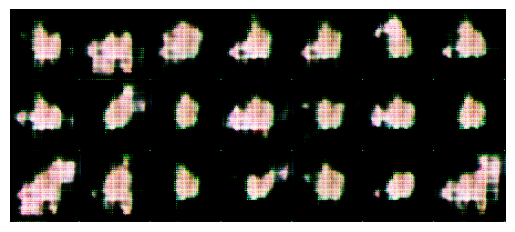

Epoch 1801, Loss_D 43.517, Loss_G 45.312, Time 0.63 sec
Epoch 1802, Loss_D 44.042, Loss_G 43.246, Time 0.63 sec
Epoch 1803, Loss_D 43.789, Loss_G 43.048, Time 0.62 sec
Epoch 1804, Loss_D 43.546, Loss_G 43.867, Time 0.62 sec
Epoch 1805, Loss_D 43.471, Loss_G 43.618, Time 0.62 sec
Epoch 1806, Loss_D 43.298, Loss_G 43.211, Time 0.62 sec
Epoch 1807, Loss_D 43.497, Loss_G 43.382, Time 0.63 sec
Epoch 1808, Loss_D 43.920, Loss_G 43.291, Time 0.62 sec
Epoch 1809, Loss_D 44.058, Loss_G 43.287, Time 0.63 sec
Epoch 1810, Loss_D 43.659, Loss_G 43.939, Time 0.63 sec
Epoch 1811, Loss_D 43.194, Loss_G 44.095, Time 0.63 sec
Epoch 1812, Loss_D 43.240, Loss_G 44.452, Time 0.68 sec
Epoch 1813, Loss_D 43.837, Loss_G 43.851, Time 0.70 sec
Epoch 1814, Loss_D 43.770, Loss_G 43.774, Time 0.69 sec
Epoch 1815, Loss_D 43.836, Loss_G 43.648, Time 0.68 sec
Epoch 1816, Loss_D 43.748, Loss_G 43.950, Time 0.65 sec
Epoch 1817, Loss_D 43.571, Loss_G 43.532, Time 0.67 sec
Epoch 1818, Loss_D 43.407, Loss_G 43.931, Time 0

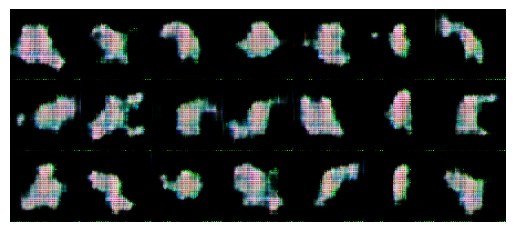

Epoch 1901, Loss_D 43.754, Loss_G 43.862, Time 0.63 sec
Epoch 1902, Loss_D 43.591, Loss_G 43.528, Time 0.62 sec
Epoch 1903, Loss_D 43.493, Loss_G 43.618, Time 0.62 sec
Epoch 1904, Loss_D 43.701, Loss_G 43.680, Time 0.63 sec
Epoch 1905, Loss_D 43.505, Loss_G 43.626, Time 0.63 sec
Epoch 1906, Loss_D 43.632, Loss_G 43.448, Time 0.63 sec
Epoch 1907, Loss_D 43.755, Loss_G 43.500, Time 0.63 sec
Epoch 1908, Loss_D 43.437, Loss_G 43.935, Time 0.62 sec
Epoch 1909, Loss_D 43.732, Loss_G 43.641, Time 0.62 sec
Epoch 1910, Loss_D 43.700, Loss_G 43.566, Time 0.62 sec
Epoch 1911, Loss_D 43.472, Loss_G 44.358, Time 0.62 sec
Epoch 1912, Loss_D 43.823, Loss_G 43.193, Time 0.62 sec
Epoch 1913, Loss_D 43.351, Loss_G 43.909, Time 0.62 sec
Epoch 1914, Loss_D 43.534, Loss_G 44.285, Time 0.63 sec
Epoch 1915, Loss_D 43.820, Loss_G 43.190, Time 0.62 sec
Epoch 1916, Loss_D 43.335, Loss_G 44.069, Time 0.62 sec
Epoch 1917, Loss_D 43.695, Loss_G 44.087, Time 0.62 sec
Epoch 1918, Loss_D 43.712, Loss_G 43.344, Time 0

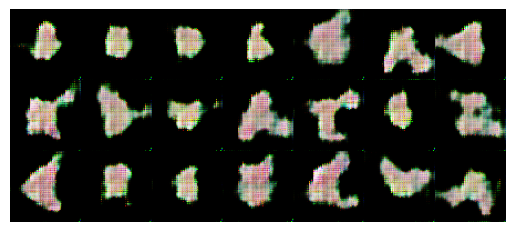

Epoch 2001, Loss_D 43.199, Loss_G 44.579, Time 0.63 sec
Epoch 2002, Loss_D 44.065, Loss_G 43.453, Time 0.63 sec
Epoch 2003, Loss_D 43.352, Loss_G 44.149, Time 0.62 sec
Epoch 2004, Loss_D 43.585, Loss_G 43.730, Time 0.62 sec
Epoch 2005, Loss_D 43.840, Loss_G 43.442, Time 0.63 sec
Epoch 2006, Loss_D 43.384, Loss_G 44.257, Time 0.62 sec
Epoch 2007, Loss_D 43.959, Loss_G 43.112, Time 0.63 sec
Epoch 2008, Loss_D 43.284, Loss_G 43.966, Time 0.62 sec
Epoch 2009, Loss_D 43.768, Loss_G 43.876, Time 0.63 sec
Epoch 2010, Loss_D 43.044, Loss_G 44.358, Time 0.64 sec
Epoch 2011, Loss_D 43.877, Loss_G 43.651, Time 0.63 sec
Epoch 2012, Loss_D 43.695, Loss_G 43.694, Time 0.63 sec
Epoch 2013, Loss_D 43.394, Loss_G 44.632, Time 0.62 sec
Epoch 2014, Loss_D 43.984, Loss_G 43.238, Time 0.63 sec
Epoch 2015, Loss_D 43.283, Loss_G 44.162, Time 0.62 sec
Epoch 2016, Loss_D 43.908, Loss_G 43.586, Time 0.63 sec
Epoch 2017, Loss_D 43.427, Loss_G 43.851, Time 0.63 sec
Epoch 2018, Loss_D 43.368, Loss_G 43.230, Time 0

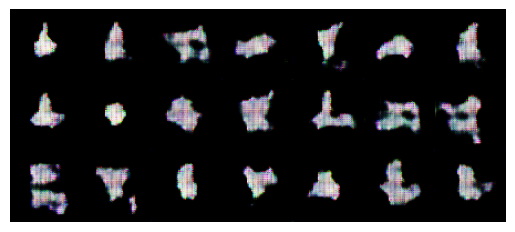

Epoch 2101, Loss_D 43.976, Loss_G 44.125, Time 0.63 sec
Epoch 2102, Loss_D 42.558, Loss_G 45.056, Time 0.63 sec
Epoch 2103, Loss_D 44.362, Loss_G 43.039, Time 0.62 sec
Epoch 2104, Loss_D 43.325, Loss_G 44.077, Time 0.62 sec
Epoch 2105, Loss_D 43.956, Loss_G 44.018, Time 0.63 sec
Epoch 2106, Loss_D 43.202, Loss_G 44.463, Time 0.63 sec
Epoch 2107, Loss_D 43.948, Loss_G 42.869, Time 0.62 sec
Epoch 2108, Loss_D 43.512, Loss_G 43.568, Time 0.62 sec
Epoch 2109, Loss_D 43.717, Loss_G 43.856, Time 0.62 sec
Epoch 2110, Loss_D 43.286, Loss_G 44.028, Time 0.63 sec
Epoch 2111, Loss_D 43.667, Loss_G 43.306, Time 0.63 sec
Epoch 2112, Loss_D 43.338, Loss_G 43.954, Time 0.63 sec
Epoch 2113, Loss_D 43.830, Loss_G 44.321, Time 0.63 sec
Epoch 2114, Loss_D 42.985, Loss_G 44.743, Time 0.62 sec
Epoch 2115, Loss_D 44.150, Loss_G 43.490, Time 0.63 sec
Epoch 2116, Loss_D 43.187, Loss_G 44.400, Time 0.62 sec
Epoch 2117, Loss_D 43.939, Loss_G 44.102, Time 0.64 sec
Epoch 2118, Loss_D 43.415, Loss_G 44.008, Time 0

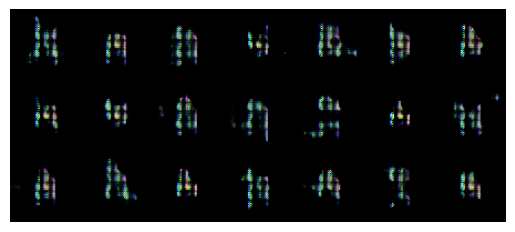

Epoch 2201, Loss_D 42.386, Loss_G 45.418, Time 0.63 sec
Epoch 2202, Loss_D 44.413, Loss_G 42.602, Time 0.63 sec
Epoch 2203, Loss_D 42.840, Loss_G 43.400, Time 0.63 sec
Epoch 2204, Loss_D 44.653, Loss_G 44.315, Time 0.62 sec
Epoch 2205, Loss_D 43.427, Loss_G 44.786, Time 0.62 sec
Epoch 2206, Loss_D 44.225, Loss_G 43.468, Time 0.63 sec
Epoch 2207, Loss_D 43.871, Loss_G 43.936, Time 0.62 sec
Epoch 2208, Loss_D 42.198, Loss_G 45.620, Time 0.62 sec
Epoch 2209, Loss_D 44.061, Loss_G 43.661, Time 0.62 sec
Epoch 2210, Loss_D 42.844, Loss_G 44.975, Time 0.62 sec
Epoch 2211, Loss_D 44.083, Loss_G 42.955, Time 0.62 sec
Epoch 2212, Loss_D 43.901, Loss_G 42.871, Time 0.63 sec
Epoch 2213, Loss_D 43.522, Loss_G 43.967, Time 0.62 sec
Epoch 2214, Loss_D 43.667, Loss_G 43.661, Time 0.62 sec
Epoch 2215, Loss_D 43.262, Loss_G 43.937, Time 0.62 sec
Epoch 2216, Loss_D 43.861, Loss_G 43.466, Time 0.62 sec
Epoch 2217, Loss_D 43.562, Loss_G 43.696, Time 0.63 sec
Epoch 2218, Loss_D 43.264, Loss_G 44.159, Time 0

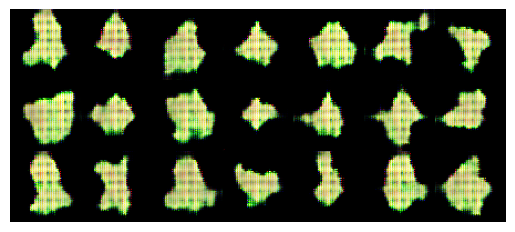

Epoch 2301, Loss_D 43.515, Loss_G 44.213, Time 0.66 sec
Epoch 2302, Loss_D 44.343, Loss_G 42.788, Time 0.63 sec
Epoch 2303, Loss_D 43.810, Loss_G 43.343, Time 0.62 sec
Epoch 2304, Loss_D 43.487, Loss_G 43.789, Time 0.62 sec
Epoch 2305, Loss_D 43.585, Loss_G 44.167, Time 0.63 sec
Epoch 2306, Loss_D 42.752, Loss_G 44.898, Time 0.62 sec
Epoch 2307, Loss_D 43.276, Loss_G 43.864, Time 0.62 sec
Epoch 2308, Loss_D 43.300, Loss_G 43.707, Time 0.62 sec
Epoch 2309, Loss_D 42.997, Loss_G 44.730, Time 0.62 sec
Epoch 2310, Loss_D 44.748, Loss_G 42.695, Time 0.62 sec
Epoch 2311, Loss_D 42.793, Loss_G 44.906, Time 0.62 sec
Epoch 2312, Loss_D 44.554, Loss_G 42.685, Time 0.63 sec
Epoch 2313, Loss_D 42.934, Loss_G 44.226, Time 0.63 sec
Epoch 2314, Loss_D 43.643, Loss_G 43.464, Time 0.62 sec
Epoch 2315, Loss_D 43.962, Loss_G 43.252, Time 0.63 sec
Epoch 2316, Loss_D 43.734, Loss_G 43.605, Time 0.62 sec
Epoch 2317, Loss_D 43.796, Loss_G 43.548, Time 0.62 sec
Epoch 2318, Loss_D 43.723, Loss_G 43.541, Time 0

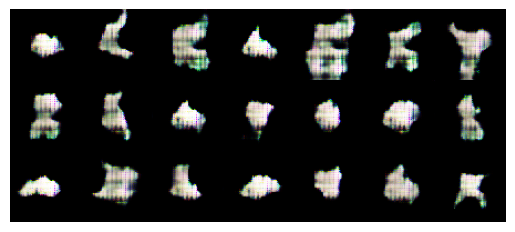

Epoch 2401, Loss_D 43.525, Loss_G 44.001, Time 0.63 sec
Epoch 2402, Loss_D 43.451, Loss_G 43.932, Time 0.62 sec
Epoch 2403, Loss_D 43.368, Loss_G 43.983, Time 0.62 sec
Epoch 2404, Loss_D 44.095, Loss_G 43.131, Time 0.62 sec
Epoch 2405, Loss_D 43.287, Loss_G 43.870, Time 0.63 sec
Epoch 2406, Loss_D 43.603, Loss_G 43.795, Time 0.63 sec
Epoch 2407, Loss_D 43.957, Loss_G 43.381, Time 0.63 sec
Epoch 2408, Loss_D 43.807, Loss_G 43.647, Time 0.62 sec
Epoch 2409, Loss_D 43.647, Loss_G 43.772, Time 0.62 sec
Epoch 2410, Loss_D 43.370, Loss_G 44.019, Time 0.62 sec
Epoch 2411, Loss_D 43.355, Loss_G 43.783, Time 0.62 sec
Epoch 2412, Loss_D 43.417, Loss_G 43.739, Time 0.64 sec
Epoch 2413, Loss_D 43.297, Loss_G 44.074, Time 0.64 sec
Epoch 2414, Loss_D 43.235, Loss_G 43.559, Time 0.64 sec
Epoch 2415, Loss_D 43.712, Loss_G 44.366, Time 0.62 sec
Epoch 2416, Loss_D 43.292, Loss_G 44.567, Time 0.62 sec
Epoch 2417, Loss_D 43.804, Loss_G 43.865, Time 0.62 sec
Epoch 2418, Loss_D 43.578, Loss_G 44.290, Time 0

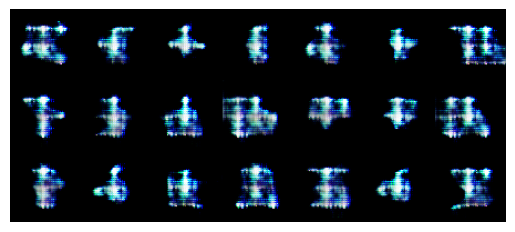

Epoch 2501, Loss_D 43.367, Loss_G 43.911, Time 0.62 sec
Epoch 2502, Loss_D 42.889, Loss_G 44.087, Time 0.62 sec
Epoch 2503, Loss_D 43.695, Loss_G 43.839, Time 0.63 sec
Epoch 2504, Loss_D 43.359, Loss_G 44.204, Time 0.62 sec
Epoch 2505, Loss_D 43.755, Loss_G 43.733, Time 0.62 sec
Epoch 2506, Loss_D 43.734, Loss_G 44.505, Time 0.63 sec
Epoch 2507, Loss_D 43.264, Loss_G 44.370, Time 0.62 sec
Epoch 2508, Loss_D 42.928, Loss_G 45.241, Time 0.63 sec
Epoch 2509, Loss_D 43.997, Loss_G 44.681, Time 0.63 sec
Epoch 2510, Loss_D 43.883, Loss_G 43.635, Time 0.62 sec
Epoch 2511, Loss_D 43.892, Loss_G 43.344, Time 0.63 sec
Epoch 2512, Loss_D 43.497, Loss_G 43.546, Time 0.62 sec
Epoch 2513, Loss_D 43.585, Loss_G 43.820, Time 0.62 sec
Epoch 2514, Loss_D 43.538, Loss_G 43.899, Time 0.62 sec
Epoch 2515, Loss_D 43.733, Loss_G 43.441, Time 0.62 sec
Epoch 2516, Loss_D 43.753, Loss_G 43.539, Time 0.63 sec
Epoch 2517, Loss_D 43.529, Loss_G 43.822, Time 0.62 sec
Epoch 2518, Loss_D 43.269, Loss_G 43.773, Time 0

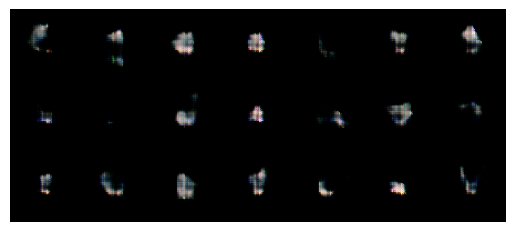

Epoch 2601, Loss_D 43.042, Loss_G 44.682, Time 0.62 sec
Epoch 2602, Loss_D 43.641, Loss_G 43.952, Time 0.62 sec
Epoch 2603, Loss_D 43.987, Loss_G 43.420, Time 0.62 sec
Epoch 2604, Loss_D 42.763, Loss_G 44.389, Time 0.62 sec
Epoch 2605, Loss_D 43.651, Loss_G 43.818, Time 0.63 sec
Epoch 2606, Loss_D 43.818, Loss_G 43.719, Time 0.62 sec
Epoch 2607, Loss_D 42.781, Loss_G 44.613, Time 0.62 sec
Epoch 2608, Loss_D 44.387, Loss_G 43.451, Time 0.63 sec
Epoch 2609, Loss_D 42.141, Loss_G 44.904, Time 0.62 sec
Epoch 2610, Loss_D 45.074, Loss_G 43.385, Time 0.62 sec
Epoch 2611, Loss_D 42.478, Loss_G 45.491, Time 0.62 sec
Epoch 2612, Loss_D 44.058, Loss_G 43.258, Time 0.62 sec
Epoch 2613, Loss_D 44.052, Loss_G 42.829, Time 0.62 sec
Epoch 2614, Loss_D 43.374, Loss_G 43.760, Time 0.62 sec
Epoch 2615, Loss_D 43.657, Loss_G 43.807, Time 0.62 sec
Epoch 2616, Loss_D 43.577, Loss_G 43.953, Time 0.62 sec
Epoch 2617, Loss_D 43.298, Loss_G 44.138, Time 0.64 sec
Epoch 2618, Loss_D 43.465, Loss_G 43.667, Time 0

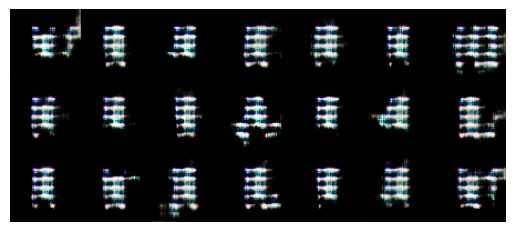

Epoch 2701, Loss_D 43.413, Loss_G 43.468, Time 0.63 sec
Epoch 2702, Loss_D 43.607, Loss_G 43.966, Time 0.62 sec
Epoch 2703, Loss_D 43.130, Loss_G 44.726, Time 0.63 sec
Epoch 2704, Loss_D 44.836, Loss_G 42.407, Time 0.63 sec
Epoch 2705, Loss_D 43.693, Loss_G 44.176, Time 0.63 sec
Epoch 2706, Loss_D 44.930, Loss_G 43.250, Time 0.62 sec
Epoch 2707, Loss_D 43.826, Loss_G 43.617, Time 0.62 sec
Epoch 2708, Loss_D 44.219, Loss_G 42.717, Time 0.62 sec
Epoch 2709, Loss_D 43.526, Loss_G 43.511, Time 0.62 sec
Epoch 2710, Loss_D 44.033, Loss_G 43.579, Time 0.62 sec
Epoch 2711, Loss_D 43.502, Loss_G 44.092, Time 0.62 sec
Epoch 2712, Loss_D 43.848, Loss_G 43.070, Time 0.62 sec
Epoch 2713, Loss_D 43.234, Loss_G 43.516, Time 0.62 sec
Epoch 2714, Loss_D 43.868, Loss_G 43.776, Time 0.62 sec
Epoch 2715, Loss_D 43.137, Loss_G 44.734, Time 0.63 sec
Epoch 2716, Loss_D 43.798, Loss_G 43.268, Time 0.62 sec
Epoch 2717, Loss_D 43.093, Loss_G 43.732, Time 0.62 sec
Epoch 2718, Loss_D 43.463, Loss_G 44.400, Time 0

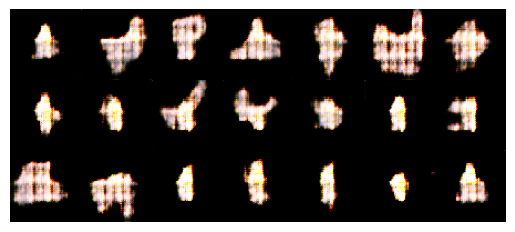

Epoch 2801, Loss_D 42.924, Loss_G 44.405, Time 0.63 sec
Epoch 2802, Loss_D 44.346, Loss_G 44.256, Time 0.63 sec
Epoch 2803, Loss_D 43.875, Loss_G 43.690, Time 0.62 sec
Epoch 2804, Loss_D 44.483, Loss_G 41.918, Time 0.63 sec
Epoch 2805, Loss_D 44.536, Loss_G 43.052, Time 0.63 sec
Epoch 2806, Loss_D 43.761, Loss_G 43.487, Time 0.65 sec
Epoch 2807, Loss_D 43.536, Loss_G 43.411, Time 0.62 sec
Epoch 2808, Loss_D 43.626, Loss_G 43.585, Time 0.63 sec
Epoch 2809, Loss_D 43.714, Loss_G 43.624, Time 0.63 sec
Epoch 2810, Loss_D 43.752, Loss_G 43.561, Time 0.63 sec
Epoch 2811, Loss_D 43.548, Loss_G 44.097, Time 0.63 sec
Epoch 2812, Loss_D 43.511, Loss_G 43.938, Time 0.62 sec
Epoch 2813, Loss_D 43.773, Loss_G 42.919, Time 0.62 sec
Epoch 2814, Loss_D 43.788, Loss_G 43.730, Time 0.62 sec
Epoch 2815, Loss_D 43.278, Loss_G 44.518, Time 0.63 sec
Epoch 2816, Loss_D 43.461, Loss_G 42.997, Time 0.62 sec
Epoch 2817, Loss_D 43.674, Loss_G 44.808, Time 0.62 sec
Epoch 2818, Loss_D 42.992, Loss_G 45.665, Time 0

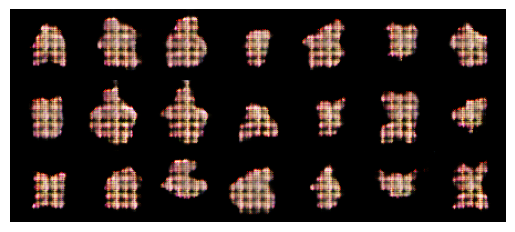

Epoch 2901, Loss_D 43.235, Loss_G 43.502, Time 0.64 sec
Epoch 2902, Loss_D 43.591, Loss_G 44.079, Time 0.62 sec
Epoch 2903, Loss_D 43.495, Loss_G 44.095, Time 0.63 sec
Epoch 2904, Loss_D 44.422, Loss_G 42.305, Time 0.62 sec
Epoch 2905, Loss_D 43.495, Loss_G 43.617, Time 0.63 sec
Epoch 2906, Loss_D 44.008, Loss_G 44.604, Time 0.62 sec
Epoch 2907, Loss_D 43.366, Loss_G 44.595, Time 0.62 sec
Epoch 2908, Loss_D 43.238, Loss_G 43.737, Time 0.62 sec
Epoch 2909, Loss_D 43.278, Loss_G 44.071, Time 0.64 sec
Epoch 2910, Loss_D 43.538, Loss_G 44.143, Time 0.63 sec
Epoch 2911, Loss_D 43.312, Loss_G 43.625, Time 0.63 sec
Epoch 2912, Loss_D 43.545, Loss_G 42.839, Time 0.63 sec
Epoch 2913, Loss_D 43.165, Loss_G 43.980, Time 0.62 sec
Epoch 2914, Loss_D 42.637, Loss_G 44.956, Time 0.62 sec
Epoch 2915, Loss_D 43.261, Loss_G 43.527, Time 0.62 sec
Epoch 2916, Loss_D 43.602, Loss_G 43.414, Time 0.63 sec
Epoch 2917, Loss_D 45.102, Loss_G 43.925, Time 0.63 sec
Epoch 2918, Loss_D 43.291, Loss_G 45.271, Time 0

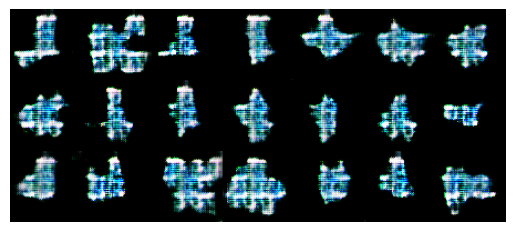

Epoch 3001, Loss_D 42.836, Loss_G 44.109, Time 0.63 sec
Epoch 3002, Loss_D 43.992, Loss_G 44.139, Time 0.62 sec
Epoch 3003, Loss_D 43.912, Loss_G 44.778, Time 0.62 sec
Epoch 3004, Loss_D 42.823, Loss_G 44.993, Time 0.62 sec
Epoch 3005, Loss_D 44.218, Loss_G 42.650, Time 0.63 sec
Epoch 3006, Loss_D 43.959, Loss_G 42.632, Time 0.63 sec
Epoch 3007, Loss_D 42.347, Loss_G 45.225, Time 0.69 sec
Epoch 3008, Loss_D 44.807, Loss_G 43.858, Time 0.66 sec
Epoch 3009, Loss_D 42.693, Loss_G 44.770, Time 0.67 sec
Epoch 3010, Loss_D 43.634, Loss_G 43.813, Time 0.68 sec
Epoch 3011, Loss_D 43.560, Loss_G 43.738, Time 0.67 sec
Epoch 3012, Loss_D 43.156, Loss_G 43.927, Time 0.66 sec
Epoch 3013, Loss_D 43.178, Loss_G 43.834, Time 0.67 sec
Epoch 3014, Loss_D 43.649, Loss_G 44.883, Time 0.65 sec
Epoch 3015, Loss_D 43.107, Loss_G 46.167, Time 0.63 sec
Epoch 3016, Loss_D 42.376, Loss_G 45.978, Time 0.62 sec
Epoch 3017, Loss_D 44.884, Loss_G 41.100, Time 0.63 sec
Epoch 3018, Loss_D 43.016, Loss_G 44.874, Time 0

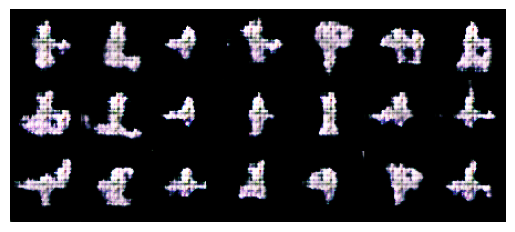

Epoch 3101, Loss_D 43.950, Loss_G 43.856, Time 0.63 sec
Epoch 3102, Loss_D 43.702, Loss_G 44.565, Time 0.62 sec
Epoch 3103, Loss_D 42.607, Loss_G 45.162, Time 0.63 sec
Epoch 3104, Loss_D 43.824, Loss_G 43.202, Time 0.63 sec
Epoch 3105, Loss_D 43.722, Loss_G 42.826, Time 0.62 sec
Epoch 3106, Loss_D 43.251, Loss_G 43.971, Time 0.62 sec
Epoch 3107, Loss_D 43.917, Loss_G 43.656, Time 0.63 sec
Epoch 3108, Loss_D 43.434, Loss_G 44.143, Time 0.62 sec
Epoch 3109, Loss_D 43.169, Loss_G 44.153, Time 0.62 sec
Epoch 3110, Loss_D 43.380, Loss_G 43.574, Time 0.63 sec
Epoch 3111, Loss_D 43.756, Loss_G 43.000, Time 0.62 sec
Epoch 3112, Loss_D 42.946, Loss_G 44.155, Time 0.63 sec
Epoch 3113, Loss_D 43.764, Loss_G 43.845, Time 0.62 sec
Epoch 3114, Loss_D 43.709, Loss_G 43.951, Time 0.63 sec
Epoch 3115, Loss_D 43.543, Loss_G 43.698, Time 0.62 sec
Epoch 3116, Loss_D 42.887, Loss_G 44.147, Time 0.62 sec
Epoch 3117, Loss_D 42.826, Loss_G 44.948, Time 0.63 sec
Epoch 3118, Loss_D 43.366, Loss_G 45.025, Time 0

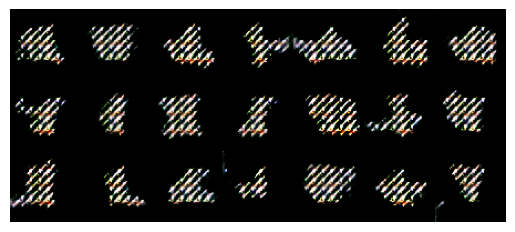

Epoch 3201, Loss_D 43.187, Loss_G 43.652, Time 0.62 sec
Epoch 3202, Loss_D 43.283, Loss_G 44.255, Time 0.62 sec
Epoch 3203, Loss_D 43.429, Loss_G 44.260, Time 0.62 sec
Epoch 3204, Loss_D 43.195, Loss_G 44.155, Time 0.65 sec
Epoch 3205, Loss_D 43.637, Loss_G 44.657, Time 0.62 sec
Epoch 3206, Loss_D 42.006, Loss_G 46.565, Time 0.62 sec
Epoch 3207, Loss_D 44.675, Loss_G 43.497, Time 0.63 sec
Epoch 3208, Loss_D 42.676, Loss_G 44.551, Time 0.63 sec
Epoch 3209, Loss_D 44.550, Loss_G 42.502, Time 0.62 sec
Epoch 3210, Loss_D 43.031, Loss_G 44.695, Time 0.62 sec
Epoch 3211, Loss_D 40.663, Loss_G 46.894, Time 0.62 sec
Epoch 3212, Loss_D 43.799, Loss_G 45.724, Time 0.62 sec
Epoch 3213, Loss_D 43.491, Loss_G 47.942, Time 0.62 sec
Epoch 3214, Loss_D 45.512, Loss_G 46.150, Time 0.62 sec
Epoch 3215, Loss_D 41.559, Loss_G 52.581, Time 0.63 sec
Epoch 3216, Loss_D 44.333, Loss_G 44.116, Time 0.62 sec
Epoch 3217, Loss_D 43.317, Loss_G 43.818, Time 0.62 sec
Epoch 3218, Loss_D 44.232, Loss_G 42.488, Time 0

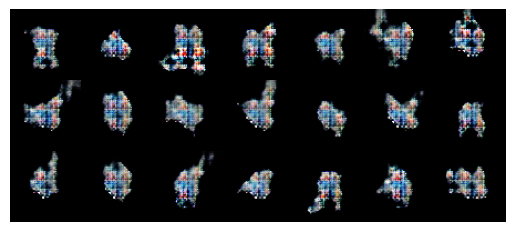

Epoch 3301, Loss_D 43.746, Loss_G 44.367, Time 0.63 sec
Epoch 3302, Loss_D 42.323, Loss_G 45.536, Time 0.62 sec
Epoch 3303, Loss_D 44.315, Loss_G 42.735, Time 0.63 sec
Epoch 3304, Loss_D 44.310, Loss_G 44.421, Time 0.64 sec
Epoch 3305, Loss_D 43.225, Loss_G 45.629, Time 0.62 sec
Epoch 3306, Loss_D 42.805, Loss_G 45.398, Time 0.62 sec
Epoch 3307, Loss_D 43.825, Loss_G 42.944, Time 0.62 sec
Epoch 3308, Loss_D 43.567, Loss_G 43.798, Time 0.62 sec
Epoch 3309, Loss_D 44.347, Loss_G 43.582, Time 0.62 sec
Epoch 3310, Loss_D 43.108, Loss_G 44.596, Time 0.63 sec
Epoch 3311, Loss_D 42.635, Loss_G 44.131, Time 0.62 sec
Epoch 3312, Loss_D 43.104, Loss_G 44.167, Time 0.62 sec
Epoch 3313, Loss_D 44.464, Loss_G 44.796, Time 0.62 sec
Epoch 3314, Loss_D 42.682, Loss_G 45.508, Time 0.62 sec
Epoch 3315, Loss_D 43.470, Loss_G 43.859, Time 0.62 sec
Epoch 3316, Loss_D 43.792, Loss_G 42.579, Time 0.62 sec
Epoch 3317, Loss_D 44.712, Loss_G 43.255, Time 0.62 sec
Epoch 3318, Loss_D 42.857, Loss_G 45.612, Time 0

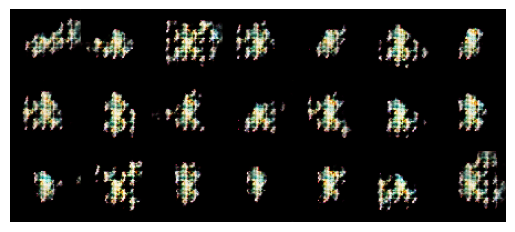

Epoch 3401, Loss_D 43.677, Loss_G 43.780, Time 0.62 sec
Epoch 3402, Loss_D 43.154, Loss_G 44.181, Time 0.64 sec
Epoch 3403, Loss_D 43.373, Loss_G 44.556, Time 0.62 sec
Epoch 3404, Loss_D 42.971, Loss_G 44.611, Time 0.62 sec
Epoch 3405, Loss_D 43.840, Loss_G 42.855, Time 0.63 sec
Epoch 3406, Loss_D 43.730, Loss_G 44.769, Time 0.63 sec
Epoch 3407, Loss_D 43.020, Loss_G 45.356, Time 0.62 sec
Epoch 3408, Loss_D 44.737, Loss_G 41.847, Time 0.62 sec
Epoch 3409, Loss_D 43.209, Loss_G 44.058, Time 0.62 sec
Epoch 3410, Loss_D 43.839, Loss_G 44.229, Time 0.62 sec
Epoch 3411, Loss_D 43.720, Loss_G 43.677, Time 0.63 sec
Epoch 3412, Loss_D 43.933, Loss_G 42.917, Time 0.62 sec
Epoch 3413, Loss_D 43.500, Loss_G 43.910, Time 0.62 sec
Epoch 3414, Loss_D 43.630, Loss_G 44.397, Time 0.62 sec
Epoch 3415, Loss_D 43.337, Loss_G 44.189, Time 0.62 sec
Epoch 3416, Loss_D 43.442, Loss_G 43.508, Time 0.62 sec
Epoch 3417, Loss_D 43.023, Loss_G 43.912, Time 0.63 sec
Epoch 3418, Loss_D 43.828, Loss_G 44.173, Time 0

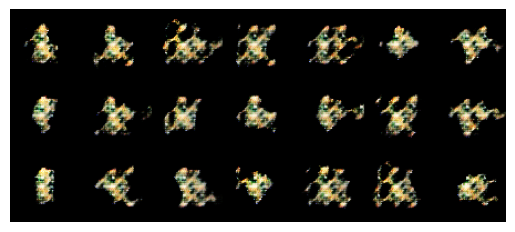

Epoch 3501, Loss_D 43.359, Loss_G 44.019, Time 0.63 sec
Epoch 3502, Loss_D 43.706, Loss_G 43.508, Time 0.63 sec
Epoch 3503, Loss_D 43.476, Loss_G 44.040, Time 0.62 sec
Epoch 3504, Loss_D 43.267, Loss_G 44.746, Time 0.63 sec
Epoch 3505, Loss_D 43.571, Loss_G 43.763, Time 0.62 sec
Epoch 3506, Loss_D 43.796, Loss_G 43.103, Time 0.63 sec
Epoch 3507, Loss_D 43.964, Loss_G 43.594, Time 0.62 sec
Epoch 3508, Loss_D 43.904, Loss_G 43.553, Time 0.63 sec
Epoch 3509, Loss_D 43.182, Loss_G 44.222, Time 0.62 sec
Epoch 3510, Loss_D 43.201, Loss_G 44.113, Time 0.63 sec
Epoch 3511, Loss_D 43.550, Loss_G 43.303, Time 0.62 sec
Epoch 3512, Loss_D 43.534, Loss_G 44.686, Time 0.62 sec
Epoch 3513, Loss_D 43.750, Loss_G 43.784, Time 0.63 sec
Epoch 3514, Loss_D 43.382, Loss_G 44.074, Time 0.62 sec
Epoch 3515, Loss_D 42.599, Loss_G 45.452, Time 0.63 sec
Epoch 3516, Loss_D 43.194, Loss_G 51.237, Time 0.63 sec
Epoch 3517, Loss_D 44.772, Loss_G 44.544, Time 0.62 sec
Epoch 3518, Loss_D 44.100, Loss_G 44.361, Time 0

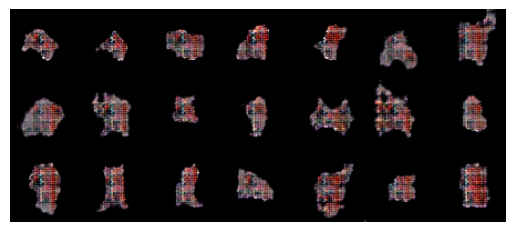

Epoch 3601, Loss_D 43.464, Loss_G 44.812, Time 0.63 sec
Epoch 3602, Loss_D 42.913, Loss_G 44.647, Time 0.63 sec
Epoch 3603, Loss_D 44.953, Loss_G 41.872, Time 0.62 sec
Epoch 3604, Loss_D 42.286, Loss_G 44.886, Time 0.62 sec
Epoch 3605, Loss_D 43.847, Loss_G 44.102, Time 0.62 sec
Epoch 3606, Loss_D 44.254, Loss_G 43.876, Time 0.62 sec
Epoch 3607, Loss_D 42.880, Loss_G 45.148, Time 0.63 sec
Epoch 3608, Loss_D 43.789, Loss_G 44.018, Time 0.62 sec
Epoch 3609, Loss_D 43.136, Loss_G 44.094, Time 0.62 sec
Epoch 3610, Loss_D 45.213, Loss_G 43.322, Time 0.63 sec
Epoch 3611, Loss_D 42.882, Loss_G 44.676, Time 0.63 sec
Epoch 3612, Loss_D 42.505, Loss_G 44.906, Time 0.62 sec
Epoch 3613, Loss_D 43.451, Loss_G 43.711, Time 0.62 sec
Epoch 3614, Loss_D 43.566, Loss_G 43.661, Time 0.63 sec
Epoch 3615, Loss_D 43.937, Loss_G 44.106, Time 0.63 sec
Epoch 3616, Loss_D 43.502, Loss_G 44.169, Time 0.63 sec
Epoch 3617, Loss_D 43.440, Loss_G 43.711, Time 0.63 sec
Epoch 3618, Loss_D 43.359, Loss_G 43.492, Time 0

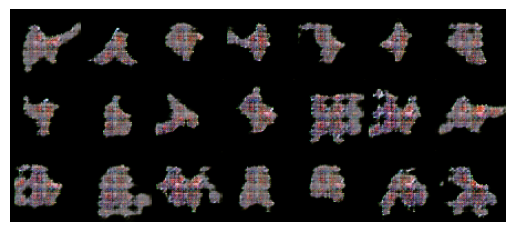

Epoch 3701, Loss_D 43.520, Loss_G 43.532, Time 0.63 sec
Epoch 3702, Loss_D 43.429, Loss_G 43.872, Time 0.62 sec
Epoch 3703, Loss_D 43.898, Loss_G 43.789, Time 0.63 sec
Epoch 3704, Loss_D 43.929, Loss_G 43.630, Time 0.63 sec
Epoch 3705, Loss_D 43.131, Loss_G 44.285, Time 0.63 sec
Epoch 3706, Loss_D 43.513, Loss_G 43.858, Time 0.62 sec
Epoch 3707, Loss_D 42.620, Loss_G 44.681, Time 0.63 sec
Epoch 3708, Loss_D 44.493, Loss_G 43.087, Time 0.62 sec
Epoch 3709, Loss_D 43.486, Loss_G 44.123, Time 0.65 sec
Epoch 3710, Loss_D 42.912, Loss_G 44.307, Time 0.63 sec
Epoch 3711, Loss_D 43.674, Loss_G 43.556, Time 0.63 sec
Epoch 3712, Loss_D 43.890, Loss_G 43.903, Time 0.62 sec
Epoch 3713, Loss_D 43.148, Loss_G 44.699, Time 0.63 sec
Epoch 3714, Loss_D 42.917, Loss_G 44.770, Time 0.63 sec
Epoch 3715, Loss_D 43.709, Loss_G 43.105, Time 0.63 sec
Epoch 3716, Loss_D 42.823, Loss_G 44.618, Time 0.63 sec
Epoch 3717, Loss_D 43.230, Loss_G 44.939, Time 0.62 sec
Epoch 3718, Loss_D 43.634, Loss_G 44.580, Time 0

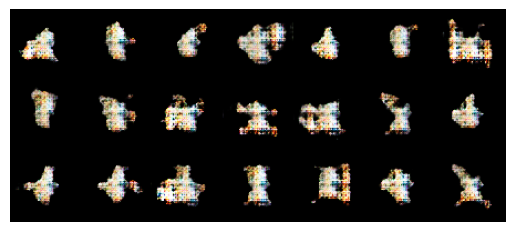

Epoch 3801, Loss_D 43.576, Loss_G 43.729, Time 0.64 sec
Epoch 3802, Loss_D 43.701, Loss_G 43.514, Time 0.65 sec
Epoch 3803, Loss_D 43.672, Loss_G 43.615, Time 0.65 sec
Epoch 3804, Loss_D 43.485, Loss_G 43.723, Time 0.64 sec
Epoch 3805, Loss_D 43.477, Loss_G 43.825, Time 0.66 sec
Epoch 3806, Loss_D 43.691, Loss_G 43.477, Time 0.65 sec
Epoch 3807, Loss_D 43.468, Loss_G 43.873, Time 0.64 sec
Epoch 3808, Loss_D 43.336, Loss_G 44.024, Time 0.64 sec
Epoch 3809, Loss_D 43.347, Loss_G 43.973, Time 0.65 sec
Epoch 3810, Loss_D 42.857, Loss_G 44.257, Time 0.64 sec
Epoch 3811, Loss_D 44.139, Loss_G 43.473, Time 0.64 sec
Epoch 3812, Loss_D 43.403, Loss_G 44.357, Time 0.65 sec
Epoch 3813, Loss_D 43.991, Loss_G 43.015, Time 0.64 sec
Epoch 3814, Loss_D 43.085, Loss_G 43.992, Time 0.65 sec
Epoch 3815, Loss_D 43.843, Loss_G 43.583, Time 0.66 sec
Epoch 3816, Loss_D 43.786, Loss_G 43.620, Time 0.65 sec
Epoch 3817, Loss_D 43.656, Loss_G 43.647, Time 0.65 sec
Epoch 3818, Loss_D 43.502, Loss_G 43.822, Time 0

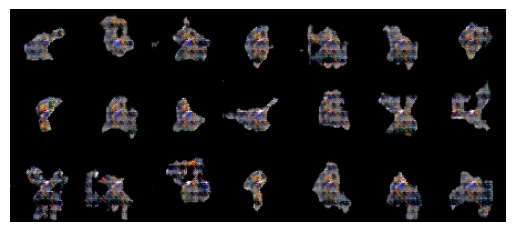

Epoch 3901, Loss_D 43.658, Loss_G 43.908, Time 0.65 sec
Epoch 3902, Loss_D 43.384, Loss_G 44.356, Time 0.65 sec
Epoch 3903, Loss_D 43.342, Loss_G 43.863, Time 0.64 sec
Epoch 3904, Loss_D 43.759, Loss_G 43.433, Time 0.64 sec
Epoch 3905, Loss_D 43.562, Loss_G 43.813, Time 0.64 sec
Epoch 3906, Loss_D 43.394, Loss_G 44.017, Time 0.65 sec
Epoch 3907, Loss_D 43.504, Loss_G 44.263, Time 0.65 sec
Epoch 3908, Loss_D 43.259, Loss_G 44.489, Time 0.65 sec
Epoch 3909, Loss_D 44.449, Loss_G 42.685, Time 0.65 sec
Epoch 3910, Loss_D 43.649, Loss_G 43.406, Time 0.67 sec
Epoch 3911, Loss_D 43.015, Loss_G 44.080, Time 0.65 sec
Epoch 3912, Loss_D 43.522, Loss_G 44.078, Time 0.65 sec
Epoch 3913, Loss_D 43.818, Loss_G 43.940, Time 0.65 sec
Epoch 3914, Loss_D 44.116, Loss_G 43.177, Time 0.65 sec
Epoch 3915, Loss_D 43.724, Loss_G 43.471, Time 0.65 sec
Epoch 3916, Loss_D 43.353, Loss_G 43.880, Time 0.65 sec
Epoch 3917, Loss_D 43.206, Loss_G 44.047, Time 0.65 sec
Epoch 3918, Loss_D 43.454, Loss_G 43.797, Time 0

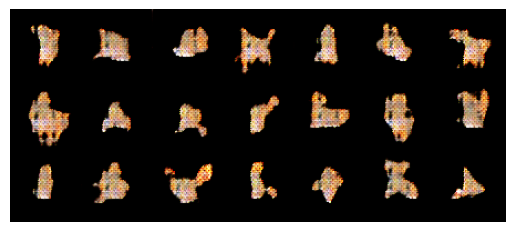

Epoch 4001, Loss_D 43.486, Loss_G 43.776, Time 0.66 sec
Epoch 4002, Loss_D 43.326, Loss_G 44.071, Time 0.66 sec
Epoch 4003, Loss_D 43.346, Loss_G 44.022, Time 0.65 sec
Epoch 4004, Loss_D 43.705, Loss_G 43.465, Time 0.65 sec
Epoch 4005, Loss_D 43.671, Loss_G 43.358, Time 0.65 sec
Epoch 4006, Loss_D 43.548, Loss_G 43.864, Time 0.65 sec
Epoch 4007, Loss_D 43.404, Loss_G 43.995, Time 0.65 sec
Epoch 4008, Loss_D 43.967, Loss_G 43.341, Time 0.68 sec
Epoch 4009, Loss_D 43.503, Loss_G 43.765, Time 0.71 sec
Epoch 4010, Loss_D 43.485, Loss_G 43.682, Time 0.71 sec
Epoch 4011, Loss_D 43.453, Loss_G 43.754, Time 0.71 sec
Epoch 4012, Loss_D 43.200, Loss_G 43.977, Time 0.72 sec
Epoch 4013, Loss_D 43.035, Loss_G 45.172, Time 0.72 sec
Epoch 4014, Loss_D 43.759, Loss_G 44.870, Time 0.71 sec
Epoch 4015, Loss_D 43.186, Loss_G 45.621, Time 0.68 sec
Epoch 4016, Loss_D 44.077, Loss_G 43.612, Time 0.65 sec
Epoch 4017, Loss_D 43.054, Loss_G 44.413, Time 0.65 sec
Epoch 4018, Loss_D 44.509, Loss_G 43.226, Time 0

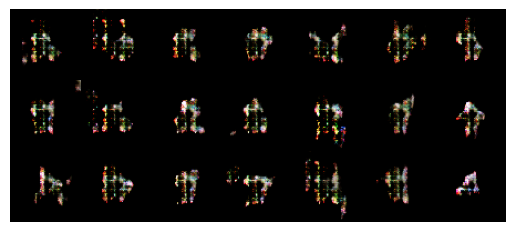

Epoch 4101, Loss_D 43.241, Loss_G 44.090, Time 0.70 sec
Epoch 4102, Loss_D 43.845, Loss_G 43.409, Time 0.71 sec
Epoch 4103, Loss_D 43.686, Loss_G 43.593, Time 0.71 sec
Epoch 4104, Loss_D 43.202, Loss_G 44.101, Time 0.70 sec
Epoch 4105, Loss_D 43.532, Loss_G 44.185, Time 0.69 sec
Epoch 4106, Loss_D 43.325, Loss_G 44.202, Time 0.65 sec
Epoch 4107, Loss_D 43.538, Loss_G 43.533, Time 0.65 sec
Epoch 4108, Loss_D 43.612, Loss_G 43.205, Time 0.66 sec
Epoch 4109, Loss_D 43.732, Loss_G 43.218, Time 0.65 sec
Epoch 4110, Loss_D 43.738, Loss_G 43.300, Time 0.65 sec
Epoch 4111, Loss_D 43.652, Loss_G 43.428, Time 0.65 sec
Epoch 4112, Loss_D 43.534, Loss_G 43.571, Time 0.65 sec
Epoch 4113, Loss_D 43.493, Loss_G 43.730, Time 0.65 sec
Epoch 4114, Loss_D 43.495, Loss_G 43.763, Time 0.65 sec
Epoch 4115, Loss_D 43.444, Loss_G 43.640, Time 0.66 sec
Epoch 4116, Loss_D 43.511, Loss_G 44.110, Time 0.65 sec
Epoch 4117, Loss_D 43.481, Loss_G 43.779, Time 0.65 sec
Epoch 4118, Loss_D 43.288, Loss_G 43.303, Time 0

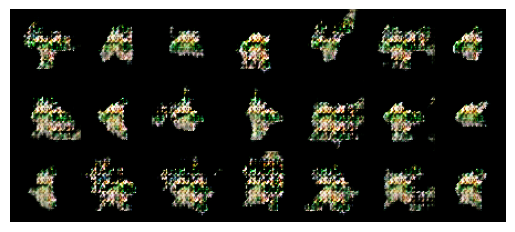

Epoch 4201, Loss_D 43.471, Loss_G 43.624, Time 0.65 sec
Epoch 4202, Loss_D 43.458, Loss_G 43.653, Time 0.66 sec
Epoch 4203, Loss_D 43.588, Loss_G 43.721, Time 0.65 sec
Epoch 4204, Loss_D 43.580, Loss_G 43.906, Time 0.65 sec
Epoch 4205, Loss_D 43.627, Loss_G 43.473, Time 0.65 sec
Epoch 4206, Loss_D 43.698, Loss_G 43.573, Time 0.65 sec
Epoch 4207, Loss_D 43.521, Loss_G 43.242, Time 0.65 sec
Epoch 4208, Loss_D 43.521, Loss_G 44.083, Time 0.65 sec
Epoch 4209, Loss_D 43.655, Loss_G 43.532, Time 0.65 sec
Epoch 4210, Loss_D 43.536, Loss_G 43.591, Time 0.65 sec
Epoch 4211, Loss_D 43.473, Loss_G 43.935, Time 0.66 sec
Epoch 4212, Loss_D 43.555, Loss_G 43.289, Time 0.64 sec
Epoch 4213, Loss_D 43.454, Loss_G 43.490, Time 0.65 sec
Epoch 4214, Loss_D 43.761, Loss_G 44.255, Time 0.65 sec
Epoch 4215, Loss_D 43.742, Loss_G 43.570, Time 0.67 sec
Epoch 4216, Loss_D 43.001, Loss_G 44.194, Time 0.66 sec
Epoch 4217, Loss_D 43.943, Loss_G 44.376, Time 0.65 sec
Epoch 4218, Loss_D 43.194, Loss_G 44.628, Time 0

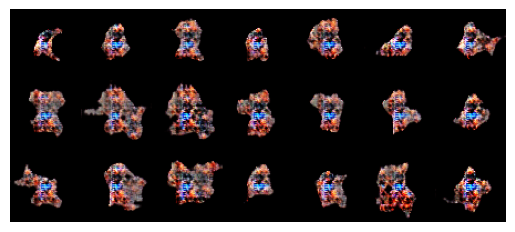

Epoch 4301, Loss_D 43.511, Loss_G 43.852, Time 0.65 sec
Epoch 4302, Loss_D 43.413, Loss_G 43.849, Time 0.65 sec
Epoch 4303, Loss_D 43.680, Loss_G 43.649, Time 0.64 sec
Epoch 4304, Loss_D 43.365, Loss_G 44.233, Time 0.65 sec
Epoch 4305, Loss_D 43.272, Loss_G 44.353, Time 0.65 sec
Epoch 4306, Loss_D 43.487, Loss_G 44.004, Time 0.68 sec
Epoch 4307, Loss_D 43.866, Loss_G 44.173, Time 0.65 sec
Epoch 4308, Loss_D 43.268, Loss_G 44.524, Time 0.64 sec
Epoch 4309, Loss_D 43.780, Loss_G 43.073, Time 0.65 sec
Epoch 4310, Loss_D 43.683, Loss_G 43.982, Time 0.65 sec
Epoch 4311, Loss_D 43.374, Loss_G 44.942, Time 0.65 sec
Epoch 4312, Loss_D 43.787, Loss_G 43.375, Time 0.66 sec
Epoch 4313, Loss_D 43.823, Loss_G 42.738, Time 0.64 sec
Epoch 4314, Loss_D 43.304, Loss_G 43.965, Time 0.64 sec
Epoch 4315, Loss_D 43.841, Loss_G 44.273, Time 0.66 sec
Epoch 4316, Loss_D 43.500, Loss_G 43.837, Time 0.64 sec
Epoch 4317, Loss_D 43.433, Loss_G 43.464, Time 0.65 sec
Epoch 4318, Loss_D 43.426, Loss_G 44.127, Time 0

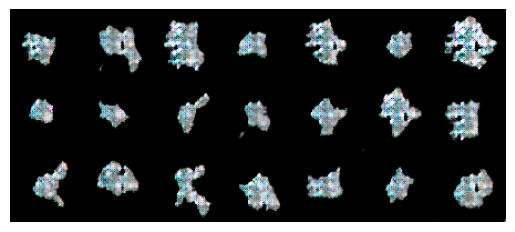

Epoch 4401, Loss_D 44.119, Loss_G 43.752, Time 0.64 sec
Epoch 4402, Loss_D 43.089, Loss_G 45.376, Time 0.64 sec
Epoch 4403, Loss_D 43.798, Loss_G 44.003, Time 0.65 sec
Epoch 4404, Loss_D 43.202, Loss_G 45.569, Time 0.65 sec
Epoch 4405, Loss_D 43.066, Loss_G 45.830, Time 0.65 sec
Epoch 4406, Loss_D 43.649, Loss_G 42.371, Time 0.64 sec
Epoch 4407, Loss_D 42.221, Loss_G 45.503, Time 0.65 sec
Epoch 4408, Loss_D 42.599, Loss_G 45.968, Time 0.64 sec
Epoch 4409, Loss_D 42.035, Loss_G 46.904, Time 0.64 sec
Epoch 4410, Loss_D 44.251, Loss_G 44.067, Time 0.64 sec
Epoch 4411, Loss_D 38.815, Loss_G 51.516, Time 0.65 sec
Epoch 4412, Loss_D 45.021, Loss_G 52.769, Time 0.64 sec
Epoch 4413, Loss_D 46.092, Loss_G 43.139, Time 0.65 sec
Epoch 4414, Loss_D 42.101, Loss_G 45.889, Time 0.65 sec
Epoch 4415, Loss_D 40.149, Loss_G 49.737, Time 0.68 sec
Epoch 4416, Loss_D 45.570, Loss_G 41.041, Time 0.69 sec
Epoch 4417, Loss_D 44.586, Loss_G 44.734, Time 0.70 sec
Epoch 4418, Loss_D 43.734, Loss_G 44.102, Time 0

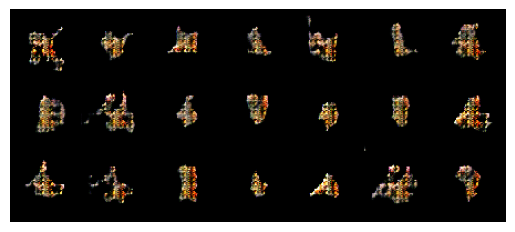

Epoch 4501, Loss_D 42.569, Loss_G 45.473, Time 0.65 sec
Epoch 4502, Loss_D 44.054, Loss_G 42.971, Time 0.65 sec
Epoch 4503, Loss_D 43.846, Loss_G 42.890, Time 0.65 sec
Epoch 4504, Loss_D 42.735, Loss_G 44.833, Time 0.64 sec
Epoch 4505, Loss_D 44.327, Loss_G 44.017, Time 0.67 sec
Epoch 4506, Loss_D 43.591, Loss_G 43.585, Time 0.68 sec
Epoch 4507, Loss_D 43.321, Loss_G 43.760, Time 0.68 sec
Epoch 4508, Loss_D 43.621, Loss_G 43.591, Time 0.68 sec
Epoch 4509, Loss_D 43.284, Loss_G 44.570, Time 0.68 sec
Epoch 4510, Loss_D 42.598, Loss_G 45.659, Time 0.68 sec
Epoch 4511, Loss_D 44.254, Loss_G 42.852, Time 0.68 sec
Epoch 4512, Loss_D 43.356, Loss_G 43.750, Time 0.68 sec
Epoch 4513, Loss_D 43.797, Loss_G 44.170, Time 0.66 sec
Epoch 4514, Loss_D 43.544, Loss_G 44.294, Time 0.65 sec
Epoch 4515, Loss_D 43.355, Loss_G 43.977, Time 0.65 sec
Epoch 4516, Loss_D 43.006, Loss_G 44.355, Time 0.64 sec
Epoch 4517, Loss_D 43.200, Loss_G 44.725, Time 0.66 sec
Epoch 4518, Loss_D 43.520, Loss_G 43.167, Time 0

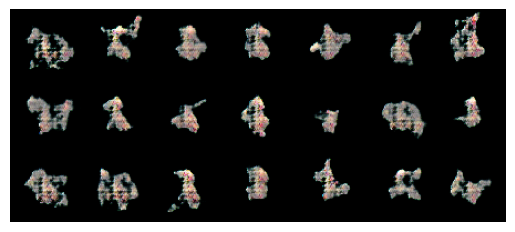

Epoch 4601, Loss_D 43.616, Loss_G 43.960, Time 0.68 sec
Epoch 4602, Loss_D 44.000, Loss_G 43.225, Time 0.69 sec
Epoch 4603, Loss_D 43.010, Loss_G 44.850, Time 0.67 sec
Epoch 4604, Loss_D 43.171, Loss_G 44.810, Time 0.65 sec
Epoch 4605, Loss_D 42.951, Loss_G 44.136, Time 0.65 sec
Epoch 4606, Loss_D 43.781, Loss_G 43.234, Time 0.65 sec
Epoch 4607, Loss_D 43.051, Loss_G 44.284, Time 0.65 sec
Epoch 4608, Loss_D 44.389, Loss_G 44.194, Time 0.65 sec
Epoch 4609, Loss_D 43.002, Loss_G 45.675, Time 0.65 sec
Epoch 4610, Loss_D 43.567, Loss_G 43.736, Time 0.66 sec
Epoch 4611, Loss_D 43.233, Loss_G 43.271, Time 0.65 sec
Epoch 4612, Loss_D 43.982, Loss_G 43.830, Time 0.65 sec
Epoch 4613, Loss_D 43.331, Loss_G 43.637, Time 0.65 sec
Epoch 4614, Loss_D 43.209, Loss_G 43.996, Time 0.65 sec
Epoch 4615, Loss_D 42.906, Loss_G 44.678, Time 0.67 sec
Epoch 4616, Loss_D 42.492, Loss_G 44.770, Time 0.65 sec
Epoch 4617, Loss_D 43.631, Loss_G 44.071, Time 0.65 sec
Epoch 4618, Loss_D 45.005, Loss_G 45.324, Time 0

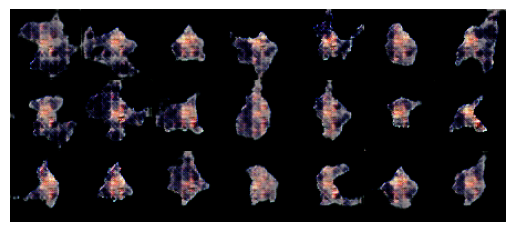

Epoch 4701, Loss_D 43.505, Loss_G 43.907, Time 0.65 sec
Epoch 4702, Loss_D 42.812, Loss_G 43.807, Time 0.65 sec
Epoch 4703, Loss_D 43.376, Loss_G 44.996, Time 0.65 sec
Epoch 4704, Loss_D 42.337, Loss_G 47.032, Time 0.65 sec
Epoch 4705, Loss_D 44.924, Loss_G 42.303, Time 0.65 sec
Epoch 4706, Loss_D 43.510, Loss_G 46.882, Time 0.65 sec
Epoch 4707, Loss_D 44.316, Loss_G 45.029, Time 0.65 sec
Epoch 4708, Loss_D 43.549, Loss_G 44.333, Time 0.65 sec
Epoch 4709, Loss_D 43.940, Loss_G 42.613, Time 0.65 sec
Epoch 4710, Loss_D 42.642, Loss_G 44.331, Time 0.65 sec
Epoch 4711, Loss_D 43.403, Loss_G 44.977, Time 0.65 sec
Epoch 4712, Loss_D 42.901, Loss_G 46.144, Time 0.65 sec
Epoch 4713, Loss_D 43.622, Loss_G 44.875, Time 0.65 sec
Epoch 4714, Loss_D 43.452, Loss_G 43.542, Time 0.66 sec
Epoch 4715, Loss_D 43.646, Loss_G 43.450, Time 0.65 sec
Epoch 4716, Loss_D 43.869, Loss_G 44.130, Time 0.65 sec
Epoch 4717, Loss_D 44.363, Loss_G 42.104, Time 0.65 sec
Epoch 4718, Loss_D 43.561, Loss_G 43.925, Time 0

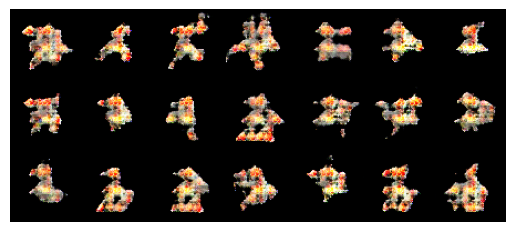

Epoch 4801, Loss_D 43.739, Loss_G 44.196, Time 0.70 sec
Epoch 4802, Loss_D 43.857, Loss_G 44.397, Time 0.71 sec
Epoch 4803, Loss_D 41.733, Loss_G 46.452, Time 0.70 sec
Epoch 4804, Loss_D 45.289, Loss_G 42.559, Time 0.72 sec
Epoch 4805, Loss_D 44.040, Loss_G 43.386, Time 0.72 sec
Epoch 4806, Loss_D 43.952, Loss_G 43.511, Time 0.71 sec
Epoch 4807, Loss_D 43.609, Loss_G 43.519, Time 0.71 sec
Epoch 4808, Loss_D 43.114, Loss_G 43.894, Time 0.67 sec
Epoch 4809, Loss_D 43.862, Loss_G 43.749, Time 0.65 sec
Epoch 4810, Loss_D 43.514, Loss_G 45.682, Time 0.66 sec
Epoch 4811, Loss_D 42.079, Loss_G 46.731, Time 0.65 sec
Epoch 4812, Loss_D 44.920, Loss_G 41.430, Time 0.65 sec
Epoch 4813, Loss_D 43.297, Loss_G 44.855, Time 0.65 sec
Epoch 4814, Loss_D 44.785, Loss_G 44.409, Time 0.65 sec
Epoch 4815, Loss_D 42.704, Loss_G 45.873, Time 0.65 sec
Epoch 4816, Loss_D 43.348, Loss_G 43.982, Time 0.65 sec
Epoch 4817, Loss_D 43.112, Loss_G 43.413, Time 0.65 sec
Epoch 4818, Loss_D 44.706, Loss_G 44.594, Time 0

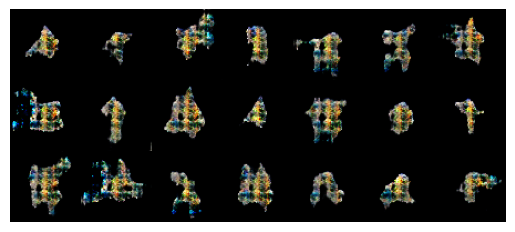

Epoch 4901, Loss_D 42.655, Loss_G 44.962, Time 0.65 sec
Epoch 4902, Loss_D 43.743, Loss_G 44.186, Time 0.65 sec
Epoch 4903, Loss_D 42.656, Loss_G 46.335, Time 0.65 sec
Epoch 4904, Loss_D 43.625, Loss_G 45.298, Time 0.65 sec
Epoch 4905, Loss_D 44.968, Loss_G 42.979, Time 0.65 sec
Epoch 4906, Loss_D 43.906, Loss_G 42.758, Time 0.67 sec
Epoch 4907, Loss_D 42.473, Loss_G 43.954, Time 0.65 sec
Epoch 4908, Loss_D 43.912, Loss_G 43.504, Time 0.65 sec
Epoch 4909, Loss_D 43.590, Loss_G 44.688, Time 0.65 sec
Epoch 4910, Loss_D 42.906, Loss_G 45.431, Time 0.65 sec
Epoch 4911, Loss_D 43.927, Loss_G 43.502, Time 0.67 sec
Epoch 4912, Loss_D 43.177, Loss_G 44.150, Time 0.70 sec
Epoch 4913, Loss_D 43.732, Loss_G 44.981, Time 0.71 sec
Epoch 4914, Loss_D 43.713, Loss_G 42.949, Time 0.70 sec
Epoch 4915, Loss_D 42.683, Loss_G 44.359, Time 0.70 sec
Epoch 4916, Loss_D 43.390, Loss_G 45.152, Time 0.71 sec
Epoch 4917, Loss_D 43.134, Loss_G 45.053, Time 0.71 sec
Epoch 4918, Loss_D 43.514, Loss_G 44.217, Time 0

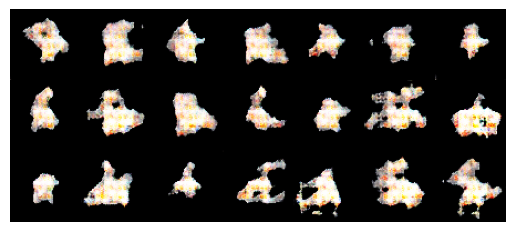

Epoch 5001, Loss_D 44.490, Loss_G 45.590, Time 0.65 sec
Epoch 5002, Loss_D 43.136, Loss_G 45.757, Time 0.68 sec
Epoch 5003, Loss_D 43.432, Loss_G 44.591, Time 0.68 sec
Epoch 5004, Loss_D 43.238, Loss_G 43.431, Time 0.68 sec
Epoch 5005, Loss_D 43.518, Loss_G 44.098, Time 0.68 sec
Epoch 5006, Loss_D 42.949, Loss_G 45.439, Time 0.68 sec
Epoch 5007, Loss_D 42.370, Loss_G 45.487, Time 0.67 sec
Epoch 5008, Loss_D 43.729, Loss_G 42.547, Time 0.70 sec
Epoch 5009, Loss_D 42.777, Loss_G 45.108, Time 0.67 sec
Epoch 5010, Loss_D 44.184, Loss_G 44.325, Time 0.65 sec
Epoch 5011, Loss_D 43.569, Loss_G 46.240, Time 0.64 sec
Epoch 5012, Loss_D 43.815, Loss_G 44.197, Time 0.65 sec
Epoch 5013, Loss_D 43.519, Loss_G 42.727, Time 0.64 sec
Epoch 5014, Loss_D 43.484, Loss_G 46.357, Time 0.65 sec
Epoch 5015, Loss_D 43.612, Loss_G 42.937, Time 0.64 sec
Epoch 5016, Loss_D 43.522, Loss_G 45.341, Time 0.65 sec
Epoch 5017, Loss_D 43.429, Loss_G 45.260, Time 0.65 sec
Epoch 5018, Loss_D 43.713, Loss_G 42.879, Time 0

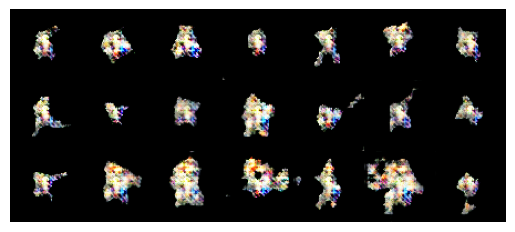

Epoch 5101, Loss_D 43.280, Loss_G 43.648, Time 0.65 sec
Epoch 5102, Loss_D 44.677, Loss_G 47.952, Time 0.67 sec
Epoch 5103, Loss_D 39.886, Loss_G 57.164, Time 0.65 sec
Epoch 5104, Loss_D 44.540, Loss_G 44.971, Time 0.64 sec
Epoch 5105, Loss_D 44.138, Loss_G 42.956, Time 0.65 sec
Epoch 5106, Loss_D 43.309, Loss_G 42.035, Time 0.65 sec
Epoch 5107, Loss_D 41.970, Loss_G 44.826, Time 0.64 sec
Epoch 5108, Loss_D 44.355, Loss_G 44.200, Time 0.65 sec
Epoch 5109, Loss_D 42.952, Loss_G 44.925, Time 0.65 sec
Epoch 5110, Loss_D 43.712, Loss_G 43.468, Time 0.64 sec
Epoch 5111, Loss_D 43.173, Loss_G 44.726, Time 0.65 sec
Epoch 5112, Loss_D 42.985, Loss_G 45.334, Time 0.65 sec
Epoch 5113, Loss_D 42.898, Loss_G 45.197, Time 0.65 sec
Epoch 5114, Loss_D 43.356, Loss_G 44.392, Time 0.65 sec
Epoch 5115, Loss_D 43.492, Loss_G 46.127, Time 0.65 sec
Epoch 5116, Loss_D 42.556, Loss_G 46.482, Time 0.65 sec
Epoch 5117, Loss_D 42.865, Loss_G 44.481, Time 0.66 sec
Epoch 5118, Loss_D 43.181, Loss_G 45.096, Time 0

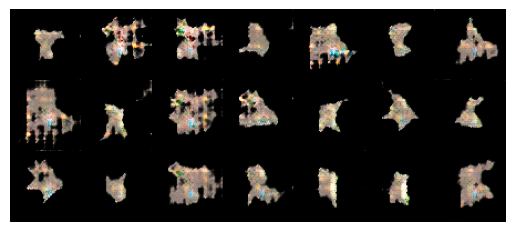

Epoch 5201, Loss_D 45.968, Loss_G 43.421, Time 0.64 sec
Epoch 5202, Loss_D 42.523, Loss_G 48.496, Time 0.65 sec
Epoch 5203, Loss_D 42.094, Loss_G 48.486, Time 0.64 sec
Epoch 5204, Loss_D 45.015, Loss_G 42.436, Time 0.65 sec
Epoch 5205, Loss_D 42.527, Loss_G 47.368, Time 0.65 sec
Epoch 5206, Loss_D 43.154, Loss_G 47.599, Time 0.64 sec
Epoch 5207, Loss_D 41.952, Loss_G 46.465, Time 0.64 sec
Epoch 5208, Loss_D 44.062, Loss_G 42.716, Time 0.65 sec
Epoch 5209, Loss_D 42.724, Loss_G 48.756, Time 0.64 sec
Epoch 5210, Loss_D 44.282, Loss_G 46.362, Time 0.64 sec
Epoch 5211, Loss_D 45.798, Loss_G 44.826, Time 0.64 sec
Epoch 5212, Loss_D 40.629, Loss_G 50.781, Time 0.65 sec
Epoch 5213, Loss_D 45.711, Loss_G 42.990, Time 0.65 sec
Epoch 5214, Loss_D 41.418, Loss_G 46.508, Time 0.65 sec
Epoch 5215, Loss_D 45.306, Loss_G 43.442, Time 0.65 sec
Epoch 5216, Loss_D 44.794, Loss_G 42.234, Time 0.65 sec
Epoch 5217, Loss_D 43.827, Loss_G 42.389, Time 0.65 sec
Epoch 5218, Loss_D 43.083, Loss_G 43.936, Time 0

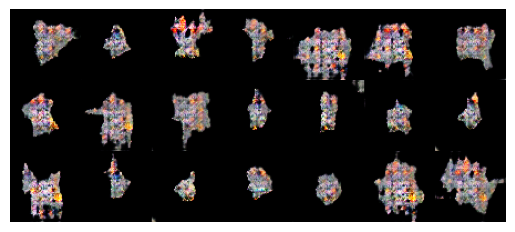

Epoch 5301, Loss_D 43.267, Loss_G 43.469, Time 0.66 sec
Epoch 5302, Loss_D 43.005, Loss_G 46.256, Time 0.65 sec
Epoch 5303, Loss_D 43.291, Loss_G 46.941, Time 0.65 sec
Epoch 5304, Loss_D 43.632, Loss_G 44.067, Time 0.65 sec
Epoch 5305, Loss_D 43.783, Loss_G 45.604, Time 0.65 sec
Epoch 5306, Loss_D 42.789, Loss_G 44.689, Time 0.66 sec
Epoch 5307, Loss_D 44.725, Loss_G 41.923, Time 0.65 sec
Epoch 5308, Loss_D 42.792, Loss_G 46.086, Time 0.66 sec
Epoch 5309, Loss_D 43.716, Loss_G 46.159, Time 0.65 sec
Epoch 5310, Loss_D 43.235, Loss_G 45.335, Time 0.65 sec
Epoch 5311, Loss_D 41.753, Loss_G 46.542, Time 0.66 sec
Epoch 5312, Loss_D 44.183, Loss_G 44.952, Time 0.66 sec
Epoch 5313, Loss_D 43.146, Loss_G 45.296, Time 0.65 sec
Epoch 5314, Loss_D 42.619, Loss_G 43.878, Time 0.65 sec
Epoch 5315, Loss_D 41.982, Loss_G 43.604, Time 0.66 sec
Epoch 5316, Loss_D 41.784, Loss_G 48.088, Time 0.66 sec
Epoch 5317, Loss_D 44.558, Loss_G 47.341, Time 0.66 sec
Epoch 5318, Loss_D 42.625, Loss_G 46.109, Time 0

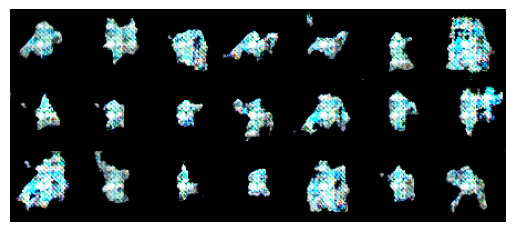

Epoch 5401, Loss_D 42.776, Loss_G 45.114, Time 0.67 sec
Epoch 5402, Loss_D 44.925, Loss_G 45.619, Time 0.67 sec
Epoch 5403, Loss_D 43.697, Loss_G 44.152, Time 0.66 sec
Epoch 5404, Loss_D 43.303, Loss_G 42.919, Time 0.66 sec
Epoch 5405, Loss_D 43.119, Loss_G 43.685, Time 0.66 sec
Epoch 5406, Loss_D 43.134, Loss_G 44.502, Time 0.66 sec
Epoch 5407, Loss_D 43.658, Loss_G 45.102, Time 0.66 sec
Epoch 5408, Loss_D 43.014, Loss_G 46.064, Time 0.66 sec
Epoch 5409, Loss_D 43.144, Loss_G 44.860, Time 0.66 sec
Epoch 5410, Loss_D 42.945, Loss_G 44.198, Time 0.71 sec
Epoch 5411, Loss_D 43.490, Loss_G 46.290, Time 0.71 sec
Epoch 5412, Loss_D 43.353, Loss_G 44.340, Time 0.70 sec
Epoch 5413, Loss_D 44.112, Loss_G 41.989, Time 0.71 sec
Epoch 5414, Loss_D 43.799, Loss_G 44.372, Time 0.71 sec
Epoch 5415, Loss_D 43.881, Loss_G 42.881, Time 0.72 sec
Epoch 5416, Loss_D 43.029, Loss_G 44.381, Time 0.71 sec
Epoch 5417, Loss_D 43.899, Loss_G 45.951, Time 0.67 sec
Epoch 5418, Loss_D 42.253, Loss_G 46.159, Time 0

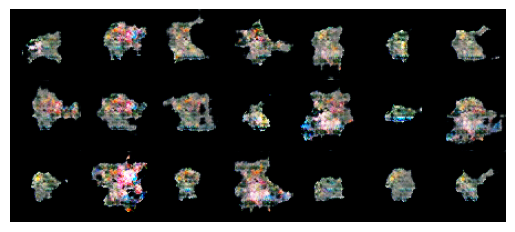

Epoch 5501, Loss_D 42.989, Loss_G 44.000, Time 0.72 sec
Epoch 5502, Loss_D 42.601, Loss_G 43.514, Time 0.70 sec
Epoch 5503, Loss_D 42.236, Loss_G 45.699, Time 0.71 sec
Epoch 5504, Loss_D 44.525, Loss_G 45.804, Time 0.71 sec
Epoch 5505, Loss_D 42.091, Loss_G 46.819, Time 0.69 sec
Epoch 5506, Loss_D 45.232, Loss_G 41.567, Time 0.66 sec
Epoch 5507, Loss_D 42.485, Loss_G 44.356, Time 0.66 sec
Epoch 5508, Loss_D 44.635, Loss_G 45.012, Time 0.66 sec
Epoch 5509, Loss_D 42.888, Loss_G 45.707, Time 0.67 sec
Epoch 5510, Loss_D 42.904, Loss_G 45.149, Time 0.66 sec
Epoch 5511, Loss_D 43.202, Loss_G 43.644, Time 0.66 sec
Epoch 5512, Loss_D 42.047, Loss_G 46.053, Time 0.67 sec
Epoch 5513, Loss_D 44.670, Loss_G 44.820, Time 0.68 sec
Epoch 5514, Loss_D 43.174, Loss_G 44.133, Time 0.66 sec
Epoch 5515, Loss_D 44.085, Loss_G 42.389, Time 0.66 sec
Epoch 5516, Loss_D 42.047, Loss_G 46.147, Time 0.66 sec
Epoch 5517, Loss_D 43.751, Loss_G 44.334, Time 0.66 sec
Epoch 5518, Loss_D 43.923, Loss_G 44.685, Time 0

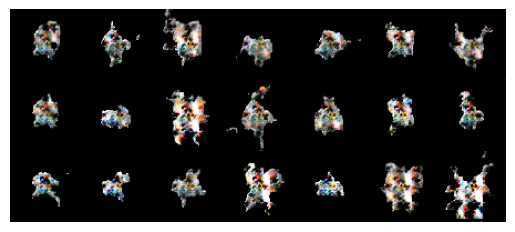

Epoch 5601, Loss_D 44.279, Loss_G 44.097, Time 0.66 sec
Epoch 5602, Loss_D 42.034, Loss_G 45.816, Time 0.66 sec
Epoch 5603, Loss_D 42.755, Loss_G 44.794, Time 0.66 sec
Epoch 5604, Loss_D 42.278, Loss_G 46.661, Time 0.66 sec
Epoch 5605, Loss_D 44.257, Loss_G 44.234, Time 0.66 sec
Epoch 5606, Loss_D 41.945, Loss_G 46.003, Time 0.67 sec
Epoch 5607, Loss_D 45.065, Loss_G 43.594, Time 0.66 sec
Epoch 5608, Loss_D 43.152, Loss_G 44.707, Time 0.66 sec
Epoch 5609, Loss_D 43.749, Loss_G 43.933, Time 0.66 sec
Epoch 5610, Loss_D 43.704, Loss_G 45.133, Time 0.66 sec
Epoch 5611, Loss_D 43.176, Loss_G 45.366, Time 0.66 sec
Epoch 5612, Loss_D 43.080, Loss_G 43.820, Time 0.67 sec
Epoch 5613, Loss_D 42.734, Loss_G 45.918, Time 0.67 sec
Epoch 5614, Loss_D 43.572, Loss_G 45.312, Time 0.67 sec
Epoch 5615, Loss_D 43.771, Loss_G 43.821, Time 0.67 sec
Epoch 5616, Loss_D 44.020, Loss_G 44.381, Time 0.67 sec
Epoch 5617, Loss_D 43.174, Loss_G 43.175, Time 0.66 sec
Epoch 5618, Loss_D 42.486, Loss_G 45.850, Time 0

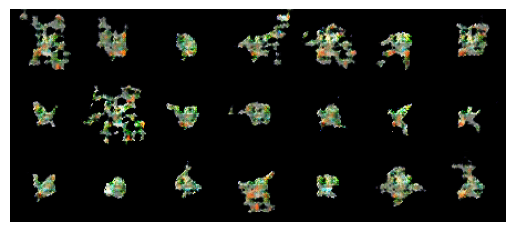

Epoch 5701, Loss_D 43.541, Loss_G 44.423, Time 0.66 sec
Epoch 5702, Loss_D 42.754, Loss_G 45.568, Time 0.68 sec
Epoch 5703, Loss_D 42.509, Loss_G 46.124, Time 0.66 sec
Epoch 5704, Loss_D 43.579, Loss_G 43.226, Time 0.65 sec
Epoch 5705, Loss_D 42.145, Loss_G 45.309, Time 0.67 sec
Epoch 5706, Loss_D 42.342, Loss_G 47.625, Time 0.66 sec
Epoch 5707, Loss_D 42.522, Loss_G 45.650, Time 0.65 sec
Epoch 5708, Loss_D 45.044, Loss_G 45.002, Time 0.66 sec
Epoch 5709, Loss_D 44.965, Loss_G 43.186, Time 0.66 sec
Epoch 5710, Loss_D 45.498, Loss_G 43.236, Time 0.66 sec
Epoch 5711, Loss_D 42.802, Loss_G 45.797, Time 0.65 sec
Epoch 5712, Loss_D 43.521, Loss_G 45.037, Time 0.66 sec
Epoch 5713, Loss_D 43.086, Loss_G 44.759, Time 0.65 sec
Epoch 5714, Loss_D 44.032, Loss_G 43.528, Time 0.65 sec
Epoch 5715, Loss_D 42.896, Loss_G 44.895, Time 0.66 sec
Epoch 5716, Loss_D 43.873, Loss_G 44.297, Time 0.66 sec
Epoch 5717, Loss_D 43.414, Loss_G 44.980, Time 0.65 sec
Epoch 5718, Loss_D 43.155, Loss_G 44.583, Time 0

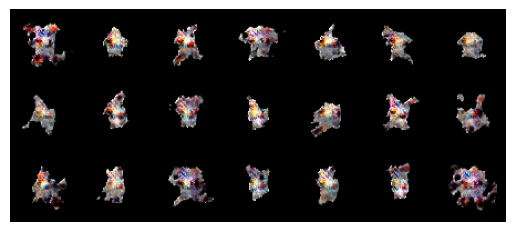

Epoch 5801, Loss_D 43.876, Loss_G 44.619, Time 0.70 sec
Epoch 5802, Loss_D 43.115, Loss_G 44.056, Time 0.73 sec
Epoch 5803, Loss_D 43.622, Loss_G 43.767, Time 0.69 sec
Epoch 5804, Loss_D 42.492, Loss_G 44.363, Time 0.69 sec
Epoch 5805, Loss_D 44.033, Loss_G 44.929, Time 0.69 sec
Epoch 5806, Loss_D 42.887, Loss_G 47.068, Time 0.69 sec
Epoch 5807, Loss_D 43.496, Loss_G 43.858, Time 0.69 sec
Epoch 5808, Loss_D 43.334, Loss_G 46.433, Time 0.67 sec
Epoch 5809, Loss_D 42.416, Loss_G 45.481, Time 0.68 sec
Epoch 5810, Loss_D 43.905, Loss_G 42.573, Time 0.69 sec
Epoch 5811, Loss_D 42.692, Loss_G 48.401, Time 0.68 sec
Epoch 5812, Loss_D 41.670, Loss_G 47.672, Time 0.69 sec
Epoch 5813, Loss_D 42.347, Loss_G 43.789, Time 0.70 sec
Epoch 5814, Loss_D 42.655, Loss_G 46.737, Time 0.69 sec
Epoch 5815, Loss_D 42.531, Loss_G 44.909, Time 0.71 sec
Epoch 5816, Loss_D 42.746, Loss_G 52.733, Time 0.74 sec
Epoch 5817, Loss_D 42.454, Loss_G 46.212, Time 0.69 sec
Epoch 5818, Loss_D 43.677, Loss_G 45.274, Time 0

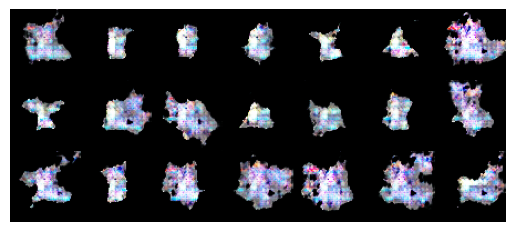

Epoch 5901, Loss_D 41.534, Loss_G 45.969, Time 0.71 sec
Epoch 5902, Loss_D 42.542, Loss_G 46.661, Time 0.69 sec
Epoch 5903, Loss_D 44.514, Loss_G 45.536, Time 0.70 sec
Epoch 5904, Loss_D 42.542, Loss_G 44.986, Time 0.69 sec
Epoch 5905, Loss_D 41.466, Loss_G 45.853, Time 0.69 sec
Epoch 5906, Loss_D 44.725, Loss_G 42.854, Time 0.69 sec
Epoch 5907, Loss_D 43.386, Loss_G 46.676, Time 0.69 sec
Epoch 5908, Loss_D 45.662, Loss_G 44.591, Time 0.70 sec
Epoch 5909, Loss_D 43.597, Loss_G 44.233, Time 0.69 sec
Epoch 5910, Loss_D 43.124, Loss_G 43.896, Time 0.70 sec
Epoch 5911, Loss_D 43.103, Loss_G 44.503, Time 0.69 sec
Epoch 5912, Loss_D 42.815, Loss_G 44.665, Time 0.69 sec
Epoch 5913, Loss_D 42.603, Loss_G 44.312, Time 0.70 sec
Epoch 5914, Loss_D 44.886, Loss_G 43.820, Time 0.69 sec
Epoch 5915, Loss_D 43.639, Loss_G 45.203, Time 0.69 sec
Epoch 5916, Loss_D 42.210, Loss_G 46.119, Time 0.69 sec
Epoch 5917, Loss_D 43.787, Loss_G 43.805, Time 0.69 sec
Epoch 5918, Loss_D 42.773, Loss_G 45.678, Time 0

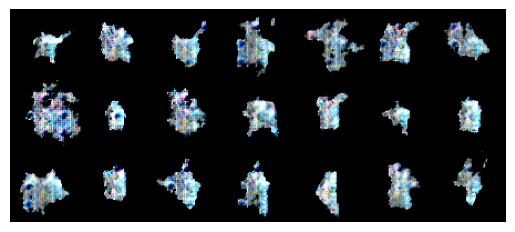

Epoch 6001, Loss_D 42.759, Loss_G 44.601, Time 0.70 sec
Epoch 6002, Loss_D 43.784, Loss_G 46.757, Time 0.69 sec
Epoch 6003, Loss_D 42.487, Loss_G 46.604, Time 0.70 sec
Epoch 6004, Loss_D 42.592, Loss_G 44.394, Time 0.70 sec
Epoch 6005, Loss_D 44.318, Loss_G 45.894, Time 0.70 sec
Epoch 6006, Loss_D 41.880, Loss_G 46.984, Time 0.69 sec
Epoch 6007, Loss_D 44.343, Loss_G 42.313, Time 0.69 sec
Epoch 6008, Loss_D 43.619, Loss_G 44.263, Time 0.69 sec
Epoch 6009, Loss_D 42.932, Loss_G 45.670, Time 0.69 sec
Epoch 6010, Loss_D 42.517, Loss_G 46.061, Time 0.69 sec
Epoch 6011, Loss_D 43.439, Loss_G 44.890, Time 0.69 sec
Epoch 6012, Loss_D 43.769, Loss_G 44.033, Time 0.69 sec
Epoch 6013, Loss_D 42.619, Loss_G 45.859, Time 0.68 sec
Epoch 6014, Loss_D 41.827, Loss_G 48.078, Time 0.69 sec
Epoch 6015, Loss_D 43.450, Loss_G 45.270, Time 0.68 sec
Epoch 6016, Loss_D 44.402, Loss_G 44.011, Time 0.69 sec
Epoch 6017, Loss_D 43.167, Loss_G 44.043, Time 0.71 sec
Epoch 6018, Loss_D 43.324, Loss_G 46.643, Time 0

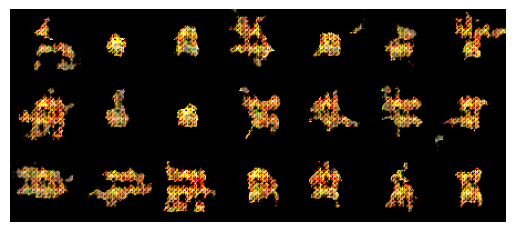

Epoch 6101, Loss_D 40.963, Loss_G 49.167, Time 0.70 sec
Epoch 6102, Loss_D 43.176, Loss_G 44.306, Time 0.70 sec
Epoch 6103, Loss_D 42.050, Loss_G 47.335, Time 0.70 sec
Epoch 6104, Loss_D 42.278, Loss_G 47.629, Time 0.71 sec
Epoch 6105, Loss_D 43.027, Loss_G 45.003, Time 0.71 sec
Epoch 6106, Loss_D 43.375, Loss_G 44.654, Time 0.70 sec
Epoch 6107, Loss_D 42.030, Loss_G 45.600, Time 0.70 sec
Epoch 6108, Loss_D 42.332, Loss_G 45.079, Time 0.73 sec
Epoch 6109, Loss_D 42.855, Loss_G 48.989, Time 0.76 sec
Epoch 6110, Loss_D 41.820, Loss_G 47.503, Time 0.74 sec
Epoch 6111, Loss_D 42.702, Loss_G 46.978, Time 0.74 sec
Epoch 6112, Loss_D 43.317, Loss_G 48.144, Time 0.74 sec
Epoch 6113, Loss_D 42.242, Loss_G 47.820, Time 0.79 sec
Epoch 6114, Loss_D 43.165, Loss_G 44.688, Time 0.74 sec
Epoch 6115, Loss_D 42.666, Loss_G 47.280, Time 0.72 sec
Epoch 6116, Loss_D 44.069, Loss_G 45.710, Time 0.71 sec
Epoch 6117, Loss_D 42.960, Loss_G 46.221, Time 0.70 sec
Epoch 6118, Loss_D 43.500, Loss_G 43.219, Time 0

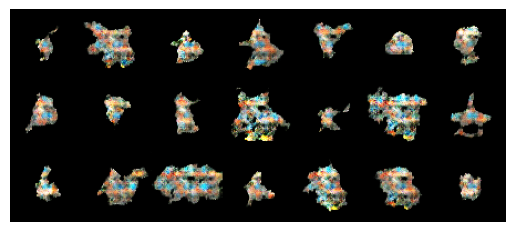

Epoch 6201, Loss_D 43.019, Loss_G 46.012, Time 0.71 sec
Epoch 6202, Loss_D 44.601, Loss_G 48.249, Time 0.71 sec
Epoch 6203, Loss_D 42.807, Loss_G 47.033, Time 0.72 sec
Epoch 6204, Loss_D 41.897, Loss_G 44.783, Time 0.72 sec
Epoch 6205, Loss_D 42.037, Loss_G 47.218, Time 0.70 sec
Epoch 6206, Loss_D 40.786, Loss_G 47.129, Time 0.71 sec
Epoch 6207, Loss_D 42.232, Loss_G 48.414, Time 0.70 sec
Epoch 6208, Loss_D 41.088, Loss_G 54.880, Time 0.71 sec
Epoch 6209, Loss_D 45.012, Loss_G 43.964, Time 0.71 sec
Epoch 6210, Loss_D 42.236, Loss_G 48.578, Time 0.71 sec
Epoch 6211, Loss_D 43.391, Loss_G 46.256, Time 0.71 sec
Epoch 6212, Loss_D 42.024, Loss_G 47.166, Time 0.71 sec
Epoch 6213, Loss_D 43.022, Loss_G 44.792, Time 0.71 sec
Epoch 6214, Loss_D 43.926, Loss_G 45.618, Time 0.72 sec
Epoch 6215, Loss_D 43.806, Loss_G 45.567, Time 0.72 sec
Epoch 6216, Loss_D 42.158, Loss_G 46.670, Time 0.71 sec
Epoch 6217, Loss_D 43.749, Loss_G 44.861, Time 0.72 sec
Epoch 6218, Loss_D 42.500, Loss_G 48.668, Time 0

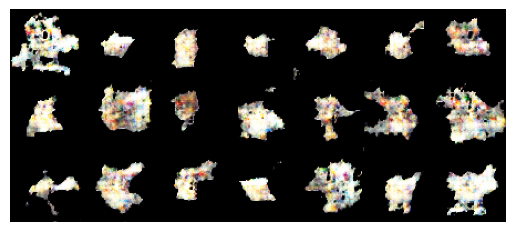

Epoch 6301, Loss_D 43.817, Loss_G 47.694, Time 0.71 sec
Epoch 6302, Loss_D 41.295, Loss_G 47.793, Time 0.70 sec
Epoch 6303, Loss_D 45.113, Loss_G 43.660, Time 0.71 sec
Epoch 6304, Loss_D 41.771, Loss_G 47.089, Time 0.71 sec
Epoch 6305, Loss_D 44.001, Loss_G 45.107, Time 0.71 sec
Epoch 6306, Loss_D 41.635, Loss_G 46.943, Time 0.71 sec
Epoch 6307, Loss_D 45.095, Loss_G 45.774, Time 0.71 sec
Epoch 6308, Loss_D 42.118, Loss_G 47.495, Time 0.71 sec
Epoch 6309, Loss_D 42.823, Loss_G 45.370, Time 0.71 sec
Epoch 6310, Loss_D 42.423, Loss_G 47.856, Time 0.70 sec
Epoch 6311, Loss_D 41.497, Loss_G 49.468, Time 0.71 sec
Epoch 6312, Loss_D 43.025, Loss_G 46.325, Time 0.71 sec
Epoch 6313, Loss_D 44.820, Loss_G 45.222, Time 0.71 sec
Epoch 6314, Loss_D 41.863, Loss_G 47.152, Time 0.72 sec
Epoch 6315, Loss_D 44.249, Loss_G 45.379, Time 0.73 sec
Epoch 6316, Loss_D 41.568, Loss_G 46.640, Time 0.72 sec
Epoch 6317, Loss_D 41.297, Loss_G 47.400, Time 0.72 sec
Epoch 6318, Loss_D 42.945, Loss_G 47.834, Time 0

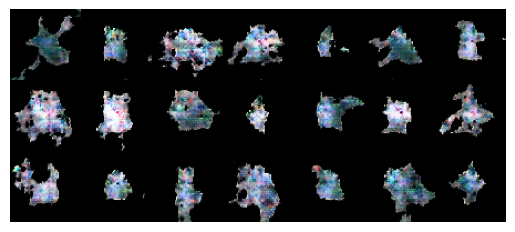

Epoch 6401, Loss_D 42.711, Loss_G 47.855, Time 0.74 sec
Epoch 6402, Loss_D 45.239, Loss_G 45.892, Time 0.75 sec
Epoch 6403, Loss_D 41.867, Loss_G 47.143, Time 0.73 sec
Epoch 6404, Loss_D 41.198, Loss_G 47.135, Time 0.74 sec
Epoch 6405, Loss_D 43.006, Loss_G 50.393, Time 0.72 sec
Epoch 6406, Loss_D 42.644, Loss_G 45.142, Time 0.75 sec
Epoch 6407, Loss_D 42.307, Loss_G 46.520, Time 0.72 sec
Epoch 6408, Loss_D 42.921, Loss_G 46.179, Time 0.71 sec
Epoch 6409, Loss_D 42.290, Loss_G 46.224, Time 0.71 sec
Epoch 6410, Loss_D 42.114, Loss_G 48.765, Time 0.72 sec
Epoch 6411, Loss_D 43.013, Loss_G 45.257, Time 0.71 sec
Epoch 6412, Loss_D 43.361, Loss_G 50.733, Time 0.71 sec
Epoch 6413, Loss_D 42.257, Loss_G 49.049, Time 0.71 sec
Epoch 6414, Loss_D 44.556, Loss_G 43.952, Time 0.71 sec
Epoch 6415, Loss_D 41.477, Loss_G 47.899, Time 0.72 sec
Epoch 6416, Loss_D 40.477, Loss_G 52.774, Time 0.72 sec
Epoch 6417, Loss_D 44.082, Loss_G 48.913, Time 0.71 sec
Epoch 6418, Loss_D 45.529, Loss_G 43.319, Time 0

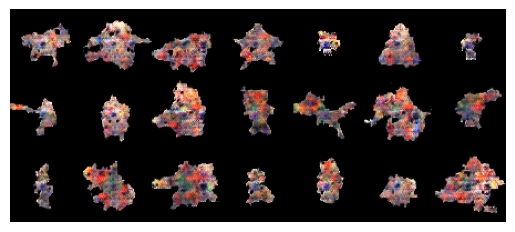

Epoch 6501, Loss_D 41.042, Loss_G 47.174, Time 0.71 sec
Epoch 6502, Loss_D 41.531, Loss_G 48.594, Time 0.71 sec
Epoch 6503, Loss_D 44.545, Loss_G 50.819, Time 0.74 sec
Epoch 6504, Loss_D 41.409, Loss_G 50.899, Time 0.71 sec
Epoch 6505, Loss_D 42.214, Loss_G 47.241, Time 0.71 sec
Epoch 6506, Loss_D 42.163, Loss_G 48.225, Time 0.71 sec
Epoch 6507, Loss_D 42.225, Loss_G 47.814, Time 0.71 sec
Epoch 6508, Loss_D 41.974, Loss_G 48.146, Time 0.71 sec
Epoch 6509, Loss_D 43.084, Loss_G 46.012, Time 0.71 sec
Epoch 6510, Loss_D 40.910, Loss_G 49.545, Time 0.71 sec
Epoch 6511, Loss_D 44.176, Loss_G 48.005, Time 0.72 sec
Epoch 6512, Loss_D 40.836, Loss_G 49.438, Time 0.71 sec
Epoch 6513, Loss_D 40.757, Loss_G 50.500, Time 0.71 sec
Epoch 6514, Loss_D 44.791, Loss_G 54.031, Time 0.71 sec
Epoch 6515, Loss_D 40.329, Loss_G 52.029, Time 0.72 sec
Epoch 6516, Loss_D 42.931, Loss_G 47.076, Time 0.71 sec
Epoch 6517, Loss_D 41.734, Loss_G 48.921, Time 0.72 sec
Epoch 6518, Loss_D 43.031, Loss_G 47.733, Time 0

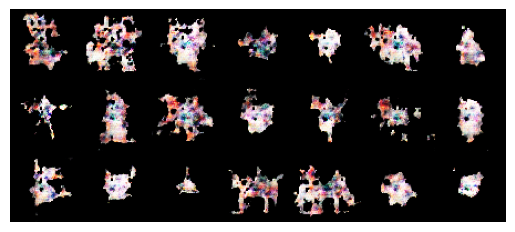

Epoch 6601, Loss_D 41.431, Loss_G 48.384, Time 0.70 sec
Epoch 6602, Loss_D 41.878, Loss_G 47.737, Time 0.70 sec
Epoch 6603, Loss_D 41.788, Loss_G 47.800, Time 0.70 sec
Epoch 6604, Loss_D 42.356, Loss_G 47.633, Time 0.71 sec
Epoch 6605, Loss_D 38.462, Loss_G 54.440, Time 0.71 sec
Epoch 6606, Loss_D 43.817, Loss_G 52.509, Time 0.75 sec
Epoch 6607, Loss_D 44.585, Loss_G 44.916, Time 0.78 sec
Epoch 6608, Loss_D 41.088, Loss_G 49.313, Time 0.74 sec
Epoch 6609, Loss_D 44.507, Loss_G 48.135, Time 0.73 sec
Epoch 6610, Loss_D 40.180, Loss_G 50.865, Time 0.73 sec
Epoch 6611, Loss_D 41.177, Loss_G 48.996, Time 0.74 sec
Epoch 6612, Loss_D 39.301, Loss_G 52.814, Time 0.73 sec
Epoch 6613, Loss_D 42.670, Loss_G 48.830, Time 0.72 sec
Epoch 6614, Loss_D 41.189, Loss_G 47.218, Time 0.70 sec
Epoch 6615, Loss_D 40.758, Loss_G 48.913, Time 0.70 sec
Epoch 6616, Loss_D 42.620, Loss_G 49.465, Time 0.70 sec
Epoch 6617, Loss_D 43.631, Loss_G 46.536, Time 0.71 sec
Epoch 6618, Loss_D 39.886, Loss_G 51.486, Time 0

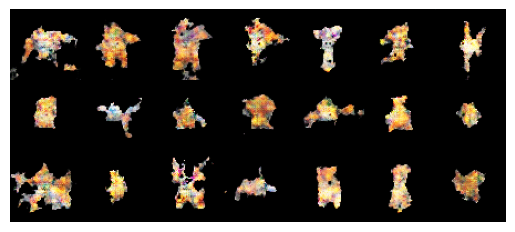

Epoch 6701, Loss_D 41.524, Loss_G 49.503, Time 0.71 sec
Epoch 6702, Loss_D 40.539, Loss_G 50.153, Time 0.70 sec
Epoch 6703, Loss_D 40.579, Loss_G 53.110, Time 0.70 sec
Epoch 6704, Loss_D 40.951, Loss_G 50.124, Time 0.70 sec
Epoch 6705, Loss_D 40.211, Loss_G 49.880, Time 0.70 sec
Epoch 6706, Loss_D 41.748, Loss_G 50.249, Time 0.71 sec
Epoch 6707, Loss_D 41.270, Loss_G 50.477, Time 0.70 sec
Epoch 6708, Loss_D 39.060, Loss_G 51.775, Time 0.70 sec
Epoch 6709, Loss_D 43.509, Loss_G 48.602, Time 0.68 sec
Epoch 6710, Loss_D 41.745, Loss_G 48.536, Time 0.69 sec
Epoch 6711, Loss_D 40.438, Loss_G 49.257, Time 0.70 sec
Epoch 6712, Loss_D 41.304, Loss_G 49.131, Time 0.71 sec
Epoch 6713, Loss_D 39.758, Loss_G 52.711, Time 0.71 sec
Epoch 6714, Loss_D 39.327, Loss_G 50.934, Time 0.70 sec
Epoch 6715, Loss_D 40.632, Loss_G 48.958, Time 0.69 sec
Epoch 6716, Loss_D 40.186, Loss_G 49.132, Time 0.68 sec
Epoch 6717, Loss_D 40.653, Loss_G 51.066, Time 0.68 sec
Epoch 6718, Loss_D 42.107, Loss_G 50.738, Time 0

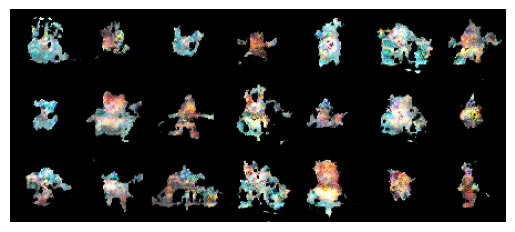

Epoch 6801, Loss_D 39.314, Loss_G 52.673, Time 0.71 sec
Epoch 6802, Loss_D 40.303, Loss_G 52.448, Time 0.71 sec
Epoch 6803, Loss_D 38.065, Loss_G 55.150, Time 0.70 sec
Epoch 6804, Loss_D 38.782, Loss_G 55.929, Time 0.70 sec
Epoch 6805, Loss_D 39.502, Loss_G 53.139, Time 0.71 sec
Epoch 6806, Loss_D 40.159, Loss_G 56.888, Time 0.70 sec
Epoch 6807, Loss_D 39.382, Loss_G 53.767, Time 0.70 sec
Epoch 6808, Loss_D 37.675, Loss_G 54.665, Time 0.70 sec
Epoch 6809, Loss_D 39.104, Loss_G 54.911, Time 0.70 sec
Epoch 6810, Loss_D 39.046, Loss_G 53.574, Time 0.70 sec
Epoch 6811, Loss_D 37.964, Loss_G 56.480, Time 0.70 sec
Epoch 6812, Loss_D 40.735, Loss_G 53.939, Time 0.71 sec
Epoch 6813, Loss_D 39.747, Loss_G 52.828, Time 0.70 sec
Epoch 6814, Loss_D 37.935, Loss_G 55.375, Time 0.70 sec
Epoch 6815, Loss_D 38.909, Loss_G 53.346, Time 0.70 sec
Epoch 6816, Loss_D 40.636, Loss_G 56.666, Time 0.70 sec
Epoch 6817, Loss_D 38.557, Loss_G 55.032, Time 0.70 sec
Epoch 6818, Loss_D 38.658, Loss_G 54.953, Time 0

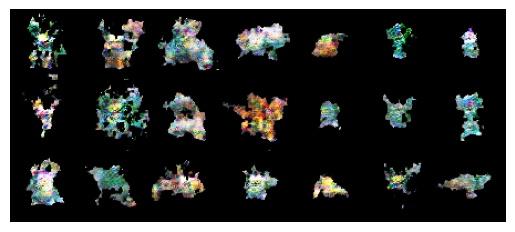

Epoch 6901, Loss_D 37.756, Loss_G 54.893, Time 0.73 sec
Epoch 6902, Loss_D 38.056, Loss_G 56.459, Time 0.69 sec
Epoch 6903, Loss_D 38.245, Loss_G 54.314, Time 0.70 sec
Epoch 6904, Loss_D 37.572, Loss_G 55.663, Time 0.70 sec
Epoch 6905, Loss_D 38.121, Loss_G 55.206, Time 0.70 sec
Epoch 6906, Loss_D 37.073, Loss_G 57.480, Time 0.70 sec
Epoch 6907, Loss_D 38.123, Loss_G 55.971, Time 0.70 sec
Epoch 6908, Loss_D 37.949, Loss_G 56.690, Time 0.70 sec
Epoch 6909, Loss_D 37.363, Loss_G 57.542, Time 0.69 sec
Epoch 6910, Loss_D 37.644, Loss_G 55.722, Time 0.69 sec
Epoch 6911, Loss_D 38.006, Loss_G 56.038, Time 0.69 sec
Epoch 6912, Loss_D 37.658, Loss_G 55.797, Time 0.70 sec
Epoch 6913, Loss_D 37.654, Loss_G 56.229, Time 0.69 sec
Epoch 6914, Loss_D 37.954, Loss_G 55.710, Time 0.71 sec
Epoch 6915, Loss_D 37.359, Loss_G 55.370, Time 0.70 sec
Epoch 6916, Loss_D 38.491, Loss_G 56.269, Time 0.70 sec
Epoch 6917, Loss_D 37.324, Loss_G 56.556, Time 0.70 sec
Epoch 6918, Loss_D 38.046, Loss_G 54.846, Time 0

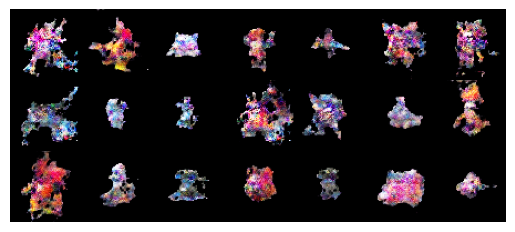

Epoch 7001, Loss_D 34.139, Loss_G 62.787, Time 0.68 sec
Epoch 7002, Loss_D 35.216, Loss_G 64.166, Time 0.70 sec
Epoch 7003, Loss_D 34.218, Loss_G 62.396, Time 0.68 sec
Epoch 7004, Loss_D 34.344, Loss_G 62.904, Time 0.69 sec
Epoch 7005, Loss_D 33.935, Loss_G 62.948, Time 0.68 sec
Epoch 7006, Loss_D 34.864, Loss_G 64.290, Time 0.69 sec
Epoch 7007, Loss_D 34.522, Loss_G 66.240, Time 0.68 sec
Epoch 7008, Loss_D 34.318, Loss_G 62.675, Time 0.68 sec
Epoch 7009, Loss_D 35.523, Loss_G 64.898, Time 0.70 sec
Epoch 7010, Loss_D 34.207, Loss_G 64.719, Time 0.73 sec
Epoch 7011, Loss_D 34.042, Loss_G 62.494, Time 0.70 sec
Epoch 7012, Loss_D 33.701, Loss_G 63.263, Time 0.70 sec
Epoch 7013, Loss_D 34.414, Loss_G 64.696, Time 0.70 sec
Epoch 7014, Loss_D 33.377, Loss_G 66.065, Time 0.71 sec
Epoch 7015, Loss_D 33.558, Loss_G 64.759, Time 0.70 sec
Epoch 7016, Loss_D 34.438, Loss_G 64.822, Time 0.70 sec
Epoch 7017, Loss_D 33.394, Loss_G 65.180, Time 0.70 sec
Epoch 7018, Loss_D 34.708, Loss_G 65.320, Time 0

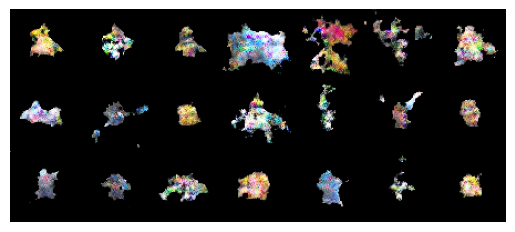

Epoch 7101, Loss_D 29.173, Loss_G 75.425, Time 0.69 sec
Epoch 7102, Loss_D 30.024, Loss_G 76.225, Time 0.69 sec
Epoch 7103, Loss_D 28.632, Loss_G 76.648, Time 0.69 sec
Epoch 7104, Loss_D 29.348, Loss_G 75.555, Time 0.70 sec
Epoch 7105, Loss_D 29.133, Loss_G 76.406, Time 0.69 sec
Epoch 7106, Loss_D 30.052, Loss_G 76.755, Time 0.69 sec
Epoch 7107, Loss_D 28.904, Loss_G 74.788, Time 0.70 sec
Epoch 7108, Loss_D 28.735, Loss_G 77.872, Time 0.70 sec
Epoch 7109, Loss_D 29.391, Loss_G 75.668, Time 0.71 sec
Epoch 7110, Loss_D 28.181, Loss_G 76.775, Time 0.71 sec
Epoch 7111, Loss_D 28.778, Loss_G 78.600, Time 0.71 sec
Epoch 7112, Loss_D 29.564, Loss_G 79.684, Time 0.71 sec
Epoch 7113, Loss_D 27.996, Loss_G 77.748, Time 0.71 sec
Epoch 7114, Loss_D 28.687, Loss_G 78.425, Time 0.71 sec
Epoch 7115, Loss_D 27.717, Loss_G 78.747, Time 0.71 sec
Epoch 7116, Loss_D 28.052, Loss_G 77.752, Time 0.73 sec
Epoch 7117, Loss_D 27.503, Loss_G 78.283, Time 0.73 sec
Epoch 7118, Loss_D 29.019, Loss_G 80.826, Time 0

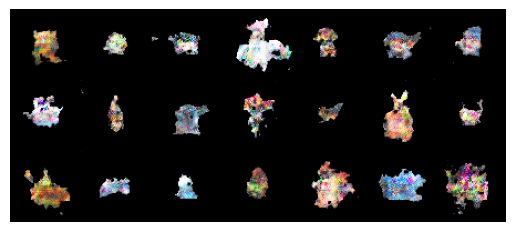

Epoch 7201, Loss_D 24.132, Loss_G 95.635, Time 0.72 sec
Epoch 7202, Loss_D 24.454, Loss_G 94.999, Time 0.72 sec
Epoch 7203, Loss_D 22.943, Loss_G 95.306, Time 0.72 sec
Epoch 7204, Loss_D 23.939, Loss_G 95.444, Time 0.72 sec
Epoch 7205, Loss_D 23.243, Loss_G 92.520, Time 0.71 sec
Epoch 7206, Loss_D 23.107, Loss_G 95.425, Time 0.70 sec
Epoch 7207, Loss_D 24.218, Loss_G 93.628, Time 0.69 sec
Epoch 7208, Loss_D 24.028, Loss_G 95.253, Time 0.68 sec
Epoch 7209, Loss_D 24.012, Loss_G 99.084, Time 0.68 sec
Epoch 7210, Loss_D 24.554, Loss_G 95.189, Time 0.68 sec
Epoch 7211, Loss_D 23.138, Loss_G 95.667, Time 0.68 sec
Epoch 7212, Loss_D 24.610, Loss_G 97.830, Time 0.68 sec
Epoch 7213, Loss_D 23.926, Loss_G 94.672, Time 0.69 sec
Epoch 7214, Loss_D 23.094, Loss_G 94.768, Time 0.69 sec
Epoch 7215, Loss_D 22.973, Loss_G 96.046, Time 0.69 sec
Epoch 7216, Loss_D 23.385, Loss_G 96.976, Time 0.69 sec
Epoch 7217, Loss_D 22.764, Loss_G 97.770, Time 0.68 sec
Epoch 7218, Loss_D 23.340, Loss_G 94.802, Time 0

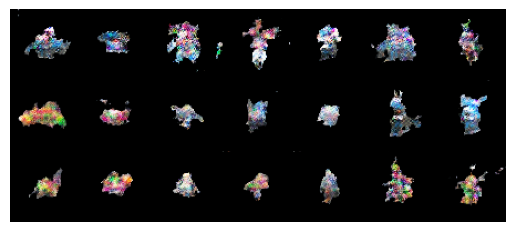

Epoch 7301, Loss_D 19.480, Loss_G 114.154, Time 0.69 sec
Epoch 7302, Loss_D 19.570, Loss_G 116.862, Time 0.69 sec
Epoch 7303, Loss_D 19.417, Loss_G 112.617, Time 0.69 sec
Epoch 7304, Loss_D 19.130, Loss_G 114.601, Time 0.70 sec
Epoch 7305, Loss_D 18.898, Loss_G 114.201, Time 0.70 sec
Epoch 7306, Loss_D 19.106, Loss_G 114.526, Time 0.70 sec
Epoch 7307, Loss_D 18.040, Loss_G 119.335, Time 0.71 sec
Epoch 7308, Loss_D 19.223, Loss_G 117.029, Time 0.71 sec
Epoch 7309, Loss_D 17.217, Loss_G 115.608, Time 0.71 sec
Epoch 7310, Loss_D 18.974, Loss_G 119.996, Time 0.70 sec
Epoch 7311, Loss_D 19.550, Loss_G 116.665, Time 0.70 sec
Epoch 7312, Loss_D 21.188, Loss_G 121.431, Time 0.70 sec
Epoch 7313, Loss_D 17.880, Loss_G 115.997, Time 0.70 sec
Epoch 7314, Loss_D 16.839, Loss_G 117.400, Time 0.70 sec
Epoch 7315, Loss_D 17.134, Loss_G 117.187, Time 0.70 sec
Epoch 7316, Loss_D 17.906, Loss_G 114.892, Time 0.70 sec
Epoch 7317, Loss_D 17.899, Loss_G 119.174, Time 0.71 sec
Epoch 7318, Loss_D 25.884, Loss

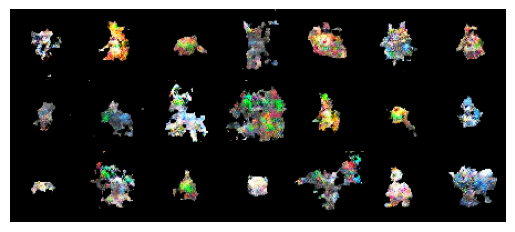

Epoch 7401, Loss_D 15.234, Loss_G 140.537, Time 0.69 sec
Epoch 7402, Loss_D 14.619, Loss_G 139.947, Time 0.69 sec
Epoch 7403, Loss_D 14.869, Loss_G 135.329, Time 0.69 sec
Epoch 7404, Loss_D 15.723, Loss_G 139.067, Time 0.70 sec
Epoch 7405, Loss_D 14.598, Loss_G 143.524, Time 0.70 sec
Epoch 7406, Loss_D 15.914, Loss_G 140.283, Time 0.70 sec
Epoch 7407, Loss_D 13.710, Loss_G 144.150, Time 0.69 sec
Epoch 7408, Loss_D 15.669, Loss_G 138.451, Time 0.70 sec
Epoch 7409, Loss_D 14.143, Loss_G 144.407, Time 0.69 sec
Epoch 7410, Loss_D 14.396, Loss_G 146.181, Time 0.69 sec
Epoch 7411, Loss_D 14.532, Loss_G 139.395, Time 0.70 sec
Epoch 7412, Loss_D 14.308, Loss_G 147.265, Time 0.70 sec
Epoch 7413, Loss_D 15.566, Loss_G 139.881, Time 0.74 sec
Epoch 7414, Loss_D 15.118, Loss_G 138.770, Time 0.77 sec
Epoch 7415, Loss_D 16.085, Loss_G 146.138, Time 0.73 sec
Epoch 7416, Loss_D 14.627, Loss_G 143.804, Time 0.72 sec
Epoch 7417, Loss_D 14.527, Loss_G 137.255, Time 0.72 sec
Epoch 7418, Loss_D 13.942, Loss

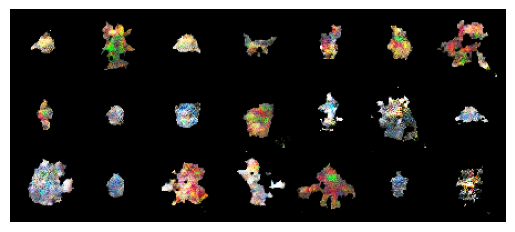

Epoch 7501, Loss_D 11.262, Loss_G 158.719, Time 0.72 sec
Epoch 7502, Loss_D 11.273, Loss_G 166.502, Time 0.71 sec
Epoch 7503, Loss_D 11.271, Loss_G 160.834, Time 0.72 sec
Epoch 7504, Loss_D 11.387, Loss_G 164.044, Time 0.71 sec
Epoch 7505, Loss_D 10.759, Loss_G 164.599, Time 0.70 sec
Epoch 7506, Loss_D 12.822, Loss_G 166.973, Time 0.69 sec
Epoch 7507, Loss_D 13.546, Loss_G 171.646, Time 0.69 sec
Epoch 7508, Loss_D 10.891, Loss_G 162.651, Time 0.69 sec
Epoch 7509, Loss_D 12.561, Loss_G 169.702, Time 0.69 sec
Epoch 7510, Loss_D 12.175, Loss_G 167.942, Time 0.69 sec
Epoch 7511, Loss_D 9.619, Loss_G 164.535, Time 0.69 sec
Epoch 7512, Loss_D 10.176, Loss_G 163.118, Time 0.69 sec
Epoch 7513, Loss_D 11.578, Loss_G 168.700, Time 0.69 sec
Epoch 7514, Loss_D 11.239, Loss_G 170.668, Time 0.69 sec
Epoch 7515, Loss_D 10.664, Loss_G 173.670, Time 0.69 sec
Epoch 7516, Loss_D 10.564, Loss_G 165.095, Time 0.68 sec
Epoch 7517, Loss_D 11.625, Loss_G 168.481, Time 0.69 sec
Epoch 7518, Loss_D 16.315, Loss_

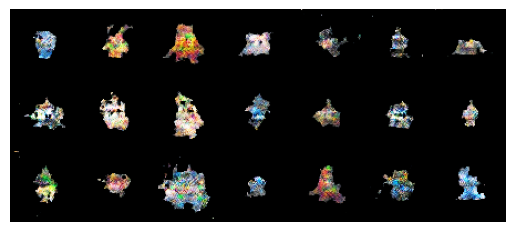

Epoch 7601, Loss_D 8.474, Loss_G 186.567, Time 0.69 sec
Epoch 7602, Loss_D 11.021, Loss_G 198.286, Time 0.69 sec
Epoch 7603, Loss_D 8.521, Loss_G 189.726, Time 0.69 sec
Epoch 7604, Loss_D 8.545, Loss_G 191.687, Time 0.69 sec
Epoch 7605, Loss_D 11.268, Loss_G 197.637, Time 0.69 sec
Epoch 7606, Loss_D 8.781, Loss_G 197.083, Time 0.69 sec
Epoch 7607, Loss_D 11.507, Loss_G 198.304, Time 0.69 sec
Epoch 7608, Loss_D 7.895, Loss_G 187.805, Time 0.68 sec
Epoch 7609, Loss_D 8.489, Loss_G 197.301, Time 0.68 sec
Epoch 7610, Loss_D 8.827, Loss_G 193.690, Time 0.68 sec
Epoch 7611, Loss_D 8.456, Loss_G 193.081, Time 0.69 sec
Epoch 7612, Loss_D 8.377, Loss_G 193.516, Time 0.68 sec
Epoch 7613, Loss_D 8.302, Loss_G 194.431, Time 0.69 sec
Epoch 7614, Loss_D 8.121, Loss_G 200.825, Time 0.69 sec
Epoch 7615, Loss_D 7.189, Loss_G 195.273, Time 0.68 sec
Epoch 7616, Loss_D 8.686, Loss_G 193.844, Time 0.69 sec
Epoch 7617, Loss_D 10.854, Loss_G 202.655, Time 0.69 sec
Epoch 7618, Loss_D 10.563, Loss_G 200.557, T

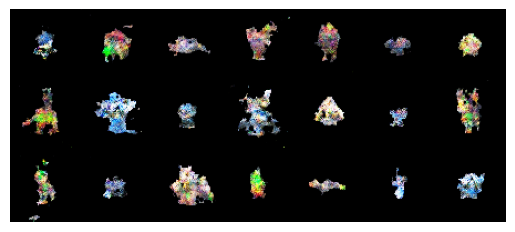

Epoch 7701, Loss_D 7.266, Loss_G 208.075, Time 0.70 sec
Epoch 7702, Loss_D 7.938, Loss_G 203.975, Time 0.70 sec
Epoch 7703, Loss_D 7.400, Loss_G 207.463, Time 0.71 sec
Epoch 7704, Loss_D 7.377, Loss_G 214.101, Time 0.70 sec
Epoch 7705, Loss_D 7.219, Loss_G 209.965, Time 0.70 sec
Epoch 7706, Loss_D 8.141, Loss_G 212.674, Time 0.71 sec
Epoch 7707, Loss_D 7.429, Loss_G 211.506, Time 0.70 sec
Epoch 7708, Loss_D 8.268, Loss_G 205.586, Time 0.70 sec
Epoch 7709, Loss_D 7.900, Loss_G 210.824, Time 0.70 sec
Epoch 7710, Loss_D 6.776, Loss_G 216.293, Time 0.71 sec
Epoch 7711, Loss_D 7.747, Loss_G 209.885, Time 0.73 sec
Epoch 7712, Loss_D 7.315, Loss_G 215.375, Time 0.73 sec
Epoch 7713, Loss_D 7.312, Loss_G 211.119, Time 0.74 sec
Epoch 7714, Loss_D 5.920, Loss_G 212.269, Time 0.73 sec
Epoch 7715, Loss_D 7.660, Loss_G 212.865, Time 0.74 sec
Epoch 7716, Loss_D 7.449, Loss_G 221.852, Time 0.74 sec
Epoch 7717, Loss_D 7.115, Loss_G 209.626, Time 0.72 sec
Epoch 7718, Loss_D 6.854, Loss_G 214.607, Time 0

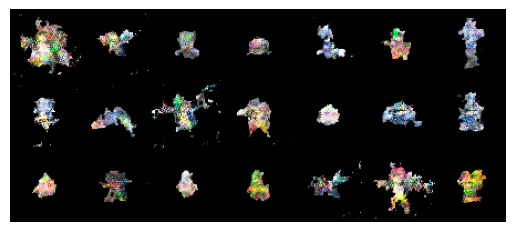

Epoch 7801, Loss_D 7.362, Loss_G 236.270, Time 0.71 sec
Epoch 7802, Loss_D 6.571, Loss_G 245.443, Time 0.70 sec
Epoch 7803, Loss_D 6.352, Loss_G 231.779, Time 0.70 sec
Epoch 7804, Loss_D 6.414, Loss_G 236.026, Time 0.71 sec
Epoch 7805, Loss_D 5.844, Loss_G 238.221, Time 0.70 sec
Epoch 7806, Loss_D 9.418, Loss_G 248.812, Time 0.72 sec
Epoch 7807, Loss_D 19.923, Loss_G 253.984, Time 0.70 sec
Epoch 7808, Loss_D 6.487, Loss_G 235.255, Time 0.71 sec
Epoch 7809, Loss_D 6.011, Loss_G 239.711, Time 0.70 sec
Epoch 7810, Loss_D 5.720, Loss_G 238.603, Time 0.70 sec
Epoch 7811, Loss_D 6.376, Loss_G 237.423, Time 0.70 sec
Epoch 7812, Loss_D 6.356, Loss_G 242.712, Time 0.70 sec
Epoch 7813, Loss_D 6.789, Loss_G 240.301, Time 0.71 sec
Epoch 7814, Loss_D 7.373, Loss_G 249.038, Time 0.71 sec
Epoch 7815, Loss_D 7.217, Loss_G 241.060, Time 0.70 sec
Epoch 7816, Loss_D 5.960, Loss_G 241.977, Time 0.71 sec
Epoch 7817, Loss_D 5.103, Loss_G 239.246, Time 0.70 sec
Epoch 7818, Loss_D 5.613, Loss_G 230.771, Time 

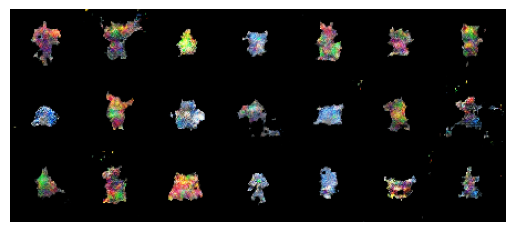

Epoch 7901, Loss_D 3.959, Loss_G 248.296, Time 0.70 sec
Epoch 7902, Loss_D 4.579, Loss_G 263.099, Time 0.71 sec
Epoch 7903, Loss_D 5.490, Loss_G 248.081, Time 0.71 sec
Epoch 7904, Loss_D 4.731, Loss_G 258.593, Time 0.71 sec
Epoch 7905, Loss_D 4.569, Loss_G 263.809, Time 0.71 sec
Epoch 7906, Loss_D 5.804, Loss_G 260.009, Time 0.71 sec
Epoch 7907, Loss_D 4.790, Loss_G 251.684, Time 0.71 sec
Epoch 7908, Loss_D 4.209, Loss_G 252.030, Time 0.71 sec
Epoch 7909, Loss_D 4.942, Loss_G 265.452, Time 0.71 sec
Epoch 7910, Loss_D 5.156, Loss_G 257.815, Time 0.70 sec
Epoch 7911, Loss_D 5.355, Loss_G 269.637, Time 0.70 sec
Epoch 7912, Loss_D 5.445, Loss_G 254.602, Time 0.71 sec
Epoch 7913, Loss_D 5.192, Loss_G 265.838, Time 0.71 sec
Epoch 7914, Loss_D 6.925, Loss_G 262.486, Time 0.71 sec
Epoch 7915, Loss_D 4.887, Loss_G 255.464, Time 0.71 sec
Epoch 7916, Loss_D 5.267, Loss_G 264.593, Time 0.70 sec
Epoch 7917, Loss_D 4.111, Loss_G 261.007, Time 0.71 sec
Epoch 7918, Loss_D 6.175, Loss_G 271.075, Time 0

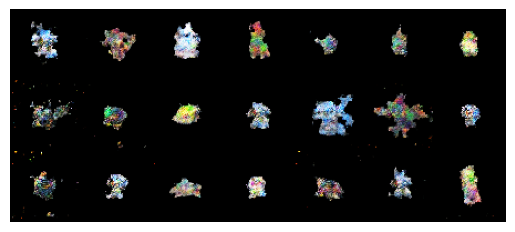

Epoch 8001, Loss_D 3.735, Loss_G 271.018, Time 0.71 sec
Epoch 8002, Loss_D 3.631, Loss_G 267.959, Time 0.71 sec
Epoch 8003, Loss_D 3.258, Loss_G 266.620, Time 0.73 sec
Epoch 8004, Loss_D 3.350, Loss_G 268.230, Time 0.73 sec
Epoch 8005, Loss_D 3.510, Loss_G 264.919, Time 0.72 sec
Epoch 8006, Loss_D 3.631, Loss_G 276.117, Time 0.74 sec
Epoch 8007, Loss_D 3.378, Loss_G 275.104, Time 0.74 sec
Epoch 8008, Loss_D 3.622, Loss_G 267.918, Time 0.72 sec
Epoch 8009, Loss_D 3.159, Loss_G 274.453, Time 0.76 sec
Epoch 8010, Loss_D 3.699, Loss_G 272.895, Time 0.71 sec
Epoch 8011, Loss_D 3.472, Loss_G 276.113, Time 0.71 sec
Epoch 8012, Loss_D 3.997, Loss_G 269.581, Time 0.70 sec
Epoch 8013, Loss_D 3.385, Loss_G 272.222, Time 0.72 sec
Epoch 8014, Loss_D 3.517, Loss_G 273.546, Time 0.71 sec
Epoch 8015, Loss_D 3.986, Loss_G 270.338, Time 0.70 sec
Epoch 8016, Loss_D 3.441, Loss_G 280.238, Time 0.71 sec
Epoch 8017, Loss_D 3.691, Loss_G 283.294, Time 0.71 sec
Epoch 8018, Loss_D 3.505, Loss_G 278.997, Time 0

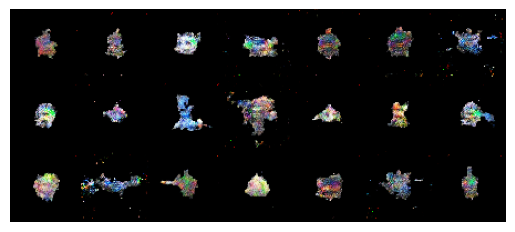

Epoch 8101, Loss_D 3.103, Loss_G 284.855, Time 0.72 sec
Epoch 8102, Loss_D 3.467, Loss_G 294.195, Time 0.71 sec
Epoch 8103, Loss_D 5.137, Loss_G 291.898, Time 0.71 sec
Epoch 8104, Loss_D 3.361, Loss_G 286.604, Time 0.70 sec
Epoch 8105, Loss_D 2.912, Loss_G 286.987, Time 0.72 sec
Epoch 8106, Loss_D 3.048, Loss_G 285.633, Time 0.72 sec
Epoch 8107, Loss_D 4.039, Loss_G 291.093, Time 0.71 sec
Epoch 8108, Loss_D 2.683, Loss_G 284.945, Time 0.72 sec
Epoch 8109, Loss_D 3.328, Loss_G 289.003, Time 0.71 sec
Epoch 8110, Loss_D 3.353, Loss_G 283.899, Time 0.71 sec
Epoch 8111, Loss_D 3.413, Loss_G 293.237, Time 0.71 sec
Epoch 8112, Loss_D 4.098, Loss_G 288.270, Time 0.71 sec
Epoch 8113, Loss_D 3.854, Loss_G 302.905, Time 0.71 sec
Epoch 8114, Loss_D 4.801, Loss_G 299.267, Time 0.72 sec
Epoch 8115, Loss_D 6.329, Loss_G 297.260, Time 0.71 sec
Epoch 8116, Loss_D 4.191, Loss_G 294.649, Time 0.70 sec
Epoch 8117, Loss_D 3.036, Loss_G 287.476, Time 0.71 sec
Epoch 8118, Loss_D 2.424, Loss_G 290.450, Time 0

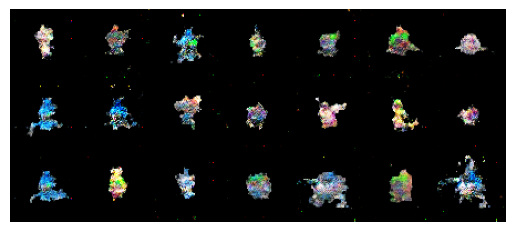

Epoch 8201, Loss_D 2.351, Loss_G 299.815, Time 0.72 sec
Epoch 8202, Loss_D 2.660, Loss_G 297.492, Time 0.70 sec
Epoch 8203, Loss_D 2.493, Loss_G 297.579, Time 0.71 sec
Epoch 8204, Loss_D 2.773, Loss_G 308.926, Time 0.76 sec
Epoch 8205, Loss_D 2.760, Loss_G 299.784, Time 0.71 sec
Epoch 8206, Loss_D 2.616, Loss_G 292.371, Time 0.72 sec
Epoch 8207, Loss_D 3.276, Loss_G 300.592, Time 0.71 sec
Epoch 8208, Loss_D 2.749, Loss_G 301.534, Time 0.71 sec
Epoch 8209, Loss_D 2.904, Loss_G 306.222, Time 0.71 sec
Epoch 8210, Loss_D 3.239, Loss_G 305.631, Time 0.71 sec
Epoch 8211, Loss_D 3.630, Loss_G 305.045, Time 0.73 sec
Epoch 8212, Loss_D 2.904, Loss_G 306.874, Time 0.73 sec
Epoch 8213, Loss_D 2.645, Loss_G 299.367, Time 0.74 sec
Epoch 8214, Loss_D 2.493, Loss_G 298.958, Time 0.73 sec
Epoch 8215, Loss_D 2.911, Loss_G 308.847, Time 0.74 sec
Epoch 8216, Loss_D 2.698, Loss_G 305.926, Time 0.75 sec
Epoch 8217, Loss_D 3.622, Loss_G 300.655, Time 0.73 sec
Epoch 8218, Loss_D 2.530, Loss_G 304.250, Time 0

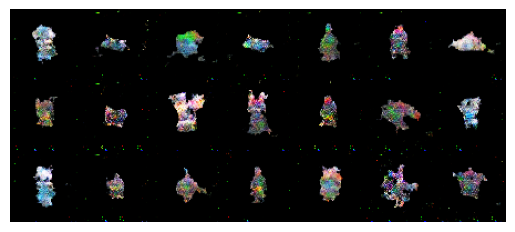

Epoch 8301, Loss_D 3.500, Loss_G 316.490, Time 0.72 sec
Epoch 8302, Loss_D 2.424, Loss_G 311.255, Time 0.70 sec
Epoch 8303, Loss_D 3.130, Loss_G 306.383, Time 0.71 sec
Epoch 8304, Loss_D 3.123, Loss_G 307.416, Time 0.71 sec
Epoch 8305, Loss_D 3.807, Loss_G 320.640, Time 0.71 sec
Epoch 8306, Loss_D 3.408, Loss_G 321.961, Time 0.71 sec
Epoch 8307, Loss_D 3.068, Loss_G 318.201, Time 0.70 sec
Epoch 8308, Loss_D 2.712, Loss_G 310.132, Time 0.75 sec
Epoch 8309, Loss_D 2.985, Loss_G 312.505, Time 0.72 sec
Epoch 8310, Loss_D 3.318, Loss_G 310.647, Time 0.71 sec
Epoch 8311, Loss_D 2.334, Loss_G 318.192, Time 0.71 sec
Epoch 8312, Loss_D 3.730, Loss_G 325.558, Time 0.71 sec
Epoch 8313, Loss_D 2.336, Loss_G 308.857, Time 0.71 sec
Epoch 8314, Loss_D 3.557, Loss_G 319.670, Time 0.71 sec
Epoch 8315, Loss_D 4.322, Loss_G 323.373, Time 0.71 sec
Epoch 8316, Loss_D 2.653, Loss_G 318.898, Time 0.72 sec
Epoch 8317, Loss_D 2.463, Loss_G 312.035, Time 0.71 sec
Epoch 8318, Loss_D 17.493, Loss_G 403.809, Time 

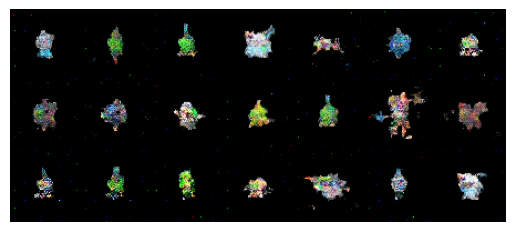

Epoch 8401, Loss_D 2.791, Loss_G 322.229, Time 0.71 sec
Epoch 8402, Loss_D 2.430, Loss_G 321.241, Time 0.71 sec
Epoch 8403, Loss_D 2.187, Loss_G 322.391, Time 0.71 sec
Epoch 8404, Loss_D 2.564, Loss_G 317.442, Time 0.71 sec
Epoch 8405, Loss_D 2.226, Loss_G 327.580, Time 0.71 sec
Epoch 8406, Loss_D 2.644, Loss_G 321.772, Time 0.71 sec
Epoch 8407, Loss_D 4.647, Loss_G 324.020, Time 0.70 sec
Epoch 8408, Loss_D 4.819, Loss_G 332.913, Time 0.70 sec
Epoch 8409, Loss_D 2.454, Loss_G 319.010, Time 0.71 sec
Epoch 8410, Loss_D 2.006, Loss_G 322.175, Time 0.70 sec
Epoch 8411, Loss_D 2.811, Loss_G 332.489, Time 0.71 sec
Epoch 8412, Loss_D 3.654, Loss_G 320.132, Time 0.71 sec
Epoch 8413, Loss_D 2.115, Loss_G 319.968, Time 0.71 sec
Epoch 8414, Loss_D 2.347, Loss_G 318.778, Time 0.71 sec
Epoch 8415, Loss_D 2.426, Loss_G 320.742, Time 0.71 sec
Epoch 8416, Loss_D 2.538, Loss_G 327.756, Time 0.70 sec
Epoch 8417, Loss_D 2.012, Loss_G 330.668, Time 0.71 sec
Epoch 8418, Loss_D 24.065, Loss_G 366.987, Time 

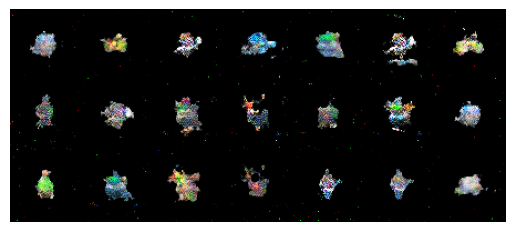

Epoch 8501, Loss_D 1.700, Loss_G 329.515, Time 0.71 sec
Epoch 8502, Loss_D 3.479, Loss_G 349.705, Time 0.71 sec
Epoch 8503, Loss_D 2.002, Loss_G 340.615, Time 0.72 sec
Epoch 8504, Loss_D 2.067, Loss_G 335.495, Time 0.73 sec
Epoch 8505, Loss_D 2.150, Loss_G 343.310, Time 0.73 sec
Epoch 8506, Loss_D 2.074, Loss_G 337.610, Time 0.73 sec
Epoch 8507, Loss_D 6.058, Loss_G 356.037, Time 0.73 sec
Epoch 8508, Loss_D 2.594, Loss_G 339.592, Time 0.73 sec
Epoch 8509, Loss_D 1.807, Loss_G 335.764, Time 0.73 sec
Epoch 8510, Loss_D 1.811, Loss_G 331.097, Time 0.71 sec
Epoch 8511, Loss_D 1.513, Loss_G 330.068, Time 0.70 sec
Epoch 8512, Loss_D 1.936, Loss_G 336.264, Time 0.71 sec
Epoch 8513, Loss_D 18.928, Loss_G 421.013, Time 0.70 sec
Epoch 8514, Loss_D 5.860, Loss_G 367.205, Time 0.70 sec
Epoch 8515, Loss_D 2.500, Loss_G 335.397, Time 0.70 sec
Epoch 8516, Loss_D 2.115, Loss_G 349.183, Time 0.71 sec
Epoch 8517, Loss_D 2.680, Loss_G 341.233, Time 0.71 sec
Epoch 8518, Loss_D 2.753, Loss_G 352.460, Time 

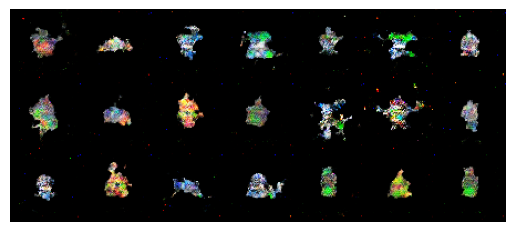

Epoch 8601, Loss_D 1.884, Loss_G 347.854, Time 0.70 sec
Epoch 8602, Loss_D 1.786, Loss_G 350.273, Time 0.71 sec
Epoch 8603, Loss_D 1.349, Loss_G 339.713, Time 0.71 sec
Epoch 8604, Loss_D 1.900, Loss_G 340.906, Time 0.71 sec
Epoch 8605, Loss_D 3.172, Loss_G 347.771, Time 0.71 sec
Epoch 8606, Loss_D 2.037, Loss_G 346.274, Time 0.71 sec
Epoch 8607, Loss_D 1.810, Loss_G 327.628, Time 0.71 sec
Epoch 8608, Loss_D 1.459, Loss_G 343.655, Time 0.71 sec
Epoch 8609, Loss_D 1.669, Loss_G 346.642, Time 0.71 sec
Epoch 8610, Loss_D 2.448, Loss_G 350.223, Time 0.71 sec
Epoch 8611, Loss_D 3.002, Loss_G 349.445, Time 0.70 sec
Epoch 8612, Loss_D 1.958, Loss_G 342.175, Time 0.71 sec
Epoch 8613, Loss_D 1.910, Loss_G 348.309, Time 0.71 sec
Epoch 8614, Loss_D 1.503, Loss_G 342.640, Time 0.71 sec
Epoch 8615, Loss_D 1.719, Loss_G 343.461, Time 0.71 sec
Epoch 8616, Loss_D 2.037, Loss_G 353.403, Time 0.71 sec
Epoch 8617, Loss_D 2.033, Loss_G 344.376, Time 0.71 sec
Epoch 8618, Loss_D 2.173, Loss_G 336.876, Time 0

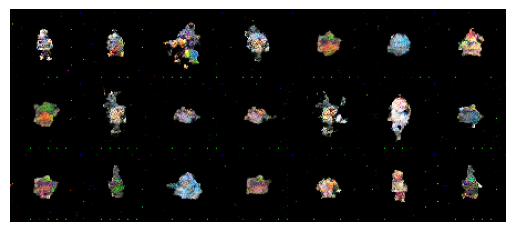

Epoch 8701, Loss_D 2.060, Loss_G 333.396, Time 0.71 sec
Epoch 8702, Loss_D 3.080, Loss_G 351.707, Time 0.71 sec
Epoch 8703, Loss_D 2.450, Loss_G 350.398, Time 0.71 sec
Epoch 8704, Loss_D 1.785, Loss_G 347.400, Time 0.73 sec
Epoch 8705, Loss_D 2.096, Loss_G 342.869, Time 0.71 sec
Epoch 8706, Loss_D 2.096, Loss_G 350.462, Time 0.70 sec
Epoch 8707, Loss_D 6.282, Loss_G 387.975, Time 0.70 sec
Epoch 8708, Loss_D 2.594, Loss_G 367.341, Time 0.71 sec
Epoch 8709, Loss_D 1.469, Loss_G 357.715, Time 0.70 sec
Epoch 8710, Loss_D 1.830, Loss_G 358.786, Time 0.70 sec
Epoch 8711, Loss_D 1.440, Loss_G 350.748, Time 0.70 sec
Epoch 8712, Loss_D 1.656, Loss_G 351.720, Time 0.74 sec
Epoch 8713, Loss_D 2.335, Loss_G 360.582, Time 0.74 sec
Epoch 8714, Loss_D 26.451, Loss_G 483.490, Time 0.74 sec
Epoch 8715, Loss_D 3.298, Loss_G 371.498, Time 0.73 sec
Epoch 8716, Loss_D 1.631, Loss_G 358.239, Time 0.77 sec
Epoch 8717, Loss_D 2.332, Loss_G 363.112, Time 0.73 sec
Epoch 8718, Loss_D 2.219, Loss_G 374.032, Time 

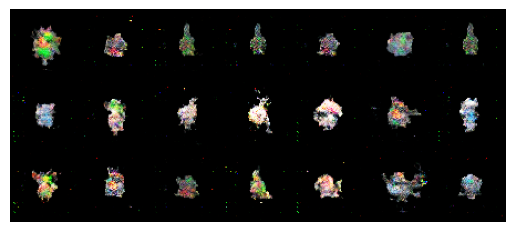

Epoch 8801, Loss_D 1.552, Loss_G 354.180, Time 0.76 sec
Epoch 8802, Loss_D 1.613, Loss_G 353.021, Time 0.74 sec
Epoch 8803, Loss_D 1.548, Loss_G 347.619, Time 0.71 sec
Epoch 8804, Loss_D 1.543, Loss_G 342.350, Time 0.71 sec
Epoch 8805, Loss_D 1.854, Loss_G 348.764, Time 0.71 sec
Epoch 8806, Loss_D 2.111, Loss_G 347.362, Time 0.70 sec
Epoch 8807, Loss_D 2.376, Loss_G 353.645, Time 0.71 sec
Epoch 8808, Loss_D 1.680, Loss_G 354.538, Time 0.72 sec
Epoch 8809, Loss_D 1.482, Loss_G 357.703, Time 0.71 sec
Epoch 8810, Loss_D 2.264, Loss_G 342.508, Time 0.70 sec
Epoch 8811, Loss_D 46.867, Loss_G 555.296, Time 0.71 sec
Epoch 8812, Loss_D 7.339, Loss_G 363.258, Time 0.71 sec
Epoch 8813, Loss_D 2.433, Loss_G 330.191, Time 0.71 sec
Epoch 8814, Loss_D 1.731, Loss_G 347.568, Time 0.74 sec
Epoch 8815, Loss_D 1.403, Loss_G 335.811, Time 0.71 sec
Epoch 8816, Loss_D 1.992, Loss_G 337.816, Time 0.70 sec
Epoch 8817, Loss_D 2.129, Loss_G 336.991, Time 0.71 sec
Epoch 8818, Loss_D 1.566, Loss_G 354.112, Time 

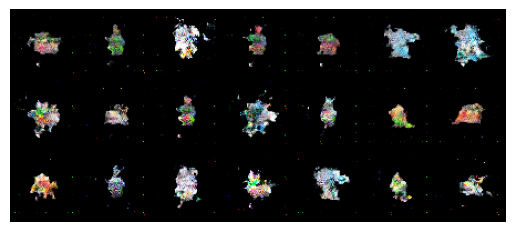

Epoch 8901, Loss_D 2.767, Loss_G 358.635, Time 0.70 sec
Epoch 8902, Loss_D 4.036, Loss_G 374.254, Time 0.69 sec
Epoch 8903, Loss_D 2.993, Loss_G 363.558, Time 0.70 sec
Epoch 8904, Loss_D 1.568, Loss_G 357.145, Time 0.70 sec
Epoch 8905, Loss_D 2.033, Loss_G 357.301, Time 0.69 sec
Epoch 8906, Loss_D 2.254, Loss_G 349.838, Time 0.69 sec
Epoch 8907, Loss_D 2.364, Loss_G 377.012, Time 0.70 sec
Epoch 8908, Loss_D 2.643, Loss_G 344.814, Time 0.70 sec
Epoch 8909, Loss_D 2.440, Loss_G 365.014, Time 0.69 sec
Epoch 8910, Loss_D 1.725, Loss_G 356.708, Time 0.69 sec
Epoch 8911, Loss_D 25.326, Loss_G 465.943, Time 0.70 sec
Epoch 8912, Loss_D 4.751, Loss_G 387.070, Time 0.70 sec
Epoch 8913, Loss_D 2.193, Loss_G 369.590, Time 0.69 sec
Epoch 8914, Loss_D 1.423, Loss_G 366.273, Time 0.70 sec
Epoch 8915, Loss_D 2.269, Loss_G 379.842, Time 0.70 sec
Epoch 8916, Loss_D 1.618, Loss_G 355.398, Time 0.69 sec
Epoch 8917, Loss_D 1.376, Loss_G 358.707, Time 0.70 sec
Epoch 8918, Loss_D 1.468, Loss_G 356.000, Time 

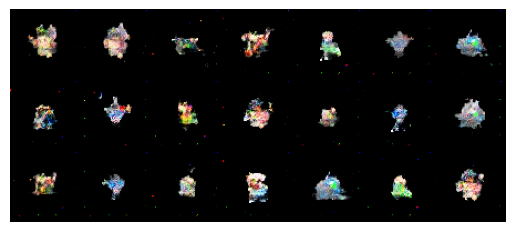

Epoch 9001, Loss_D 2.123, Loss_G 352.433, Time 0.70 sec
Epoch 9002, Loss_D 1.400, Loss_G 364.695, Time 0.70 sec
Epoch 9003, Loss_D 1.548, Loss_G 365.505, Time 0.69 sec
Epoch 9004, Loss_D 1.591, Loss_G 359.468, Time 0.70 sec
Epoch 9005, Loss_D 1.198, Loss_G 369.211, Time 0.70 sec
Epoch 9006, Loss_D 1.812, Loss_G 369.070, Time 0.73 sec
Epoch 9007, Loss_D 1.734, Loss_G 377.891, Time 0.72 sec
Epoch 9008, Loss_D 1.723, Loss_G 358.059, Time 0.75 sec
Epoch 9009, Loss_D 1.068, Loss_G 359.644, Time 0.72 sec
Epoch 9010, Loss_D 1.314, Loss_G 370.604, Time 0.72 sec
Epoch 9011, Loss_D 1.249, Loss_G 369.561, Time 0.72 sec
Epoch 9012, Loss_D 1.414, Loss_G 365.409, Time 0.72 sec
Epoch 9013, Loss_D 1.154, Loss_G 364.488, Time 0.70 sec
Epoch 9014, Loss_D 1.345, Loss_G 368.330, Time 0.69 sec
Epoch 9015, Loss_D 1.654, Loss_G 369.435, Time 0.69 sec
Epoch 9016, Loss_D 1.639, Loss_G 362.936, Time 0.70 sec
Epoch 9017, Loss_D 1.946, Loss_G 379.144, Time 0.68 sec
Epoch 9018, Loss_D 1.278, Loss_G 380.070, Time 0

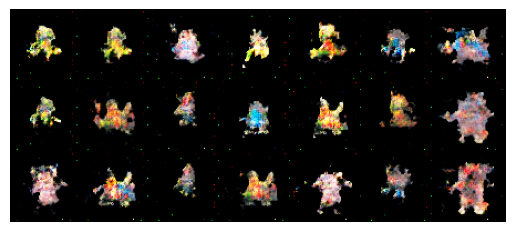

Epoch 9101, Loss_D 5.808, Loss_G 395.560, Time 0.69 sec
Epoch 9102, Loss_D 11.539, Loss_G 404.270, Time 0.71 sec
Epoch 9103, Loss_D 7.418, Loss_G 420.759, Time 0.69 sec
Epoch 9104, Loss_D 5.273, Loss_G 407.729, Time 0.69 sec
Epoch 9105, Loss_D 6.990, Loss_G 424.884, Time 0.69 sec
Epoch 9106, Loss_D 7.740, Loss_G 420.125, Time 0.69 sec
Epoch 9107, Loss_D 5.152, Loss_G 408.294, Time 0.69 sec
Epoch 9108, Loss_D 6.502, Loss_G 397.204, Time 0.70 sec
Epoch 9109, Loss_D 4.898, Loss_G 394.683, Time 0.69 sec
Epoch 9110, Loss_D 4.516, Loss_G 395.159, Time 0.69 sec
Epoch 9111, Loss_D 5.024, Loss_G 383.374, Time 0.69 sec
Epoch 9112, Loss_D 5.707, Loss_G 394.720, Time 0.70 sec
Epoch 9113, Loss_D 7.427, Loss_G 384.007, Time 0.69 sec
Epoch 9114, Loss_D 5.259, Loss_G 397.076, Time 0.69 sec
Epoch 9115, Loss_D 6.217, Loss_G 395.556, Time 0.69 sec
Epoch 9116, Loss_D 6.995, Loss_G 420.415, Time 0.70 sec
Epoch 9117, Loss_D 4.646, Loss_G 399.128, Time 0.70 sec
Epoch 9118, Loss_D 5.186, Loss_G 405.591, Time 

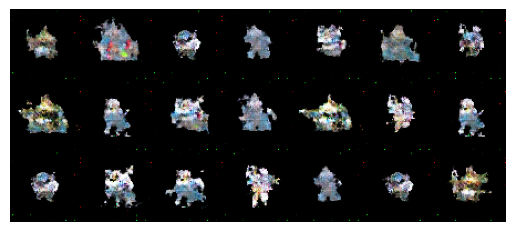

Epoch 9201, Loss_D 2.176, Loss_G 367.607, Time 0.70 sec
Epoch 9202, Loss_D 2.062, Loss_G 342.726, Time 0.71 sec
Epoch 9203, Loss_D 1.845, Loss_G 358.542, Time 0.70 sec
Epoch 9204, Loss_D 2.343, Loss_G 351.993, Time 0.70 sec
Epoch 9205, Loss_D 3.622, Loss_G 371.688, Time 0.71 sec
Epoch 9206, Loss_D 1.533, Loss_G 360.305, Time 0.71 sec
Epoch 9207, Loss_D 1.954, Loss_G 359.071, Time 0.71 sec
Epoch 9208, Loss_D 2.471, Loss_G 348.415, Time 0.71 sec
Epoch 9209, Loss_D 2.719, Loss_G 372.063, Time 0.71 sec
Epoch 9210, Loss_D 2.686, Loss_G 372.829, Time 0.71 sec
Epoch 9211, Loss_D 2.781, Loss_G 366.604, Time 0.70 sec
Epoch 9212, Loss_D 2.993, Loss_G 370.060, Time 0.71 sec
Epoch 9213, Loss_D 1.756, Loss_G 368.433, Time 0.70 sec
Epoch 9214, Loss_D 1.891, Loss_G 369.905, Time 0.70 sec
Epoch 9215, Loss_D 3.039, Loss_G 365.501, Time 0.75 sec
Epoch 9216, Loss_D 2.006, Loss_G 381.347, Time 0.71 sec
Epoch 9217, Loss_D 2.338, Loss_G 380.500, Time 0.73 sec
Epoch 9218, Loss_D 1.369, Loss_G 370.452, Time 0

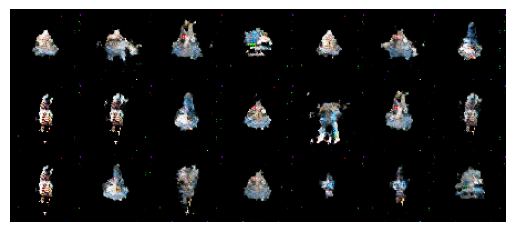

Epoch 9301, Loss_D 1.532, Loss_G 386.811, Time 0.72 sec
Epoch 9302, Loss_D 1.215, Loss_G 383.270, Time 0.76 sec
Epoch 9303, Loss_D 1.335, Loss_G 373.557, Time 0.75 sec
Epoch 9304, Loss_D 1.307, Loss_G 379.340, Time 0.74 sec
Epoch 9305, Loss_D 1.516, Loss_G 374.112, Time 0.74 sec
Epoch 9306, Loss_D 1.572, Loss_G 379.577, Time 0.74 sec
Epoch 9307, Loss_D 1.815, Loss_G 388.998, Time 0.74 sec
Epoch 9308, Loss_D 2.358, Loss_G 396.359, Time 0.70 sec
Epoch 9309, Loss_D 1.455, Loss_G 380.407, Time 0.71 sec
Epoch 9310, Loss_D 1.190, Loss_G 380.096, Time 0.71 sec
Epoch 9311, Loss_D 1.293, Loss_G 374.968, Time 0.71 sec
Epoch 9312, Loss_D 1.438, Loss_G 377.146, Time 0.71 sec
Epoch 9313, Loss_D 1.049, Loss_G 379.035, Time 0.71 sec
Epoch 9314, Loss_D 1.046, Loss_G 377.081, Time 0.71 sec
Epoch 9315, Loss_D 1.112, Loss_G 376.191, Time 0.70 sec
Epoch 9316, Loss_D 0.995, Loss_G 377.850, Time 0.71 sec
Epoch 9317, Loss_D 1.907, Loss_G 400.739, Time 0.71 sec
Epoch 9318, Loss_D 12.067, Loss_G 556.091, Time 

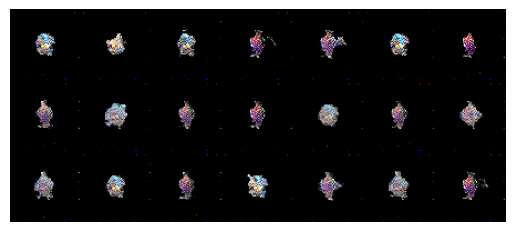

Epoch 9401, Loss_D 0.629, Loss_G 402.633, Time 0.70 sec
Epoch 9402, Loss_D 0.719, Loss_G 426.295, Time 0.70 sec
Epoch 9403, Loss_D 0.658, Loss_G 415.064, Time 0.70 sec
Epoch 9404, Loss_D 0.647, Loss_G 416.467, Time 0.71 sec
Epoch 9405, Loss_D 0.840, Loss_G 410.985, Time 0.69 sec
Epoch 9406, Loss_D 24.235, Loss_G 987.791, Time 0.70 sec
Epoch 9407, Loss_D 42.089, Loss_G 1418.361, Time 0.70 sec
Epoch 9408, Loss_D 2.006, Loss_G 705.265, Time 0.70 sec
Epoch 9409, Loss_D 2.581, Loss_G 702.323, Time 0.70 sec
Epoch 9410, Loss_D 3.352, Loss_G 831.471, Time 0.70 sec
Epoch 9411, Loss_D 3.204, Loss_G 1463.083, Time 0.70 sec
Epoch 9412, Loss_D 15.369, Loss_G 1683.002, Time 0.71 sec
Epoch 9413, Loss_D 20.553, Loss_G 1660.992, Time 0.70 sec
Epoch 9414, Loss_D 2.912, Loss_G 802.332, Time 0.70 sec
Epoch 9415, Loss_D 8.923, Loss_G 623.650, Time 0.69 sec
Epoch 9416, Loss_D 24.584, Loss_G 779.395, Time 0.70 sec
Epoch 9417, Loss_D 5.660, Loss_G 499.315, Time 0.70 sec
Epoch 9418, Loss_D 3.474, Loss_G 537.51

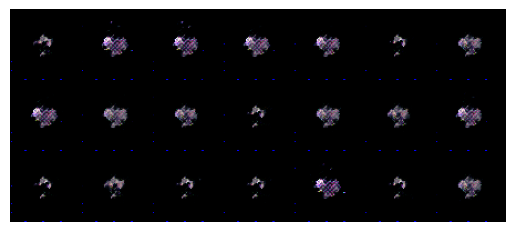

Epoch 9501, Loss_D 0.347, Loss_G 411.801, Time 0.71 sec
Epoch 9502, Loss_D 0.354, Loss_G 380.423, Time 0.70 sec
Epoch 9503, Loss_D 0.307, Loss_G 362.659, Time 0.71 sec
Epoch 9504, Loss_D 0.726, Loss_G 388.383, Time 0.72 sec
Epoch 9505, Loss_D 0.848, Loss_G 424.371, Time 0.71 sec
Epoch 9506, Loss_D 0.558, Loss_G 412.780, Time 0.70 sec
Epoch 9507, Loss_D 0.380, Loss_G 441.069, Time 0.71 sec
Epoch 9508, Loss_D 0.316, Loss_G 441.498, Time 0.71 sec
Epoch 9509, Loss_D 0.447, Loss_G 417.614, Time 0.70 sec
Epoch 9510, Loss_D 0.378, Loss_G 423.051, Time 0.71 sec
Epoch 9511, Loss_D 0.293, Loss_G 424.644, Time 0.73 sec
Epoch 9512, Loss_D 0.229, Loss_G 435.943, Time 0.73 sec
Epoch 9513, Loss_D 0.190, Loss_G 439.881, Time 0.72 sec
Epoch 9514, Loss_D 0.133, Loss_G 459.114, Time 0.73 sec
Epoch 9515, Loss_D 0.108, Loss_G 463.887, Time 0.73 sec
Epoch 9516, Loss_D 0.112, Loss_G 469.555, Time 0.72 sec
Epoch 9517, Loss_D 0.159, Loss_G 475.349, Time 0.72 sec
Epoch 9518, Loss_D 0.109, Loss_G 462.889, Time 0

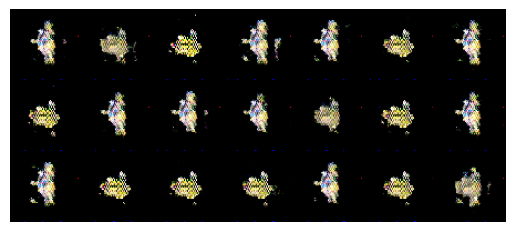

Epoch 9601, Loss_D 7.746, Loss_G 855.941, Time 0.72 sec
Epoch 9602, Loss_D 0.927, Loss_G 410.348, Time 0.71 sec
Epoch 9603, Loss_D 1.588, Loss_G 433.071, Time 0.70 sec
Epoch 9604, Loss_D 1.058, Loss_G 415.360, Time 0.71 sec
Epoch 9605, Loss_D 1.546, Loss_G 385.639, Time 0.70 sec
Epoch 9606, Loss_D 1.414, Loss_G 465.273, Time 0.70 sec
Epoch 9607, Loss_D 1.104, Loss_G 390.442, Time 0.71 sec
Epoch 9608, Loss_D 1.055, Loss_G 377.570, Time 0.71 sec
Epoch 9609, Loss_D 1.059, Loss_G 405.670, Time 0.70 sec
Epoch 9610, Loss_D 0.557, Loss_G 371.962, Time 0.73 sec
Epoch 9611, Loss_D 0.511, Loss_G 372.448, Time 0.71 sec
Epoch 9612, Loss_D 0.663, Loss_G 345.078, Time 0.71 sec
Epoch 9613, Loss_D 0.754, Loss_G 369.406, Time 0.71 sec
Epoch 9614, Loss_D 0.896, Loss_G 369.636, Time 0.71 sec
Epoch 9615, Loss_D 0.384, Loss_G 406.974, Time 0.71 sec
Epoch 9616, Loss_D 0.796, Loss_G 350.099, Time 0.72 sec
Epoch 9617, Loss_D 0.979, Loss_G 381.797, Time 0.71 sec
Epoch 9618, Loss_D 1.065, Loss_G 369.722, Time 0

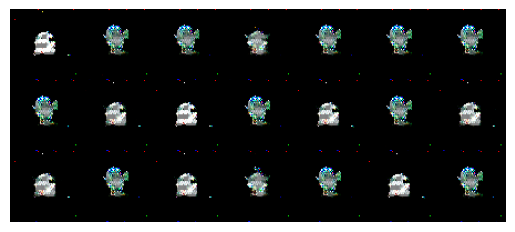

Epoch 9701, Loss_D 0.921, Loss_G 376.782, Time 0.71 sec
Epoch 9702, Loss_D 6.959, Loss_G 717.531, Time 0.71 sec
Epoch 9703, Loss_D 5.750, Loss_G 580.397, Time 0.70 sec
Epoch 9704, Loss_D 3.378, Loss_G 324.930, Time 0.70 sec
Epoch 9705, Loss_D 0.483, Loss_G 363.363, Time 0.70 sec
Epoch 9706, Loss_D 0.446, Loss_G 366.578, Time 0.71 sec
Epoch 9707, Loss_D 0.573, Loss_G 361.638, Time 0.71 sec
Epoch 9708, Loss_D 1.012, Loss_G 352.366, Time 0.71 sec
Epoch 9709, Loss_D 2.217, Loss_G 447.057, Time 0.71 sec
Epoch 9710, Loss_D 0.757, Loss_G 416.738, Time 0.71 sec
Epoch 9711, Loss_D 0.484, Loss_G 393.267, Time 0.70 sec
Epoch 9712, Loss_D 0.862, Loss_G 393.541, Time 0.71 sec
Epoch 9713, Loss_D 1.559, Loss_G 483.571, Time 0.70 sec
Epoch 9714, Loss_D 1.509, Loss_G 466.654, Time 0.71 sec
Epoch 9715, Loss_D 2.944, Loss_G 418.785, Time 0.70 sec
Epoch 9716, Loss_D 1.002, Loss_G 409.026, Time 0.71 sec
Epoch 9717, Loss_D 1.299, Loss_G 431.352, Time 0.71 sec
Epoch 9718, Loss_D 3.192, Loss_G 447.760, Time 0

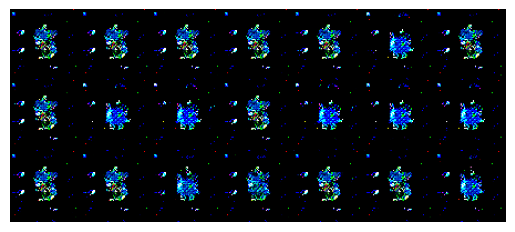

Epoch 9801, Loss_D 0.087, Loss_G 452.500, Time 0.70 sec
Epoch 9802, Loss_D 0.086, Loss_G 456.675, Time 0.70 sec
Epoch 9803, Loss_D 0.090, Loss_G 451.826, Time 0.72 sec
Epoch 9804, Loss_D 0.102, Loss_G 450.341, Time 0.73 sec
Epoch 9805, Loss_D 0.135, Loss_G 423.458, Time 0.73 sec
Epoch 9806, Loss_D 0.402, Loss_G 415.740, Time 0.73 sec
Epoch 9807, Loss_D 0.403, Loss_G 414.991, Time 0.73 sec
Epoch 9808, Loss_D 0.602, Loss_G 416.053, Time 0.75 sec
Epoch 9809, Loss_D 0.478, Loss_G 400.473, Time 0.74 sec
Epoch 9810, Loss_D 0.537, Loss_G 411.571, Time 0.72 sec
Epoch 9811, Loss_D 0.383, Loss_G 473.579, Time 0.71 sec
Epoch 9812, Loss_D 0.316, Loss_G 449.615, Time 0.71 sec
Epoch 9813, Loss_D 0.238, Loss_G 437.091, Time 0.70 sec
Epoch 9814, Loss_D 0.253, Loss_G 419.317, Time 0.71 sec
Epoch 9815, Loss_D 0.170, Loss_G 428.529, Time 0.71 sec
Epoch 9816, Loss_D 0.144, Loss_G 451.254, Time 0.71 sec
Epoch 9817, Loss_D 0.529, Loss_G 490.131, Time 0.71 sec
Epoch 9818, Loss_D 0.262, Loss_G 428.214, Time 0

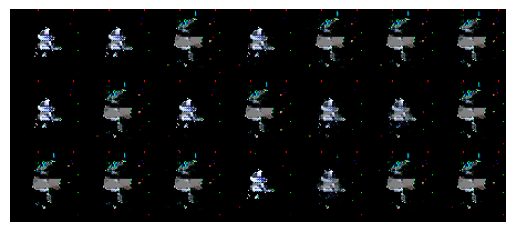

Epoch 9901, Loss_D 0.195, Loss_G 391.718, Time 0.71 sec
Epoch 9902, Loss_D 0.244, Loss_G 382.076, Time 0.71 sec
Epoch 9903, Loss_D 0.357, Loss_G 372.802, Time 0.71 sec
Epoch 9904, Loss_D 0.308, Loss_G 397.381, Time 0.70 sec
Epoch 9905, Loss_D 1.377, Loss_G 457.898, Time 0.71 sec
Epoch 9906, Loss_D 1.031, Loss_G 529.633, Time 0.70 sec
Epoch 9907, Loss_D 0.137, Loss_G 411.685, Time 0.70 sec
Epoch 9908, Loss_D 0.283, Loss_G 386.143, Time 0.71 sec
Epoch 9909, Loss_D 0.342, Loss_G 372.475, Time 0.71 sec
Epoch 9910, Loss_D 0.276, Loss_G 400.305, Time 0.70 sec
Epoch 9911, Loss_D 1.531, Loss_G 453.224, Time 0.70 sec
Epoch 9912, Loss_D 0.613, Loss_G 532.289, Time 0.70 sec
Epoch 9913, Loss_D 0.393, Loss_G 384.954, Time 0.71 sec
Epoch 9914, Loss_D 0.562, Loss_G 373.133, Time 0.71 sec
Epoch 9915, Loss_D 0.709, Loss_G 372.479, Time 0.71 sec
Epoch 9916, Loss_D 0.557, Loss_G 381.233, Time 0.71 sec
Epoch 9917, Loss_D 0.438, Loss_G 381.717, Time 0.71 sec
Epoch 9918, Loss_D 0.486, Loss_G 367.834, Time 0

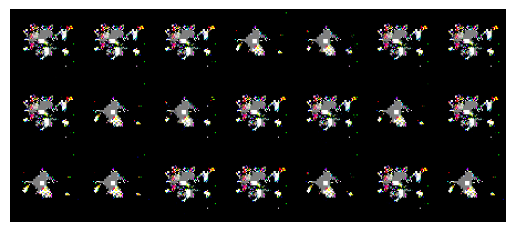

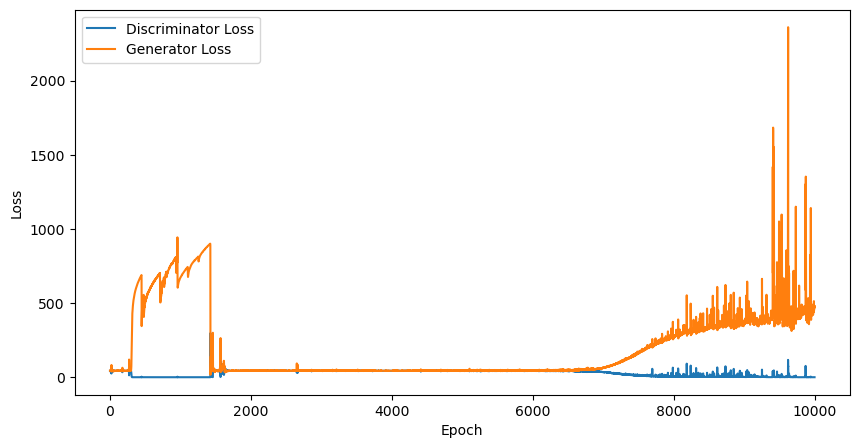

In [20]:
latent_dim, lr_D, lr_G, num_epochs = 100, 0.000099, 0.00071, 10000
train(net_D, net_G, data_iter, num_epochs, lr_D, lr_G, latent_dim)

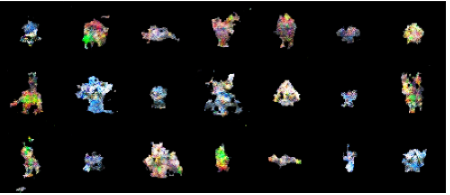

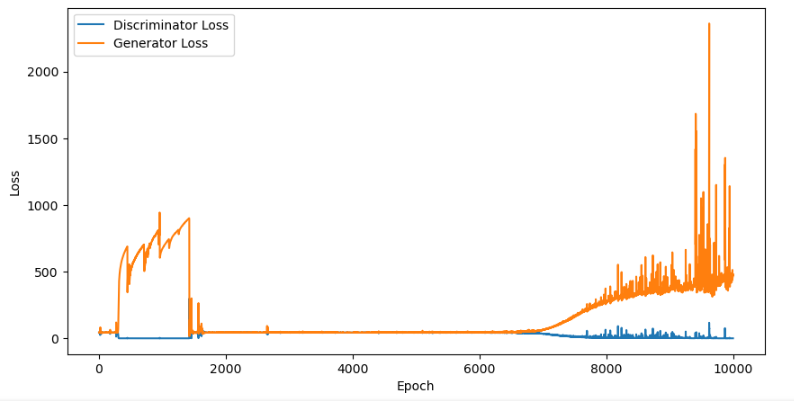